In [29]:
from __future__ import absolute_import, division, print_function, unicode_literals
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import re
import numpy as np
import os
import time
import json
from glob import glob
from PIL import Image
import pickle
import pandas as pd
from tqdm import tqdm
import csv
import pandas as pd
import cv2

## **PADCHEST_chest dataset download**

In [30]:
# from google_drive_downloader import GoogleDriveDownloader as gdd

# gdd.download_file_from_google_drive(file_id='1Ko22Ud16m1sfB-mNK2WBg9A0Qc6inuT9',
#                                     dest_path='./data/zero.zip',
#                                     unzip=True)


In [31]:
# url="https://drive.google.com/uc?id=1Y3isYNHXG7TeuzoxUTZzPD4xnqzQmQ-R"
# output ='PADCHEST_chest_x_ray_images_labels_160K_01.02.19.csv'
# gdown.download(url, output, quiet=False)

## **PADCHEST_chest Preproccessing**

In [32]:
# data_dir = 'C:/Users/markf/Desktop/PadChest/0'
csv_file = 'padchest_labels.csv'

def prepare_padchest_data():  
  with open(csv_file, newline='') as infile:
      # writer = csv.writer(outfile)
      reader = csv.DictReader(infile)
      fieldnames = ['ImageID', 'Report', 'Labels']
      data=[]
      for row in reader:
          filename=row["ImageID"]
          report="<start>"+row["Report"]+"<end>"
          Labels=row["Labels"]
          data.append([filename, report, Labels])
  df = pd.DataFrame(data, columns=fieldnames)
  print(df.describe())
  PATH = os.path.join(os.getcwd(),"0")  # replace 0 with the folder with images
  fieldnames_img = ['ImageID', 'Path']
  data_images=[]
  image_src = os.path.join(os.getcwd(), "0")  # replace 0 with the folder with images
  for root, dirs, images in os.walk(image_src):
    for image in images:
      image_name = image
      data_images.append([image_name ,os.path.join(image_src,image_name)])
  print("Size of available images: ", len(data_images))
  df_images = pd.DataFrame(data = data_images, columns = fieldnames_img)
  print(df_images.describe())
  data=pd.merge(df, df_images, on="ImageID")
  image_path=data.Path.tolist()
  image_captions= data.Report.tolist()
  return data, image_path, image_captions

In [33]:
data, all_img_name_vector, all_captions = prepare_padchest_data()
data.describe()

                                                  ImageID  \
count                                              160861   
unique                                             160861   
top     1284011361929414524682119191696751542351444145...   
freq                                                    1   

                                                 Report      Labels  
count                                            160861      160861  
unique                                            66162       28809  
top     <start> sin alter radiolog significacion .<end>  ['normal']  
freq                                               5095       50340  
Size of available images:  5980
                                                  ImageID  \
count                                                5980   
unique                                               5980   
top     99744230716892055301280916536204938895_oo9nk5.png   
freq                                                    1   

      

,ImageID,Report,Labels,Path
count,3004,3004,3004,3004
unique,3004,1465,867,3004
top,195776802678822897661611664229536656157_a0jgcd...,<start> sin hallazg signific .<end>,['normal'],c:\Users\markf\Desktop\Master's Diss Code\diss...
freq,1,172,920,1


# Preprocess the images using InceptionV3
Next, you will use InceptionV3 (which is pretrained on Imagenet) to classify each image. You will extract features from the last convolutional layer.

First, you will convert the images into InceptionV3's expected format by:
* Resizing the image to 299px by 299px
* [Preprocess the images](https://cloud.google.com/tpu/docs/inception-v3-advanced#preprocessing_stage) using the [preprocess_input](https://www.tensorflow.org/api_docs/python/tf/keras/applications/inception_v3/preprocess_input) method to normalize the image so that it contains pixels in the range of -1 to 1, which matches the format of the images used to train InceptionV3.

In [34]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

# Initialize InceptionV3 and load the pretrained Imagenet weights

Now you'll create a tf.keras model where the output layer is the last convolutional layer in the InceptionV3 architecture. The shape of the output of this layer is ```8x8x2048```. You use the last convolutional layer because you are using attention in this example. You don't perform this initialization during training because it could become a bottleneck.

* You forward each image through the network and store the resulting vector in a dictionary (image_name --> feature_vector).
* After all the images are passed through the network, you pickle the dictionary and save it to disk.




In [35]:
image_model = tf.keras.applications.InceptionV3(include_top=False,
                                                weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

# Caching the features extracted from InceptionV3

> Indented block



You will pre-process each image with InceptionV3 and cache the output to disk. Caching the output in RAM would be faster but also memory intensive, requiring 8 \* 8 \* 2048 floats per image. At the time of writing, this exceeds the memory limitations of Colab (currently 12GB of memory).

Performance could be improved with a more sophisticated caching strategy (for example, by sharding the images to reduce random access disk I/O), but that would require more code.

The caching will take about 10 minutes to run in Colab with a GPU. If you'd like to see a progress bar, you can: 

1. install [tqdm](https://github.com/tqdm/tqdm):

    `!pip install tqdm`

2. Import tqdm:

    `from tqdm import tqdm`

3. Change the following line:

    `for img, path in image_dataset:`

    to:

    `for img, path in tqdm(image_dataset):`


In [36]:
#img_name_vector, train_captions=all_img_name_vector, all_captions
img_name_vector, train_captions=all_img_name_vector[:3000], all_captions[:3000]

In [23]:
# # Get unique images
# encode_train = sorted(set(img_name_vector))

# # Feel free to change batch_size according to your system configuration
# image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
# image_dataset = image_dataset.map(
#   load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(32)

# for img, path in tqdm(image_dataset):
#   #print(path)
#   batch_features = image_features_extract_model(img)
#   batch_features = tf.reshape(batch_features,
#                               (batch_features.shape[0], -1, batch_features.shape[3]))

#   for bf, p in zip(batch_features, path):
#     path_of_feature = p.numpy().decode("utf-8")
#     np.save(path_of_feature, bf.numpy())

In [37]:
def load_image_opencv(image_path):
    # Decode image path
    image_path = image_path.numpy().decode('utf-8')
    
    # Read image using OpenCV
    image = cv2.imread(image_path)
    if image is None:
        print("Hey")
        raise ValueError(f"Image not found or invalid format: {image_path}")
    
    # Convert BGR to RGB (OpenCV loads as BGR by default)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Resize and normalize
    image = cv2.resize(image, (256, 256))
    image = image / 255.0
    
    return image, image_path


def load_image_wrapper(image_path):
    # Use tf.py_function to wrap the OpenCV function
    image, path = tf.py_function(
        load_image_opencv,
        [image_path],
        (tf.float32, tf.string)
    )
    image.set_shape((256, 256, 3))
    return image, path

# Get unique images
encode_train = sorted(set(img_name_vector))

# Create dataset
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
    load_image_wrapper, 
    num_parallel_calls=tf.data.AUTOTUNE
).batch(32)

# Process images
for img, path in tqdm(image_dataset):
    try:
        batch_features = image_features_extract_model(img)
        batch_features = tf.reshape(batch_features,
                                  (batch_features.shape[0], -1, batch_features.shape[3]))

        for bf, p in zip(batch_features, path):
            path_of_feature = p.numpy().decode("utf-8")
            np.save(path_of_feature, bf.numpy())
    except Exception as e:
        print(f"Error processing batch: {e}")
        # Print paths of problematic images
        print("Problematic paths in this batch:")
        for p in path:
            print(p.numpy().decode("utf-8"))

# TODO: JPEG decode error, fixed before, look for fix

 97%|█████████▋| 91/94 [04:04<00:07,  2.41s/it]

Hey
Hey
Hey


 99%|█████████▉| 93/94 [04:07<00:02,  2.66s/it]


InvalidArgumentError: {{function_node __wrapped__IteratorGetNext_output_types_2_device_/job:localhost/replica:0/task:0/device:CPU:0}} ValueError: Image not found or invalid format: c:\Users\markf\Desktop\Master's Diss Code\diss-cxr-xception\0\98217780532329340007300292761274285758_ph4ff3.png
Traceback (most recent call last):

  File "C:\Users\markf\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tensorflow\python\ops\script_ops.py", line 267, in __call__
    return func(device, token, args)
           ^^^^^^^^^^^^^^^^^^^^^^^^^

  File "C:\Users\markf\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tensorflow\python\ops\script_ops.py", line 145, in __call__
    outputs = self._call(device, args)
              ^^^^^^^^^^^^^^^^^^^^^^^^

  File "C:\Users\markf\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tensorflow\python\ops\script_ops.py", line 152, in _call
    ret = self._func(*args)
          ^^^^^^^^^^^^^^^^^

  File "C:\Users\markf\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tensorflow\python\autograph\impl\api.py", line 643, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^

  File "C:\Users\markf\AppData\Local\Temp\ipykernel_3140\857964025.py", line 9, in load_image_opencv
    raise ValueError(f"Image not found or invalid format: {image_path}")

ValueError: Image not found or invalid format: c:\Users\markf\Desktop\Master's Diss Code\diss-cxr-xception\0\98217780532329340007300292761274285758_ph4ff3.png


	 [[{{node EagerPyFunc}}]] [Op:IteratorGetNext] name: 

# Preprocess and tokenize the captions

* First, you'll tokenize the captions (for example, by splitting on spaces). This gives us a  vocabulary of all of the unique words in the data (for example, "surfing", "football", and so on).
* Next, you'll limit the vocabulary size to the top 5,000 words (to save memory). You'll replace all other words with the token "UNK" (unknown).
* You then create word-to-index and index-to-word mappings.
* Finally, you pad all sequences to be the same length as the longest one.

In [ ]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

In [ ]:
# Choose the top 5000 words from the vocabulary
top_k = 100000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [ ]:
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

In [ ]:
tokenizer.index_word[3]

'<end>'

In [ ]:
# Create the tokenized vectors
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [ ]:
# Pad each vector to the max_length of the captions
# If you do not provide a max_length value, pad_sequences calculates it automatically
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [ ]:
# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)

# Split the data into training and testing

In [ ]:
# Create training and validation sets using an 80-20 split
img_name_train, img_name_val, cap_train, cap_val = train_test_split(img_name_vector,
                                                                    cap_vector,
                                                                    test_size=0.2,
                                                                    random_state=0)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(2400, 2400, 600, 600)

# Create a tf.data dataset for training



 Our images and captions are ready! Next, let's create a tf.data dataset to use for training our model.

In [ ]:
# Feel free to change these parameters according to your system's configuration

BATCH_SIZE = 32
BUFFER_SIZE = 1000
embedding_dim = 256
units = 512
vocab_size = len(tokenizer.word_index) + 1
num_steps = len(img_name_train) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

In [ ]:
# Load the numpy files
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

# Model

Fun fact: the decoder below is identical to the one in the example for [Neural Machine Translation with Attention](../sequences/nmt_with_attention.ipynb).

The model architecture is inspired by the [Show, Attend and Tell](https://arxiv.org/pdf/1502.03044.pdf) paper.

* In this example, you extract the features from the lower convolutional layer of InceptionV3 giving us a vector of shape (8, 8, 2048).
* You squash that to a shape of (64, 2048).
* This vector is then passed through the CNN Encoder (which consists of a single Fully connected layer).
* The RNN (here GRU) attends over the image to predict the next word.

In [ ]:
class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)

    # score shape == (batch_size, 64, hidden_size)
    score = tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis))

    # attention_weights shape == (batch_size, 64, 1)
    # you get 1 at the last axis because you are applying score to self.V
    attention_weights = tf.nn.softmax(self.V(score), axis=1)

    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)

    return context_vector, attention_weights

In [ ]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it using pickle
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [ ]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)

    self.attention = BahdanauAttention(self.units)

  def call(self, x, features, hidden):
    # defining attention as a separate model
    context_vector, attention_weights = self.attention(features, hidden)

    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # output shape == (batch_size * max_length, vocab)
    x = self.fc2(x)

    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

## **Bayesian LSTM**


In [ ]:
# import tensorflow as tf
# from tensorflow.contrib.rnn import BasicLSTMCell, LSTMStateTuple, LSTMCell
# from model.utils import variationalPosterior


# class BayesianLSTMCell(LSTMCell):

#     def __init__(self, num_units, prior, is_training, name, **kwargs):

#         super(BayesianLSTMCell, self).__init__(num_units, **kwargs)

#         self.w = None
#         self.b = None
#         self.prior = prior
#         self.layer_name = name
#         self.isTraining = is_training
#         self.num_units = num_units
#         self.kl_loss=None

#         print("Creating lstm layer:" + name)


#     def call(self, inputs, state):

#         if self.w is None:

#             size = inputs.get_shape()[-1].value
#             self.w, self.w_mean, self.w_sd = variationalPosterior((size+self.num_units, 4*self.num_units), self.layer_name+'_weights', self.prior, self.isTraining)
#             self.b, self.b_mean, self.b_sd = variationalPosterior((4*self.num_units,1), self.layer_name+'_bias', self.prior, self.isTraining)

#         cell, hidden = state
#         concat_inputs_hidden = tf.concat([inputs, hidden], 1)
#         concat_inputs_hidden = tf.nn.bias_add(tf.matmul(concat_inputs_hidden, self.w), tf.squeeze(self.b))
#         # Gates: Input, New, Forget and Output
#         i, j, f, o = tf.split(value=concat_inputs_hidden, num_or_size_splits=4, axis=1)
#         new_cell = (cell * tf.sigmoid(f + self._forget_bias) + tf.sigmoid(i) * self._activation(j))
#         new_hidden = self._activation(new_cell) * tf.sigmoid(o)
#         new_state = LSTMStateTuple(new_cell, new_hidden)

#         return new_hidden, new_state

In [ ]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

In [ ]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

# Checkpoint

In [ ]:
checkpoint_path = "./checkpoints"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

# Training

* You extract the features stored in the respective `.npy` files and then pass those features through the encoder.
* The encoder output, hidden state(initialized to 0) and the decoder input (which is the start token) is passed to the decoder.
* The decoder returns the predictions and the decoder hidden state.
* The decoder hidden state is then passed back into the model and the predictions are used to calculate the loss.
* Use teacher forcing to decide the next input to the decoder.
* Teacher forcing is the technique where the target word is passed as the next input to the decoder.
* The final step is to calculate the gradients and apply it to the optimizer and backpropagate.


In [ ]:
import collections
import math


def _get_ngrams(segment, max_order):
  """Extracts all n-grams upto a given maximum order from an input segment.
  Args:
    segment: text segment from which n-grams will be extracted.
    max_order: maximum length in tokens of the n-grams returned by this
        methods.
  Returns:
    The Counter containing all n-grams upto max_order in segment
    with a count of how many times each n-gram occurred.
  """
  ngram_counts = collections.Counter()
  for order in range(1, max_order + 1):
    for i in range(0, len(segment) - order + 1):
      ngram = tuple(segment[i:i+order])
      ngram_counts[ngram] += 1
  return ngram_counts


def compute_bleu(reference_corpus, translation_corpus, max_order=4,
                 smooth=False):
  """Computes BLEU score of translated segments against one or more references.
  Args:
    reference_corpus: list of lists of references for each translation. Each
        reference should be tokenized into a list of tokens.
    translation_corpus: list of translations to score. Each translation
        should be tokenized into a list of tokens.
    max_order: Maximum n-gram order to use when computing BLEU score.
    smooth: Whether or not to apply Lin et al. 2004 smoothing.
  Returns:
    3-Tuple with the BLEU score, n-gram precisions, geometric mean of n-gram
    precisions and brevity penalty.
  """
  matches_by_order = [0] * max_order
  possible_matches_by_order = [0] * max_order
  reference_length = 0
  translation_length = 0
  for (references, translation) in zip(reference_corpus,
                                       translation_corpus):
    reference_length += min(len(r) for r in references)
    translation_length += len(translation)

    merged_ref_ngram_counts = collections.Counter()
    for reference in references:
      merged_ref_ngram_counts |= _get_ngrams(reference, max_order)
    translation_ngram_counts = _get_ngrams(translation, max_order)
    overlap = translation_ngram_counts & merged_ref_ngram_counts
    for ngram in overlap:
      matches_by_order[len(ngram)-1] += overlap[ngram]
    for order in range(1, max_order+1):
      possible_matches = len(translation) - order + 1
      if possible_matches > 0:
        possible_matches_by_order[order-1] += possible_matches

  precisions = [0] * max_order
  for i in range(0, max_order):
    if smooth:
      precisions[i] = ((matches_by_order[i] + 1.) /
                       (possible_matches_by_order[i] + 1.))
    else:
      if possible_matches_by_order[i] > 0:
        precisions[i] = (float(matches_by_order[i]) /
                         possible_matches_by_order[i])
      else:
        precisions[i] = 0.0

  if min(precisions) > 0:
    p_log_sum = sum((1. / max_order) * math.log(p) for p in precisions)
    geo_mean = math.exp(p_log_sum)
  else:
    geo_mean = 0

  ratio = float(translation_length) / reference_length

  if ratio > 1.0:
    bp = 1.
  else:
    bp = math.exp(1 - 1. / ratio)

  bleu = geo_mean * bp

  return (bleu, precisions, bp, ratio, translation_length, reference_length)

In [ ]:
# adding this in a separate cell because if you run the training cell
# many times, the loss_plot array will be reset
loss_plot = []

In [ ]:
@tf.function
def train_step(img_tensor, target):
  loss = 0
  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])
  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * BATCH_SIZE, 1)
  # dec_input = tf.expand_dims([tokenizer.word_index['the']] * BATCH_SIZE, 1)
  with tf.GradientTape() as tape:
      features = encoder(img_tensor)
      for i in tqdm(range(1, target.shape[1])):
          # passing the features through the decoder
          predictions, hidden, _ = decoder(dec_input, features, hidden)
          loss += loss_function(target[:, i], predictions)
          # bleu, precisions, bp, ratio, translation_length, reference_length=compute_bleu(target[:, i], predictions)
          # print(bleu, precisions, bp, ratio, translation_length, reference_length)
          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)
  total_loss = (loss / int(target.shape[1]))
  print("Calcualted total loss")

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables
  print("Got trainable vals")


  gradients = tape.gradient(loss, trainable_variables)
  print("Got grads")

  optimizer.apply_gradients(zip(gradients, trainable_variables))
  print("apply grads")

  return loss, total_loss

In [ ]:
EPOCHS = 30
allow_growth = True
for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0
    print(start)
    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        print(total_loss)
        if batch % 100 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(
              epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
      ckpt_manager.save()
    
    print ('Epoch {} Loss {:.6f}'.format(epoch + 1,
                                         total_loss/num_steps))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

1585162208.161155


100%|██████████| 65/65 [00:09<00:00,  7.01it/s]


Calcualted total loss
Got trainable vals
Got grads
apply grads


100%|██████████| 65/65 [00:08<00:00,  7.37it/s]


Calcualted total loss
Got trainable vals
Got grads
apply grads
tf.Tensor(1.4977939, shape=(), dtype=float32)
Epoch 1 Batch 0 Loss 1.4978
tf.Tensor(2.8228817, shape=(), dtype=float32)
tf.Tensor(4.264971, shape=(), dtype=float32)
tf.Tensor(5.60383, shape=(), dtype=float32)
tf.Tensor(6.6647663, shape=(), dtype=float32)
tf.Tensor(7.8903723, shape=(), dtype=float32)
tf.Tensor(9.058214, shape=(), dtype=float32)
tf.Tensor(10.395425, shape=(), dtype=float32)
tf.Tensor(11.7043495, shape=(), dtype=float32)
tf.Tensor(12.748323, shape=(), dtype=float32)
tf.Tensor(13.9263935, shape=(), dtype=float32)
tf.Tensor(15.043725, shape=(), dtype=float32)
tf.Tensor(16.26413, shape=(), dtype=float32)
tf.Tensor(17.322832, shape=(), dtype=float32)
tf.Tensor(18.601627, shape=(), dtype=float32)
tf.Tensor(19.851706, shape=(), dtype=float32)
tf.Tensor(20.971874, shape=(), dtype=float32)
tf.Tensor(22.121883, shape=(), dtype=float32)
tf.Tensor(23.140396, shape=(), dtype=float32)
tf.Tensor(24.41742, shape=(), dtype=fl

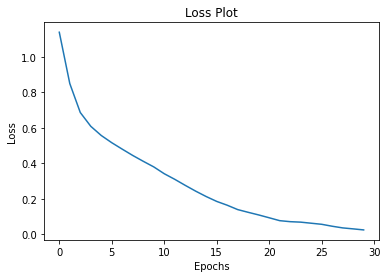

In [ ]:
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

# Caption!

* The evaluate function is similar to the training loop, except you don't use teacher forcing here. The input to the decoder at each time step is its previous predictions along with the hidden state and the encoder output.
* Stop predicting when the model predicts the end token.
* And store the attention weights for every time step.

In [ ]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [ ]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for l in range(len_result):
        if l != 0 and l%10 == 0:
          plt.tight_layout()
          plt.show()
          fig = plt.figure(figsize=(10, 10))

        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(2, 5, (l%10)+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()
    

    # temp_image = np.array(Image.open(image))

    

    # len_result = len(result)
    # for l in range(len_result):
    #   fig = plt.figure(figsize=(4, 4))
    #   temp_att = np.resize(attention_plot[l], (8, 8))
    #   ax = fig.add_subplot()
    #   ax.set_title(result[l])
    #   img = ax.imshow(temp_image)
    #   ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())
    #   plt.tight_layout()
    #   plt.show()
    

In [ ]:
!pip install googletrans

  Created wheel for googletrans: filename=googletrans-2.4.0-cp36-none-any.whl size=15777 sha256=53aac25595d61f5e18680bdfc5e2f6c1a16b81293708c9406fb0394269cb11cd
  Stored in directory: /root/.cache/pip/wheels/50/d6/e7/a8efd5f2427d5eb258070048718fa56ee5ac57fd6f53505f95
Successfully built googletrans


In [ ]:
translated_resut

Real Caption: Translated(src=ca, dest=en, text=<Start> Cambi sin <end>, pronunciation=<Start> Cambi sin <end>, extra_data="{'translat...")
Prediction Caption: comp <end>


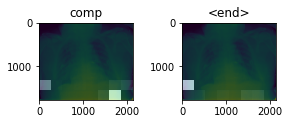

Real Caption: Translated(src=ca, dest=en, text=<Start> unsigned enfermed metastas current study without prior study Cambi respect FECH 18 05 2012 <end>, pronunciation=<Start> unsigned enfermed metastas current study without prior study Cambi respect FECH 18 05 2012 <end>, extra_data="{'translat...")
Prediction Caption: Hili prominent sign radiology COPD probable vascular bilateral gynecomastia sin hallazg relevant <end>


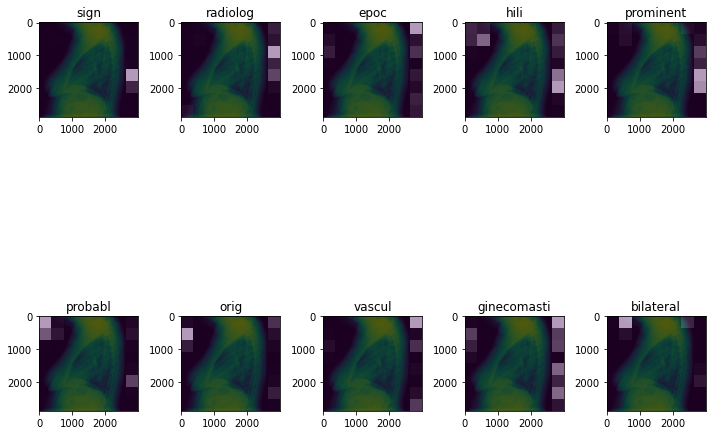

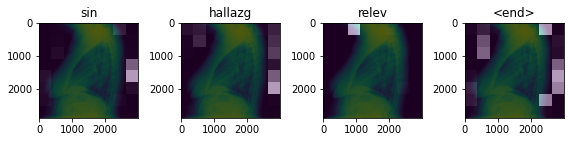

Real Caption: Translated(src=ca, dest=en, text=<Start> bibasal nodules corresponds with aortic mamil elongations sign COPD <end>, pronunciation=<Start> bibasal nodules corresponds with aortic mamil elongations sign COPD <end>, extra_data="{'translat...")
Prediction Caption: bilateral gynecomastia <end>


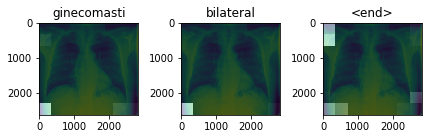

Real Caption: Translated(src=ca, dest=en, text=<Start> ano comp with previous study in 2016 revealed no variation means left breast prosthesis radiology sign with COPD catch aere pinzamient sen costofren back establ unidentified infiltrator CONDENS parenchyma <end>, pronunciation=<Start> ano comp with previous study in 2016 revealed no variation means left breast prosthesis radiology sign with COPD catch aere pinzamient sen costofren back establ unidentified infiltrator CONDENS parenchyma <end>, extra_data="{'translat...")
Prediction Caption: Radiology hallazg sin means <end>


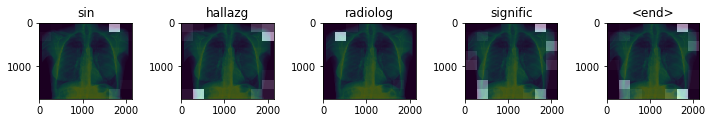

Real Caption: Translated(src=ca, dest=en, text=<Start> unsigned enfermed tubercular lungs <end>, pronunciation=<Start> unsigned enfermed tubercular lungs <end>, extra_data="{'translat...")
Prediction Caption: Relevant sin hallazg <end>


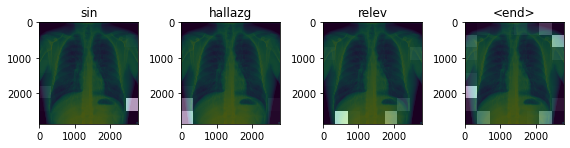

Real Caption: Translated(src=ca, dest=en, text=<Start> lost volume wholesale apical left thorax bilateral siendo mas Llama vertic lung left upper lobe tract pleuroparenquimat sin Cambi respect previous study 20 01 2015 comp with <end>, pronunciation=<Start> lost volume wholesale apical left thorax bilateral siendo mas Llama vertic lung left upper lobe tract pleuroparenquimat sin Cambi respect previous study 20 01 2015 comp with <end>, extra_data="{'translat...")
Prediction Caption: COPD chronic pulmonary change sugest multiple neuron infection process without first option diagnost rest Cambi respect relevant previous study FECH 16 <end>


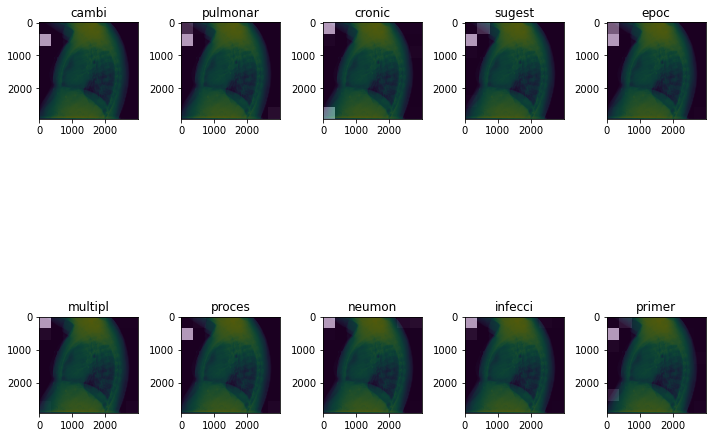

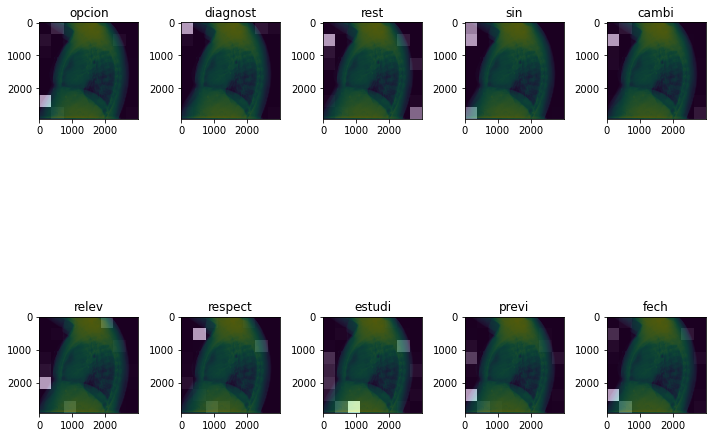

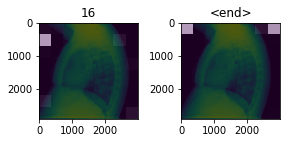

Real Caption: Translated(src=ca, dest=en, text=<Start> sign radiology catch aere sin hallazg relevant <end>, pronunciation=<Start> sign radiology catch aere sin hallazg relevant <end>, extra_data="{'translat...")
Prediction Caption: indic cardiotorac Dentro normal <end>


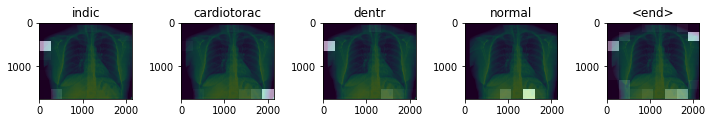

Real Caption: Translated(src=ca, dest=en, text=<Start> hallazg sin means <end>, pronunciation=<Start> hallazg sin means <end>, extra_data="{'translat...")
Prediction Caption: comp <end>


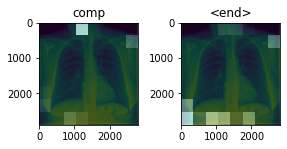

Real Caption: Translated(src=ca, dest=en, text=<Start> infiltrated posterior segment lid probable infection process pneumonia with pleural occupation Assoc levy lower third thorax Derech <end>, pronunciation=<Start> infiltrated posterior segment lid probable infection process pneumonia with pleural occupation Assoc levy lower third thorax Derech <end>, extra_data="{'translat...")
Prediction Caption: sign radiology recommend apart <end>


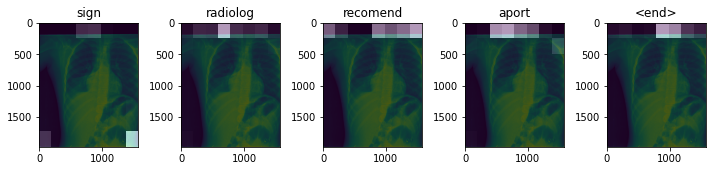

Real Caption: Translated(src=ca, dest=en, text=<Start> mejor infiltrated comp posterobasal left with six days prior study hac <end>, pronunciation=<Start> mejor infiltrated comp posterobasal left with six days prior study hac <end>, extra_data="{'translat...")
Prediction Caption: decreased subacromial space proyect bilateral 8th arco arco costal septim back later Derech sin hallazg relevant <end>


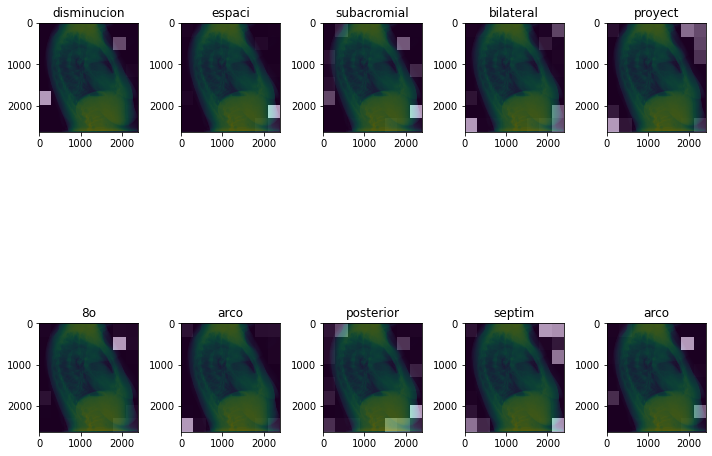

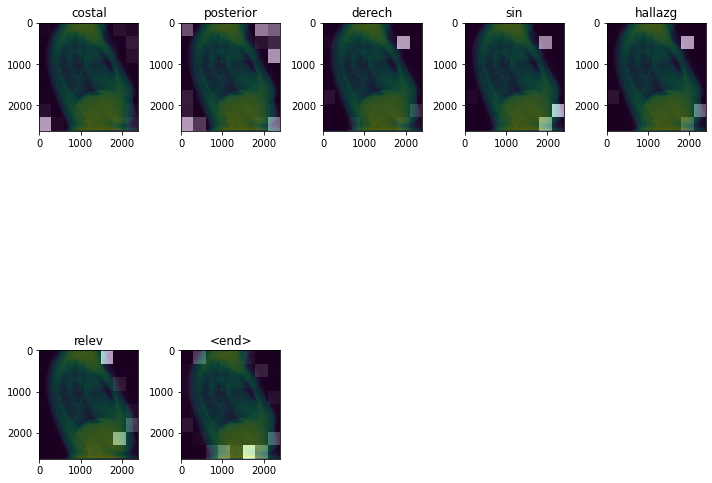

Real Caption: Translated(src=ca, dest=en, text=<Start> hallazg sin means <end>, pronunciation=<Start> hallazg sin means <end>, extra_data="{'translat...")
Prediction Caption: hallazg sin means <end>


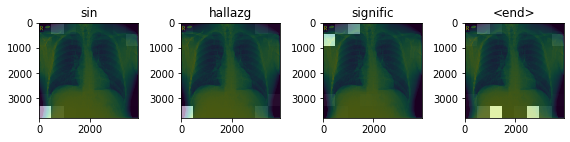

Real Caption: Translated(src=ca, dest=en, text=<Start> increased appreciation densidad retrocardiac relationship with infiltrating basal Left pleural spills but hallazg sugest inflammatory infection control process ends behind tratamient <end>, pronunciation=<Start> increased appreciation densidad retrocardiac relationship with infiltrating basal Left pleural spills but hallazg sugest inflammatory infection control process ends behind tratamient <end>, extra_data="{'translat...")
Prediction Caption: framework elongations aortic sin alter radiology sug pulmonary sarcoidosis low left inespecif context limit cease normal Cambi Mecan ASOC component loses volume countryside environment Derech with comp FECH 16 11 16 appreciation alter radiology sug pulmonary sarcoidosis low left inespecif context limit cease normal Cambi Mecan ASOC component loses volume Derech environmental field with comp FECH 16 11 16 radiology sug appreciation alter pulmonary sarcoidosis low


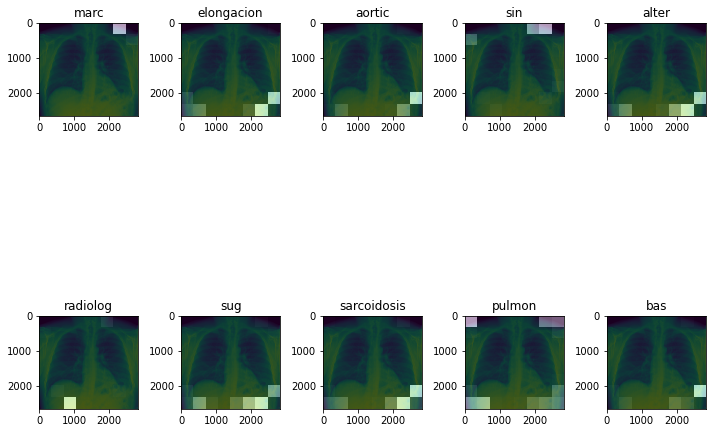

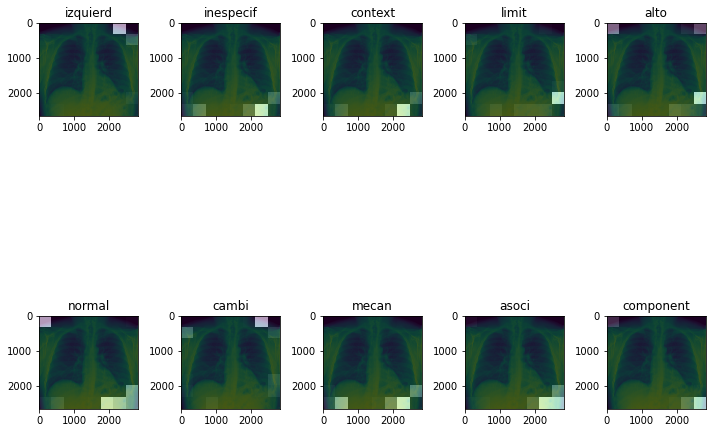

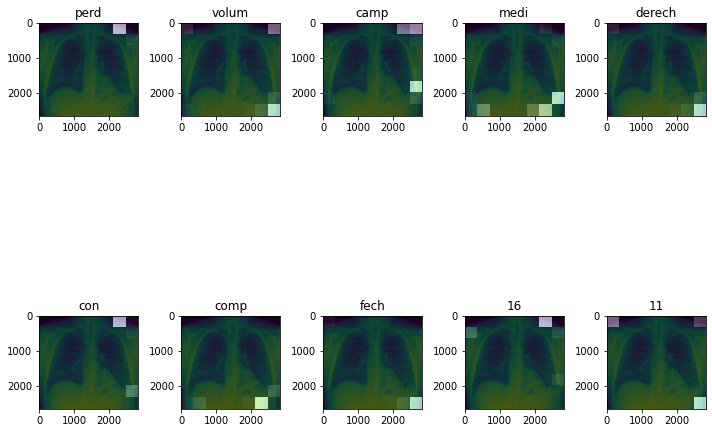

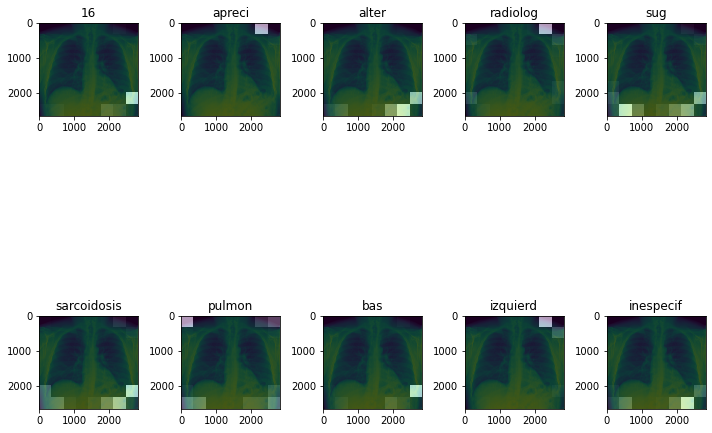

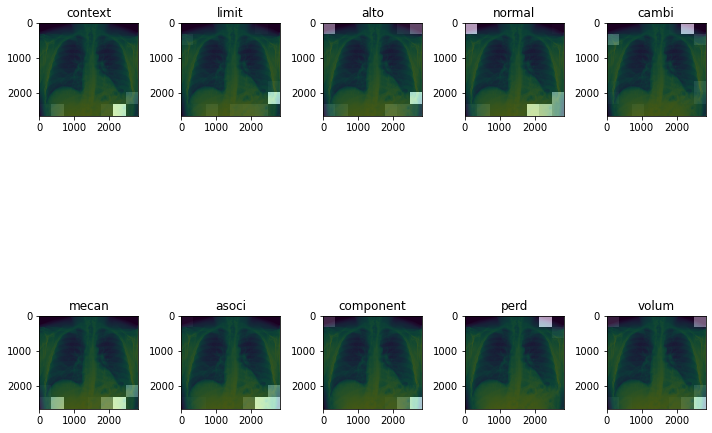

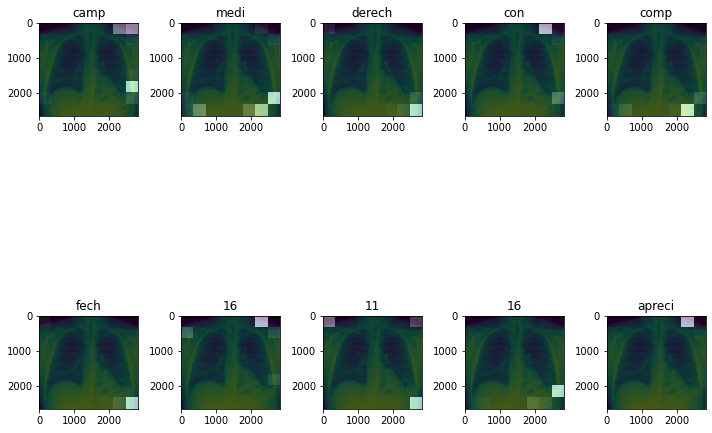

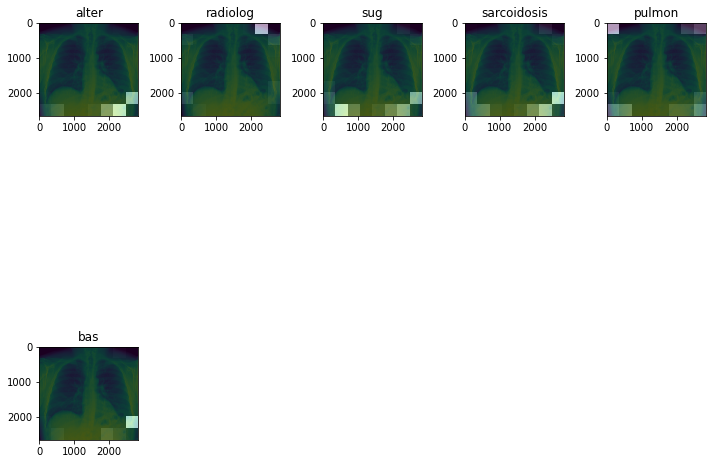

Real Caption: Translated(src=ca, dest=en, text=<Start> cardiomegaly it sells wine aorta Elong increased vascularization central lung field pinzamient sen left rear costodiafragmat <end>, pronunciation=<Start> cardiomegaly it sells wine aorta Elong increased vascularization central lung field pinzamient sen left rear costodiafragmat <end>, extra_data="{'translat...")
Prediction Caption: cardiomegaly elongations aortic hipercifosis dorsal elongations aortic hipercifosis dorsal elongations aortic hipercifosis dorsal elongations aortic hipercifosis dorsal elongations aortic hipercifosis dorsal elongations aortic hipercifosis dorsal elongations aortic hipercifosis dorsal elongations aortic hipercifosis dorsal elongations aortic hipercifosis dorsal elongations aortic hipercifosis dorsal elongations aortic hipercifosis dorsal elongations aortic hipercifosis dorsal elongations hipercifosis elongations dorsal aortic aortic hipercifosis elongations dorsal aortic aortic hipercifosis elongations h

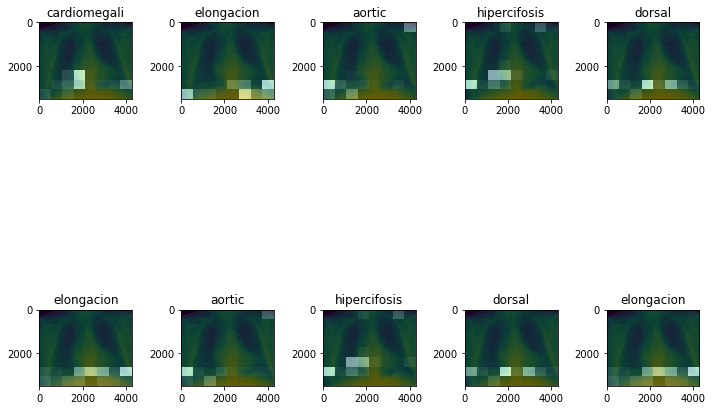

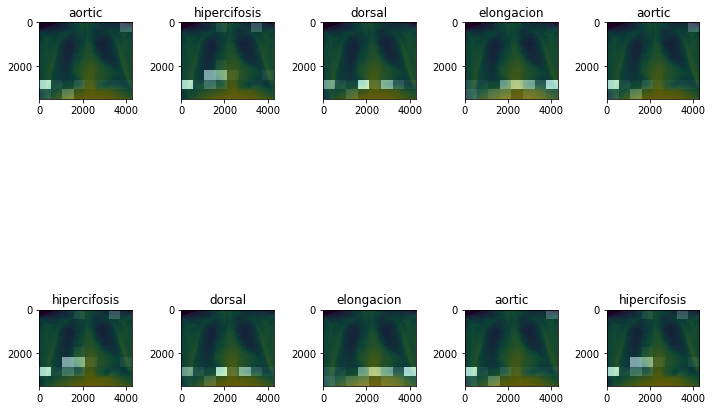

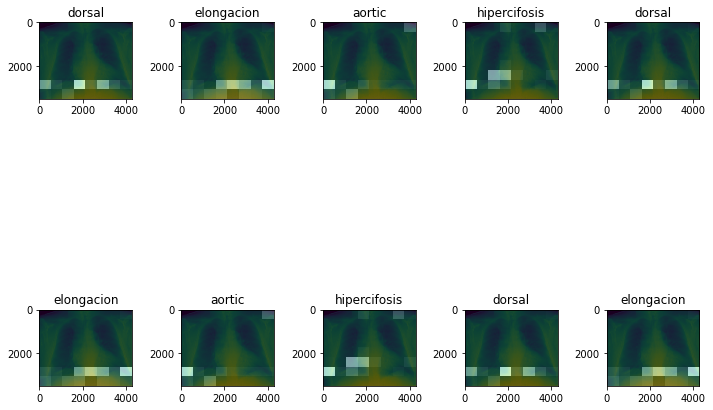

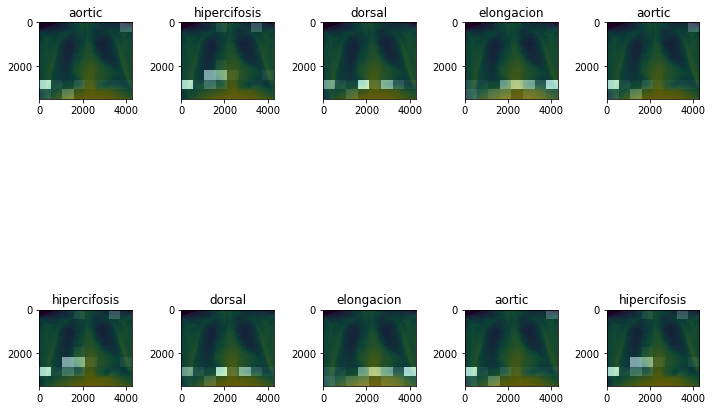

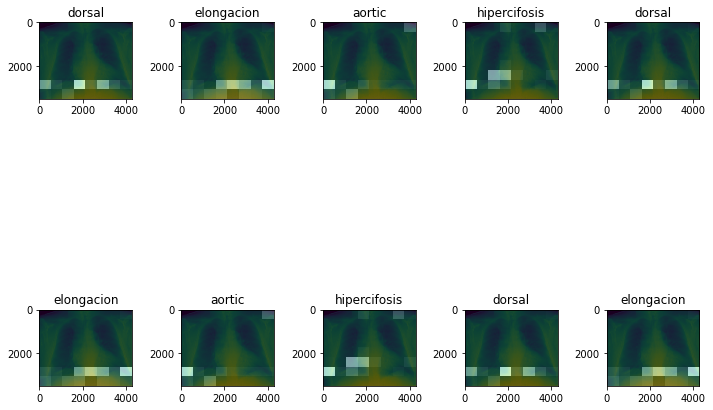

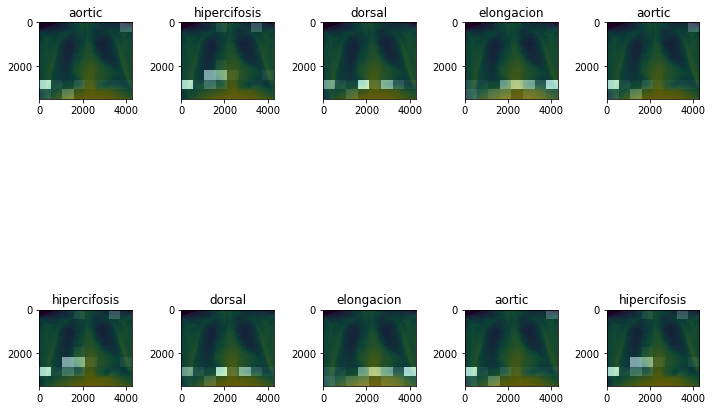

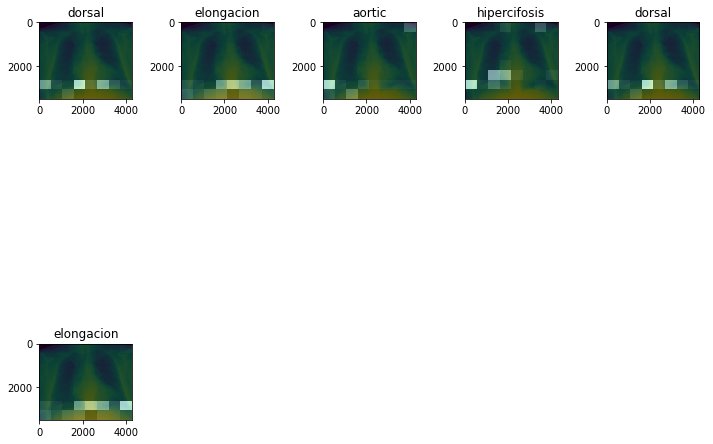

Real Caption: Translated(src=ca, dest=en, text=<Start> densid nodules localizacion parahiliar left commend complete study program form with taco thoracic pathologies discard localizacion rest exploration sin means alter <end>, pronunciation=<Start> densid nodules localizacion parahiliar left commend complete study program form with taco thoracic pathologies discard localizacion rest exploration sin means alter <end>, extra_data="{'translat...")
Prediction Caption: no appreciation or infiltrated CONDENS dorsal kyphosis Silhouette cardiac pulmonary atelectasis basal lamina Derech prominent probable vascular sin Cambi great respect perform 13th in 2013 with 08 sign trapped aere Cambi chronic pulmonary aorta elongations <end>


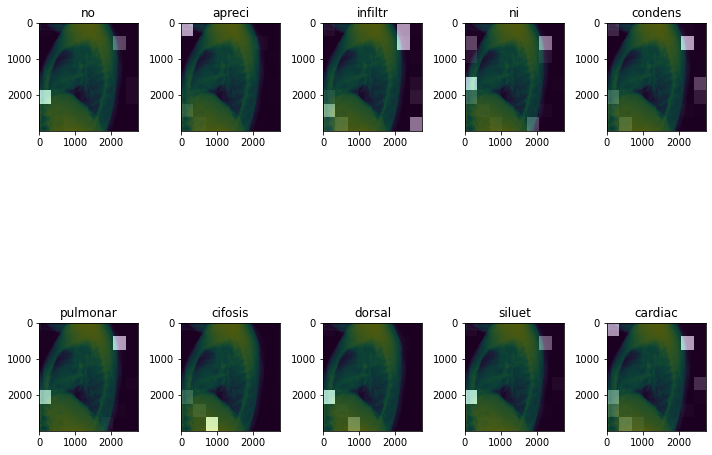

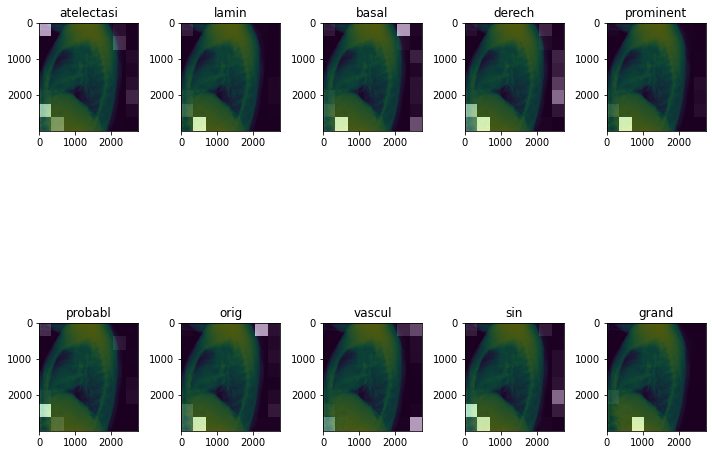

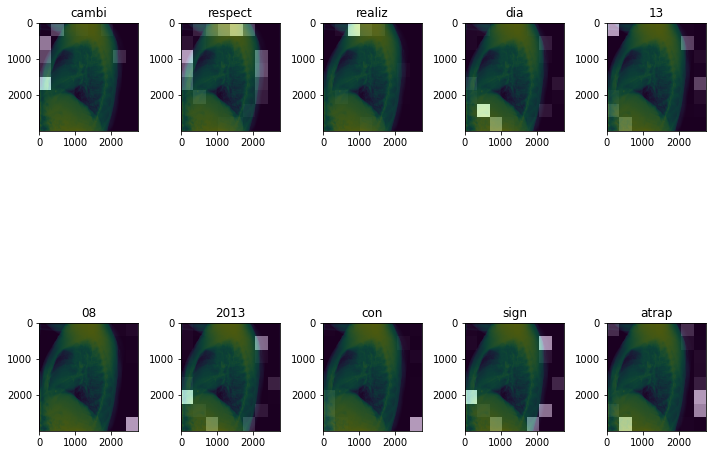

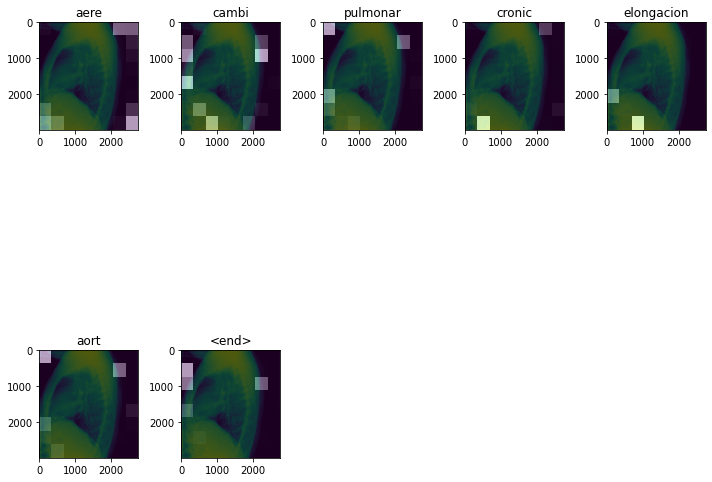

Real Caption: Translated(src=ca, dest=en, text=<Start> sin hallazg relevant <end>, pronunciation=<Start> sin hallazg relevant <end>, extra_data="{'translat...")
Prediction Caption: patron interstitial bilateral dominated field environment thorax Derech with pattern interstitial bilateral dominated field environment thorax Derech with pattern interstitial bilateral dominated field environment thorax Derech with pattern interstitial bilateral dominated field environment thorax Derech with pattern interstitial bilateral dominated field environment thorax Derech with pattern interstitial bilateral dominated field Derech environment thorax with bilateral interstitial pattern predominantly environmental field Derech thorax with bilateral interstitial pattern


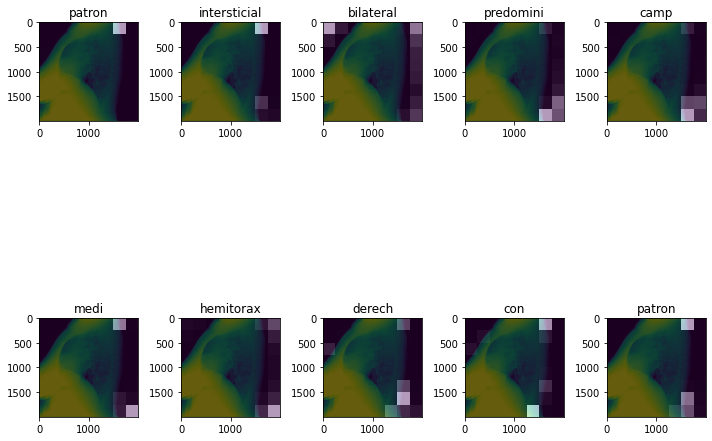

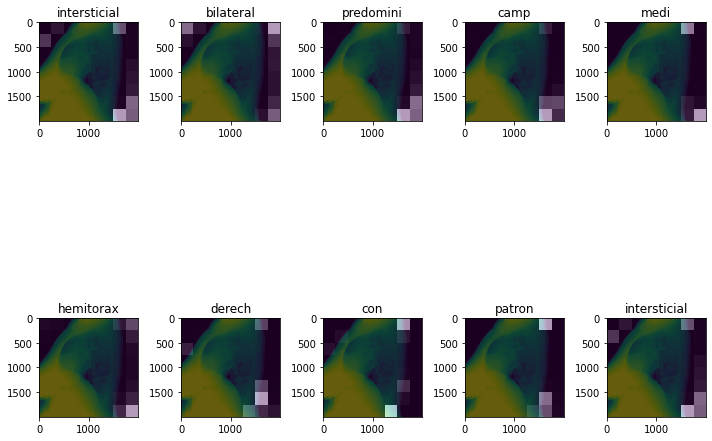

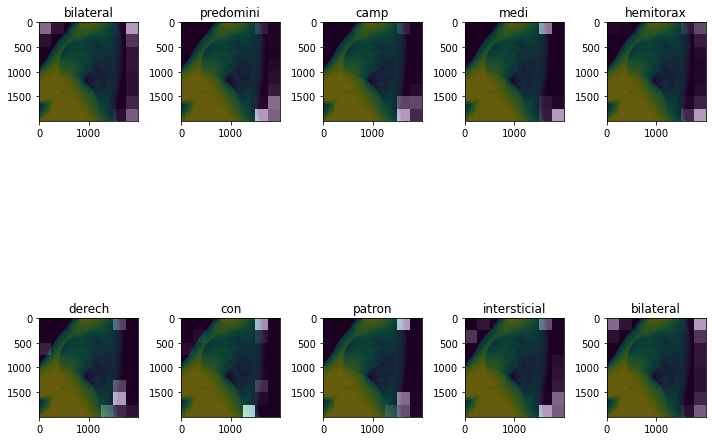

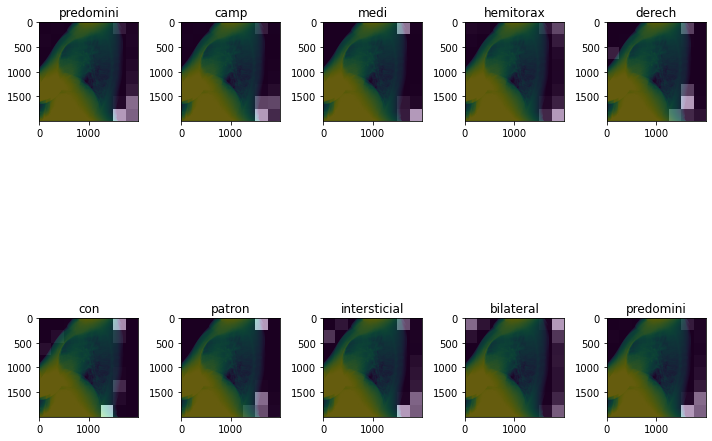

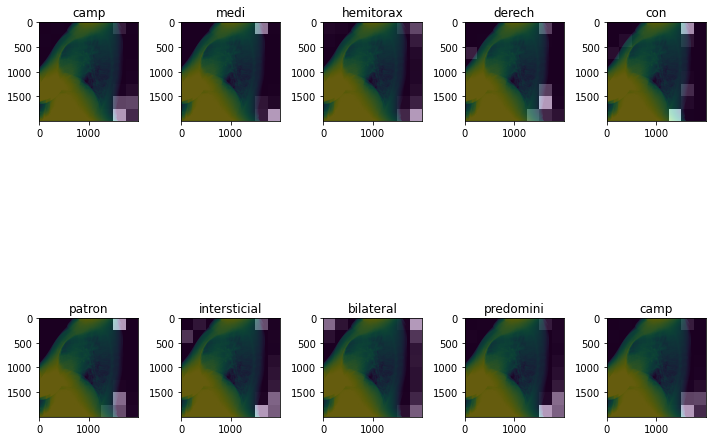

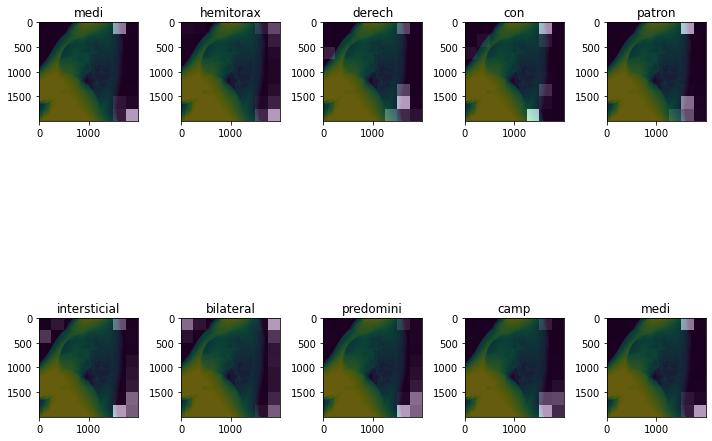

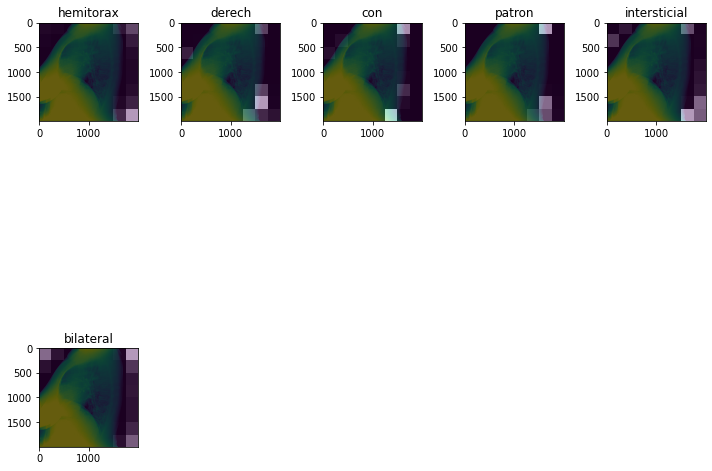

Real Caption: Translated(src=ca, dest=en, text=<Start> hallazg nivel sin lungs flattened diaphragm <end>, pronunciation=<Start> hallazg nivel sin lungs flattened diaphragm <end>, extra_data="{'translat...")
Prediction Caption: no sign COPD wholesale pleural biapical with patron interstitial bilateral predominance bibasal sign trapped aere not appreciate infiltrate or CONDENS pulmonary kyphosis back with patron interstitial bilateral predominance bibasal sign trapped aere not appreciate infiltrate or CONDENS pulmonary kyphosis back with patron interstitial bilateral predominance bibasal sign trapped aere not or pulmonary infiltrates appreciation CONDENS dorsal kyphosis with bilateral interstitial pattern predominantly bibasal sign trapped aere


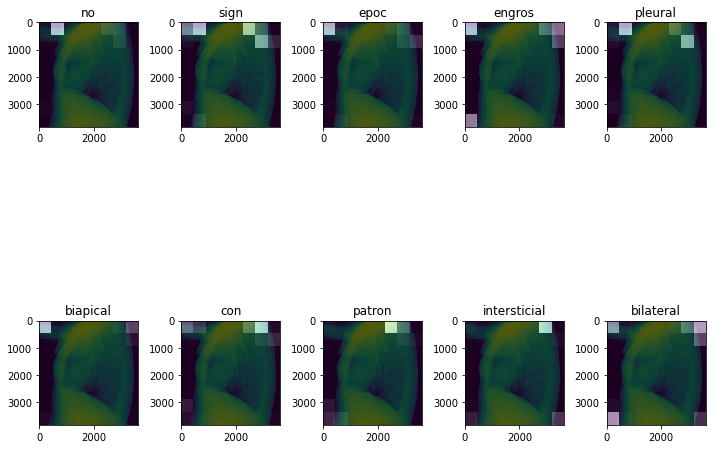

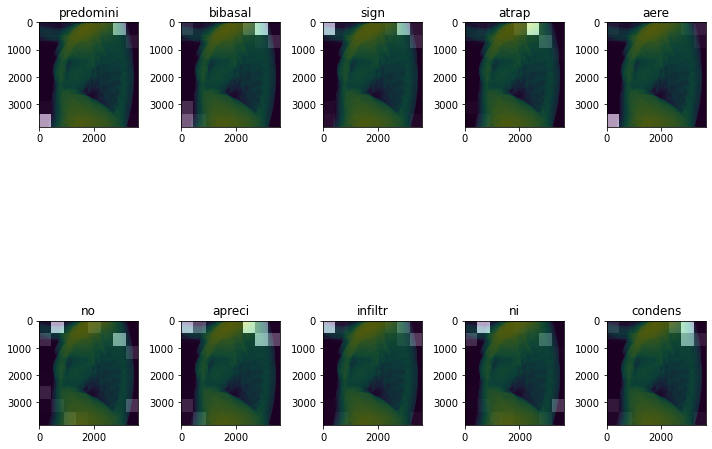

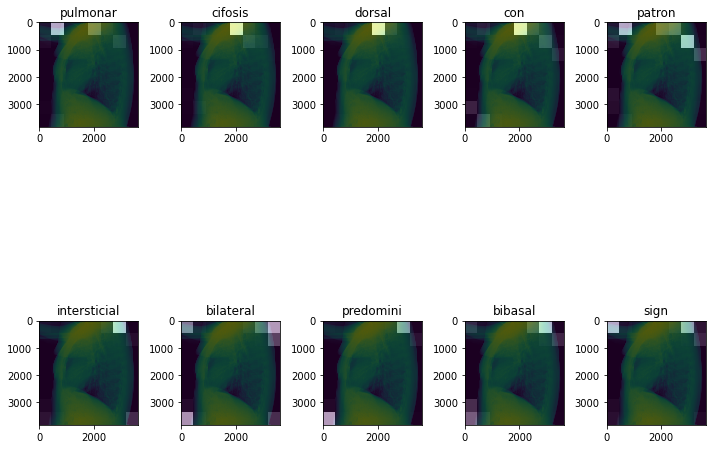

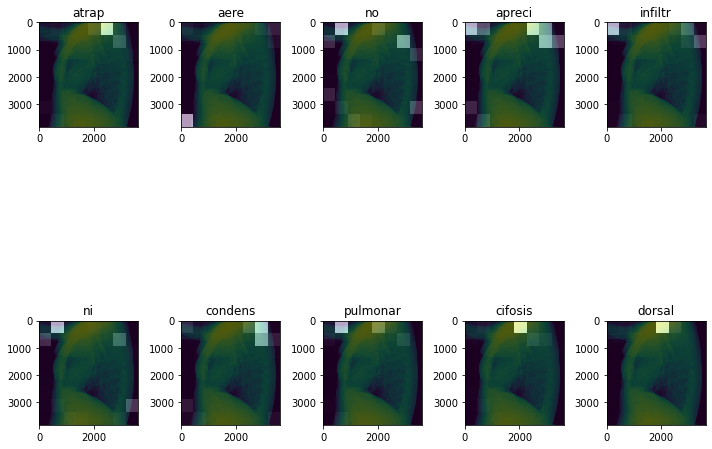

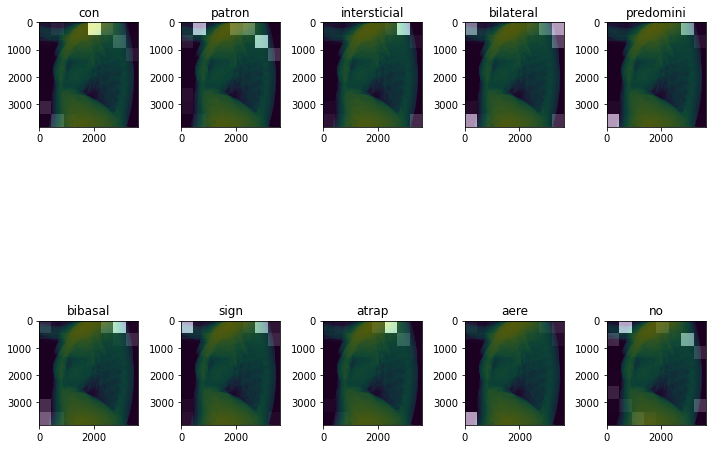

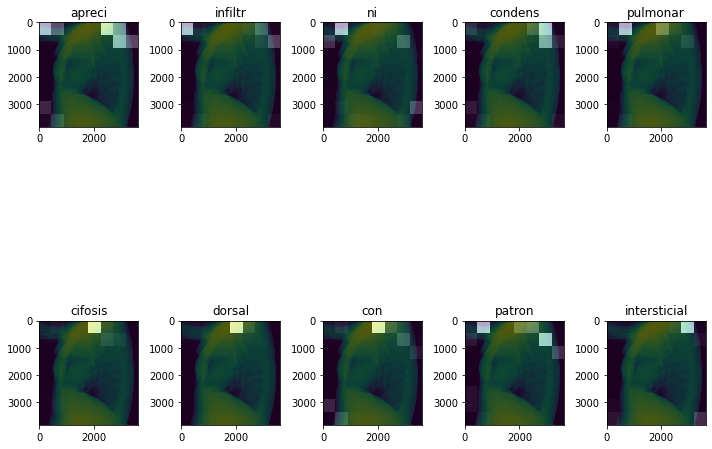

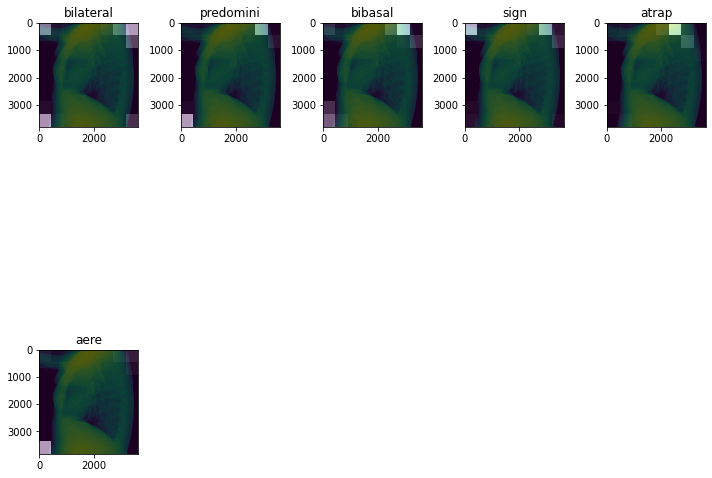

Real Caption: Translated(src=ca, dest=en, text=<Start> back pinzamient sen costodiafragmat Derech no appreciation pulmonary infiltrates <end>, pronunciation=<Start> back pinzamient sen costodiafragmat Derech no appreciation pulmonary infiltrates <end>, extra_data="{'translat...")
Prediction Caption: motif consult cough aumento densidad right basal pulmonary CONDENS Visualizer <end>


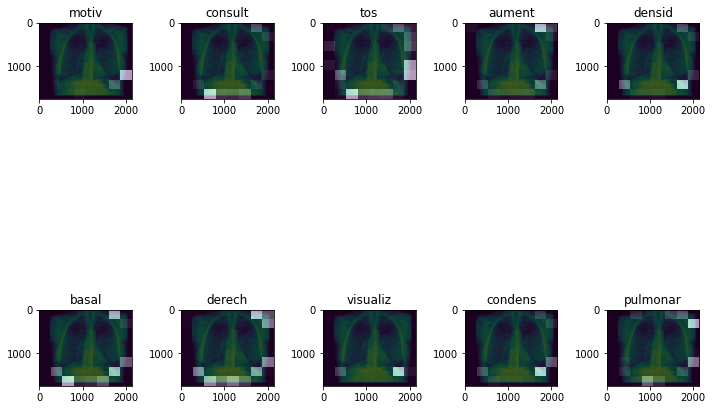

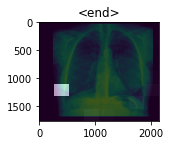

Real Caption: Translated(src=ca, dest=en, text=<Start> hallazg sin means <end>, pronunciation=<Start> hallazg sin means <end>, extra_data="{'translat...")
Prediction Caption: hallazg sin means <end>


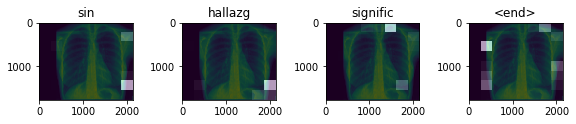

Real Caption: Translated(src=ca, dest=en, text=<Start> sin hallazg relevant <end>, pronunciation=<Start> sin hallazg relevant <end>, extra_data="{'translat...")
Prediction Caption: hallazg sin sin means Cambi means with respect previous study with trapping aere <end>


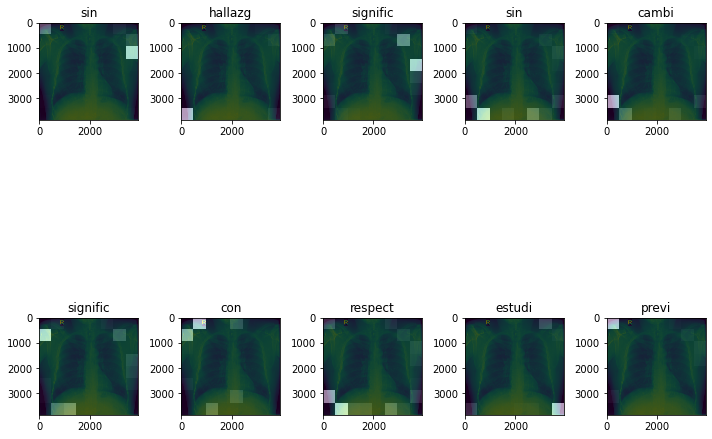

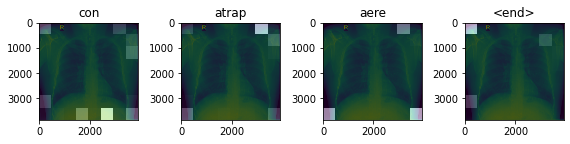

Real Caption: Translated(src=ca, dest=en, text=<Start> Radiology sin alter meanings <end>, pronunciation=<Start> Radiology sin alter meanings <end>, extra_data="{'translat...")
Prediction Caption: hallazg meanings without pathology meaning Entido discrete basal atelectasis subsegmentari left without relevant hallazg <end>


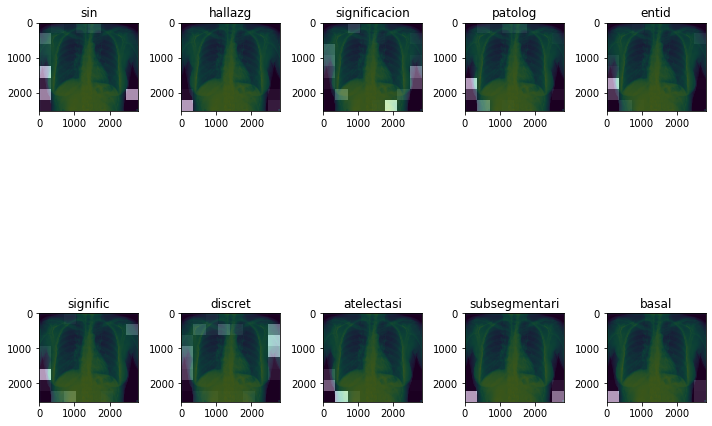

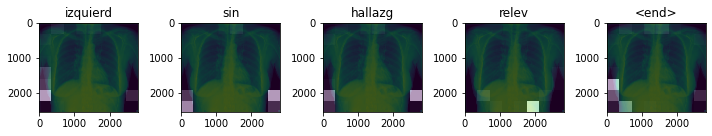

Real Caption: Translated(src=ca, dest=en, text=<Start> study Dentro normal limit <end>, pronunciation=<Start> study Dentro normal limit <end>, extra_data="{'translat...")
Prediction Caption: Nodular basal Derech hallazg meanings <end>


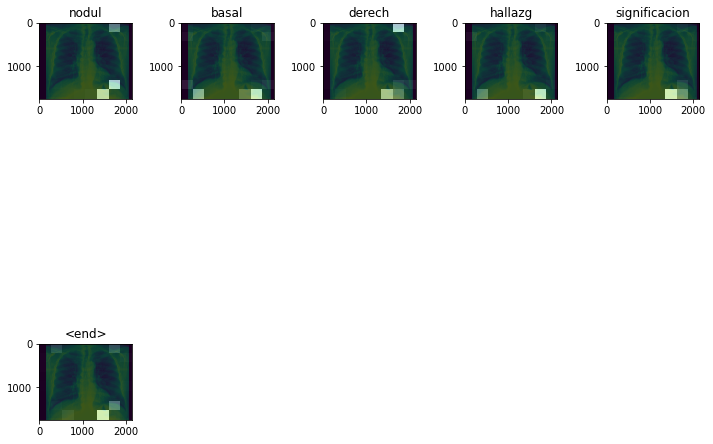

Real Caption: Translated(src=ca, dest=en, text=<Start> multiple bronchiectasis predominantly bilateral alveolar consolidation perihili unidentified fire Silhouette current study cardiac Taman conserving sign spills pleural atheromatous aortic cay <end>, pronunciation=<Start> multiple bronchiectasis predominantly bilateral alveolar consolidation perihili unidentified fire Silhouette current study cardiac Taman conserving sign spills pleural atheromatous aortic cay <end>, extra_data="{'translat...")
Prediction Caption: sign radiology COPD discreet pinzamient sen costofren Derech pinzamient sen costofren Derech pinzamient sen costofren Derech pinzamient sen costofren Derech pinzamient sen costofren Derech pinzamient sen costofren Derech pinzamient sen costofren Derech pinzamient sen costofren Derech pinzamient sen costofren Derech pinzamient sen costofren Derech pinzamient sen costofren Derech pinzamient sen costofren Derech Derech pinzamient costofren pinzamient sen sen sen costofren pin

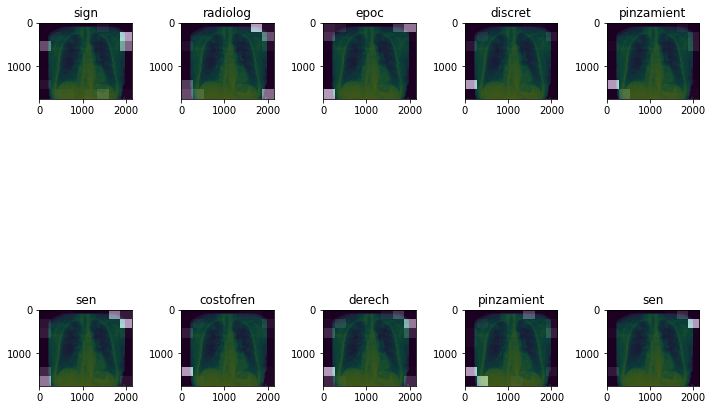

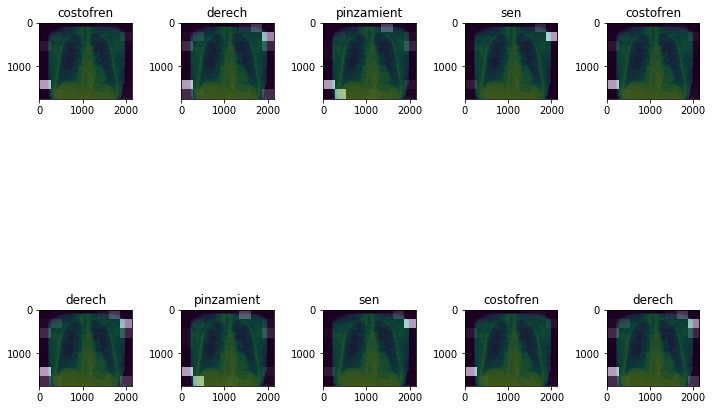

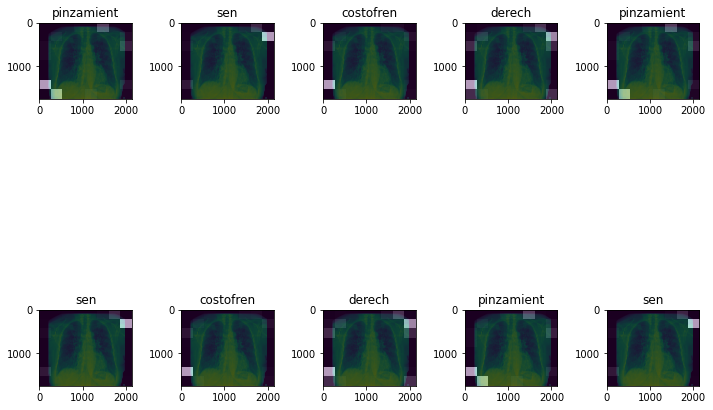

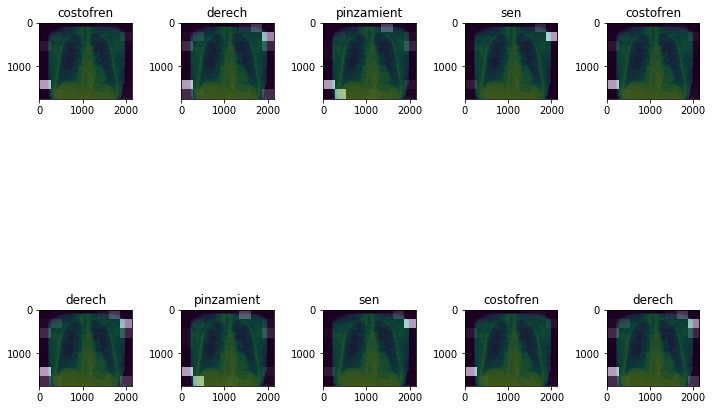

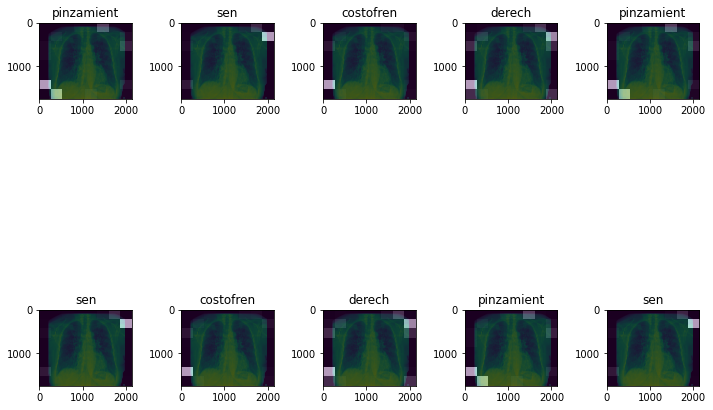

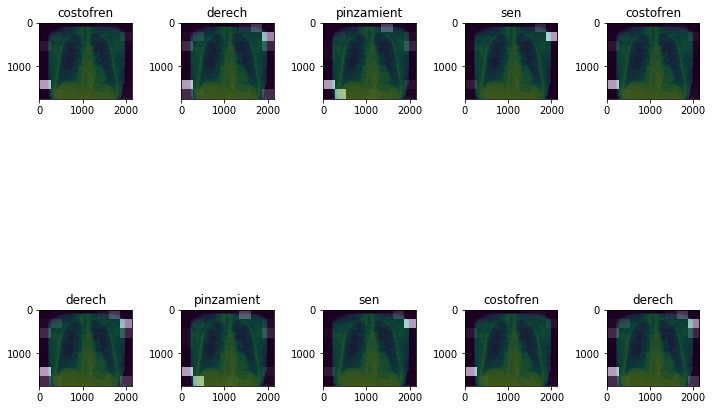

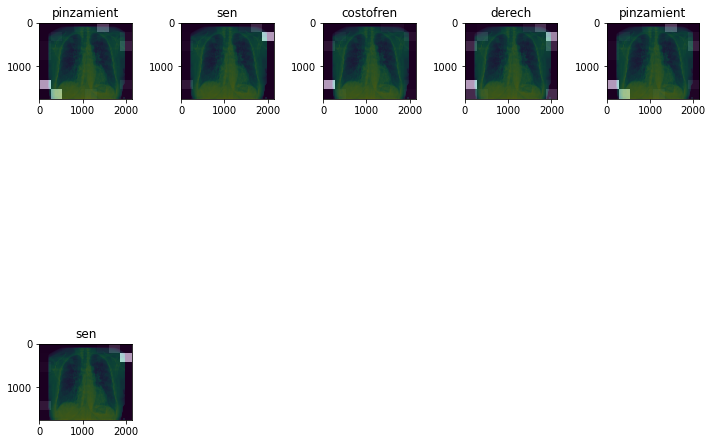

Real Caption: Translated(src=ca, dest=en, text=<Start> objet mejor means infiltrated with respect retrocardiac not levy lid pleural <end>, pronunciation=<Start> objet mejor means infiltrated with respect retrocardiac not levy lid pleural <end>, extra_data="{'translat...")
Prediction Caption: nasogastric tube axial column infradiaphragmatic change Mecan degener <end>


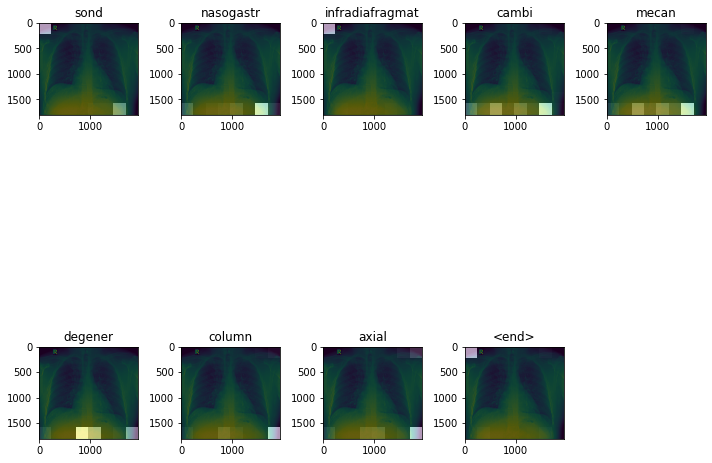

Real Caption: Translated(src=ca, dest=en, text=<Start> hallazg sin means Liger dorsal scoliosis Derech <end>, pronunciation=<Start> hallazg sin means Liger dorsal scoliosis Derech <end>, extra_data="{'translat...")
Prediction Caption: motif consult cough lumbar scoliosis <end>


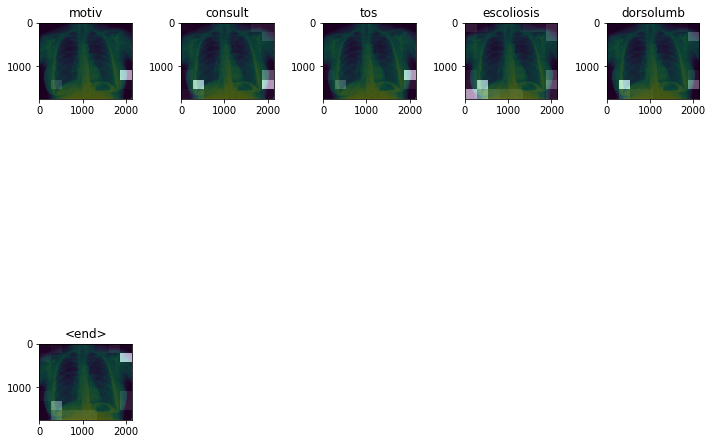

Real Caption: Translated(src=ca, dest=en, text=<Start> appreciation not consolidated but not relevant hallazg increased densid ambos sen costofren low secondary pulmonary mam <end>, pronunciation=<Start> appreciation not consolidated but not relevant hallazg increased densid ambos sen costofren low secondary pulmonary mam <end>, extra_data="{'translat...")
Prediction Caption: Study sin means alter <end>


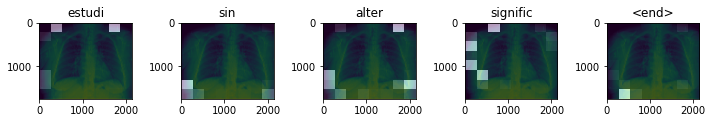

Real Caption: Translated(src=ca, dest=en, text=<Start> pinzamient sen cardiofren Left Wing caracterist chronic <end>, pronunciation=<Start> pinzamient sen cardiofren Left Wing caracterist chronic <end>, extra_data="{'translat...")
Prediction Caption: bilateral interstitial pattern <end>


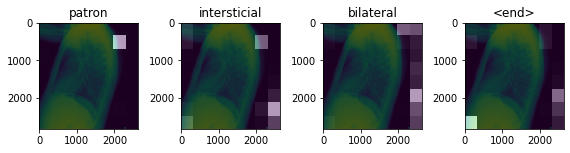

Real Caption: Translated(src=ca, dest=en, text=<Start> sin hallazg relevant <end>, pronunciation=<Start> sin hallazg relevant <end>, extra_data="{'translat...")
Prediction Caption: Radiology sign with COPD comp <end>


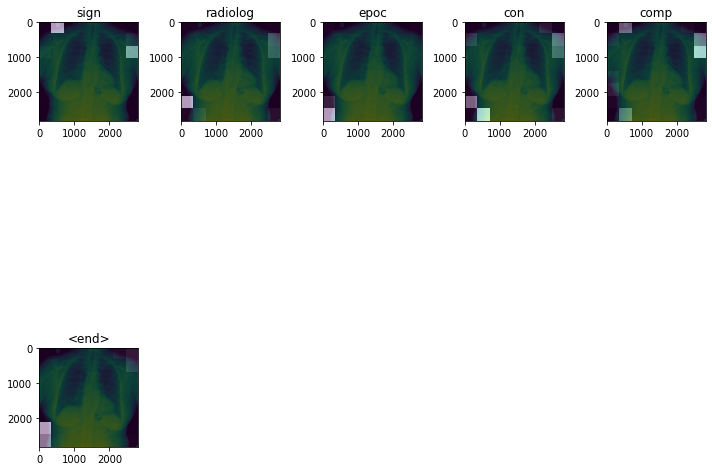

Real Caption: Translated(src=ca, dest=en, text=<Start> Cambi chronic emphysema thorax level atelectasis lingul lm <end>, pronunciation=<Start> Cambi chronic emphysema thorax level atelectasis lingul lm <end>, extra_data="{'translat...")
Prediction Caption: Relevant sin hallazg <end>


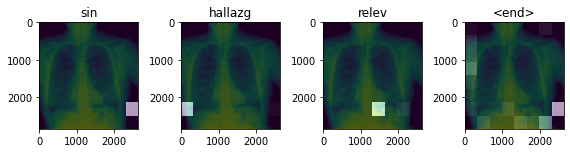

Real Caption: Translated(src=ca, dest=en, text=<Start> button COPD sign with aortic desplaz tracheal Derech prominent <end>, pronunciation=<Start> button COPD sign with aortic desplaz tracheal Derech prominent <end>, extra_data="{'translat...")
Prediction Caption: Radiology COPD control indic cardiotorac limit normal lumbar scoliosis <end>


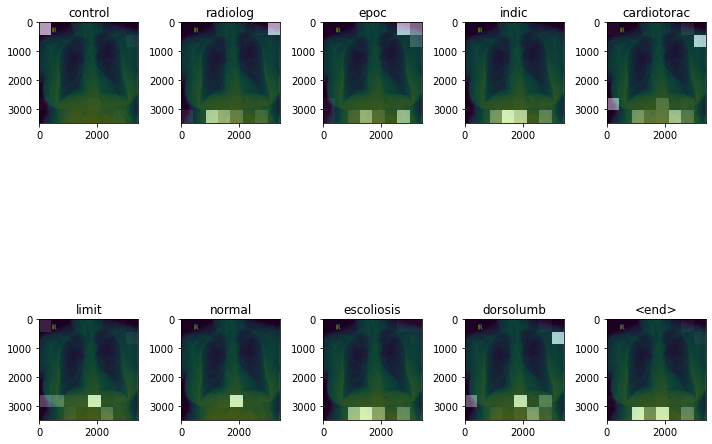

Real Caption: Translated(src=ca, dest=en, text=<Start> sin Cambi great respect previous study FECH 03 10 2014 <end>, pronunciation=<Start> sin Cambi great respect previous study FECH 03 10 2014 <end>, extra_data="{'translat...")
Prediction Caption: chronic pulmonary nodules with pacemaker Acuña previous cuerpo vertebral spine acig acig increased mediastinum increases densid metal proyect vd <end>


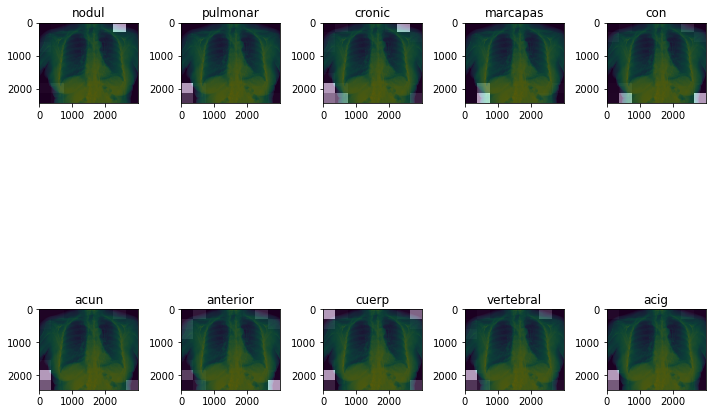

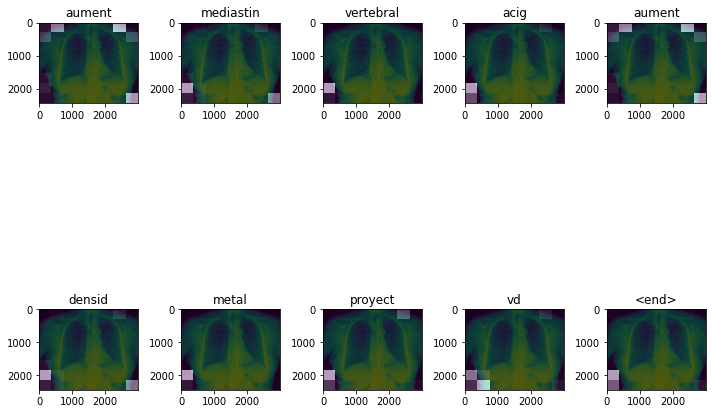

Real Caption: Translated(src=ca, dest=en, text=<Start> unsigned icc pers aumento densidad retrocardiaca relationship with atelectasis condensation spills pleural cardiomegaly <end>, pronunciation=<Start> unsigned icc pers aumento densidad retrocardiaca relationship with atelectasis condensation spills pleural cardiomegaly <end>, extra_data="{'translat...")
Prediction Caption: cardiomegaly with previous study FECH Compar value 13 04 15 pers pecan atelectasis atelectasis lm basal lamina Derech relationship with atelectasis subsegmentari bibasal elongations aortic grand alter radiology relevant <end>


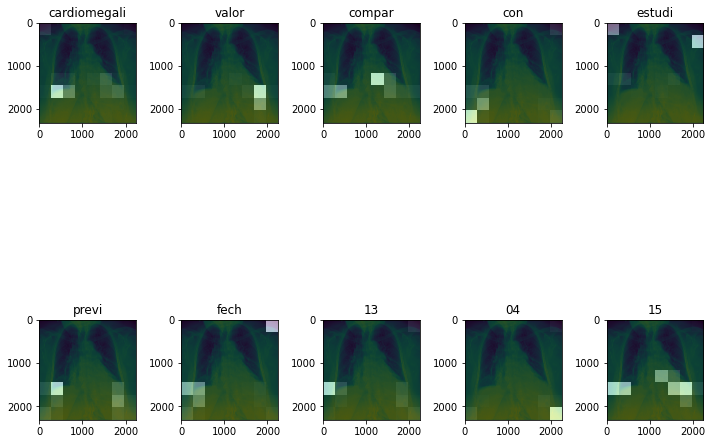

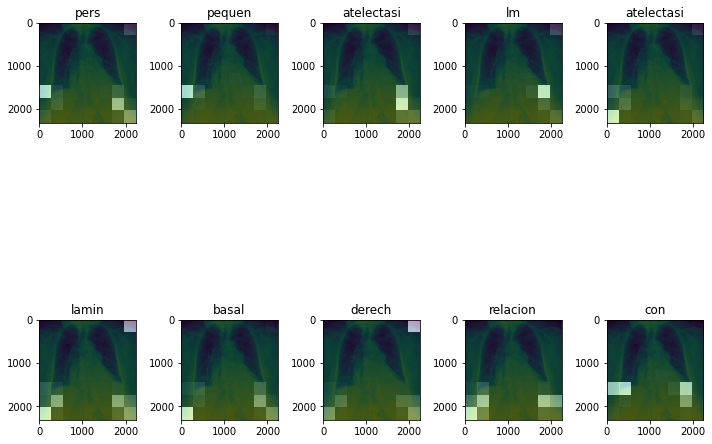

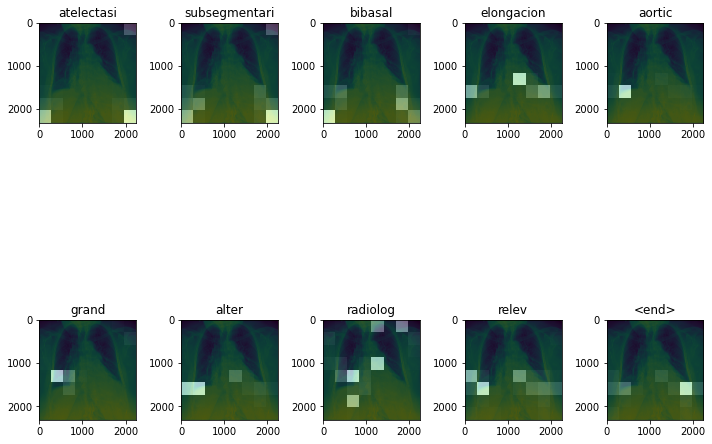

Real Caption: Translated(src=ca, dest=en, text=<Start> Cambi chronic emphysema thorax level atelectasis lingul lm <end>, pronunciation=<Start> Cambi chronic emphysema thorax level atelectasis lingul lm <end>, extra_data="{'translat...")
Prediction Caption: Relevant sin hallazg <end>


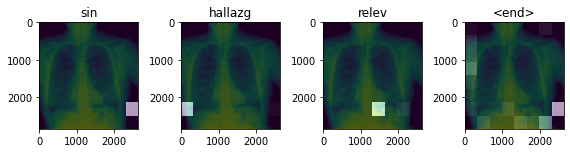

Real Caption: Translated(src=ca, dest=en, text=<Start> hallazgos radiology sin means <end>, pronunciation=<Start> hallazgos radiology sin means <end>, extra_data="{'translat...")
Prediction Caption: previous study <end>


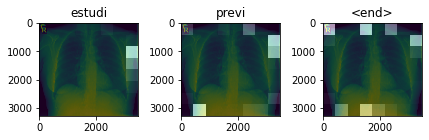

Real Caption: Translated(src=ca, dest=en, text=<Start> Beijing atelectasis subsegmentari left under field environment <end>, pronunciation=<Start> Beijing atelectasis subsegmentari left under field environment <end>, extra_data="{'translat...")
Prediction Caption: lumbar scoliosis <end>


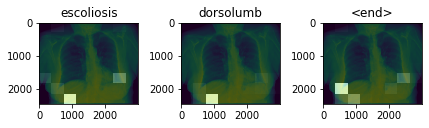

Real Caption: Translated(src=ca, dest=en, text=<Start> hallazg sin means <end>, pronunciation=<Start> hallazg sin means <end>, extra_data="{'translat...")
Prediction Caption: COPD sign radiology radiology infiltrates or not observing alter CONDENS means <end>


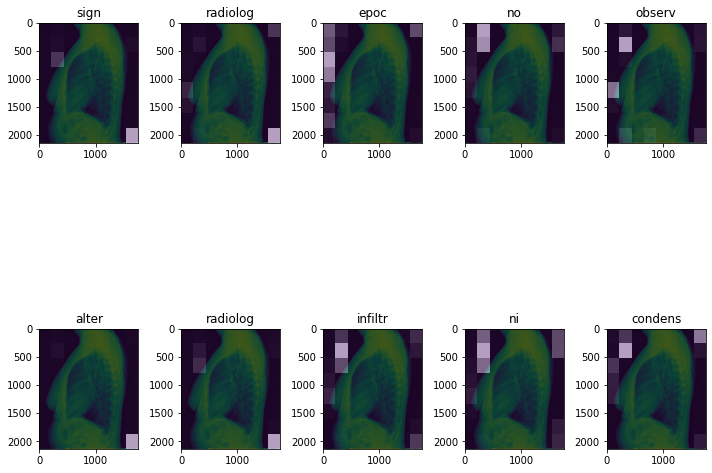

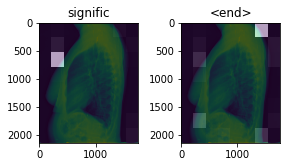

Real Caption: Translated(src=ca, dest=en, text=<Start> elongations amount Herni aortic hiatus sign aere not catch objet current consolidated lung parenchyma without respect Cambi relevant previous study 04 in 2016 with 08 FECH comp <end>, pronunciation=<Start> elongations amount Herni aortic hiatus sign aere not catch objet current consolidated lung parenchyma without respect Cambi relevant previous study 04 in 2016 with 08 FECH comp <end>, extra_data="{'translat...")
Prediction Caption: frame sign radiology COPD comp with radiographs prior FECH 18 08 2014 appreciation amount sign radiology COPD comp with radiographs prior FECH 18 08 2014 appreciation amount sign radiology COPD comp with radiographs prior FECH 18 08 2014 appreciation amount sign radiology COPD comp with radiographs prior FECH 18 08 2014 appreciation amount radiology sign with COPD comp radiography prior FECH appreciation amount 18 08 2014


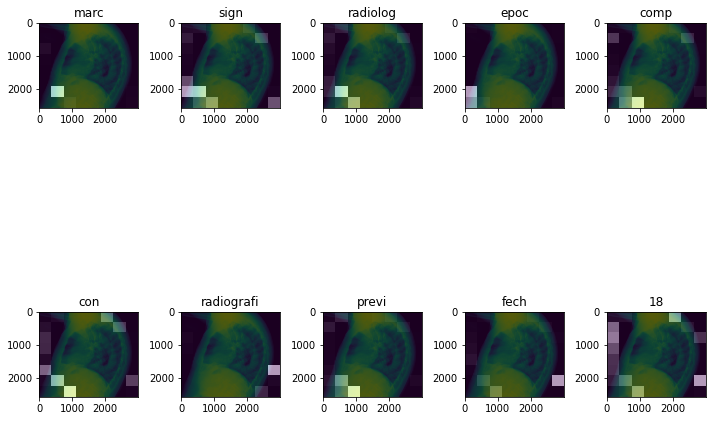

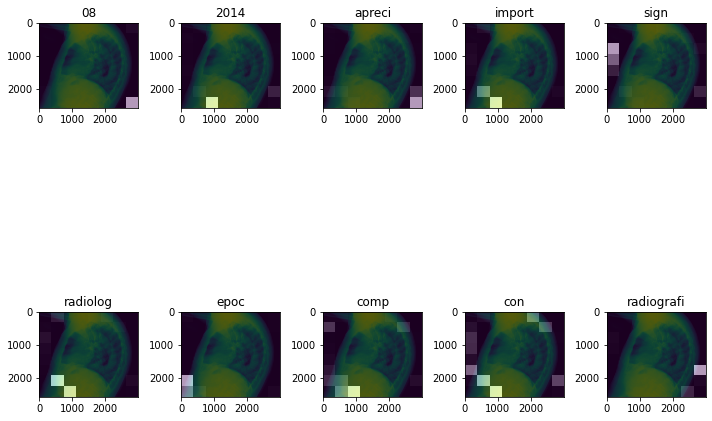

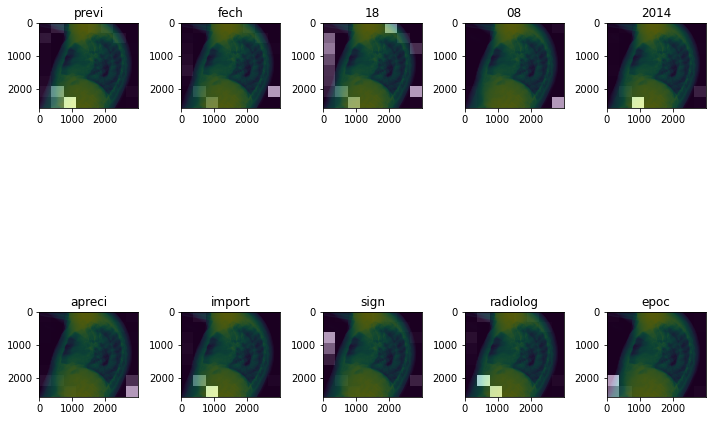

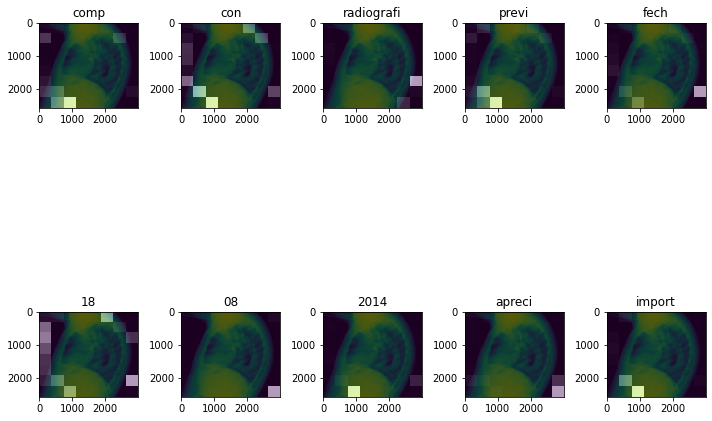

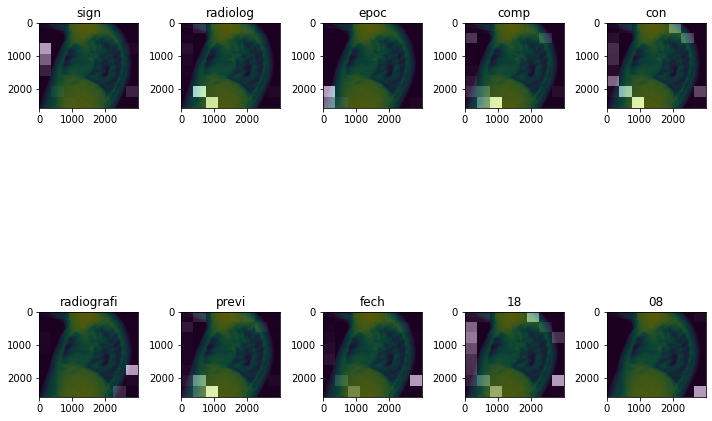

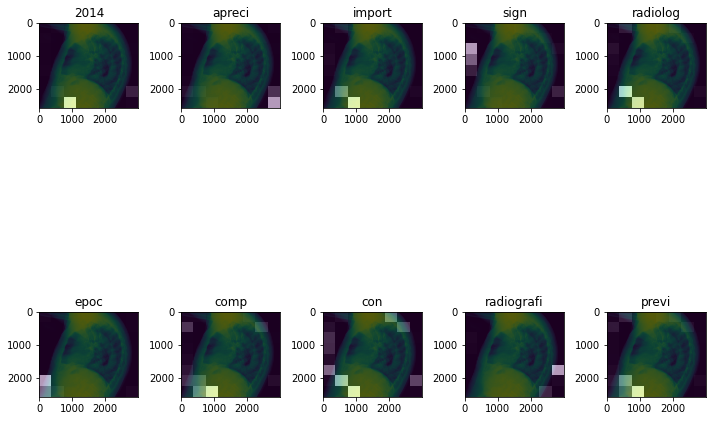

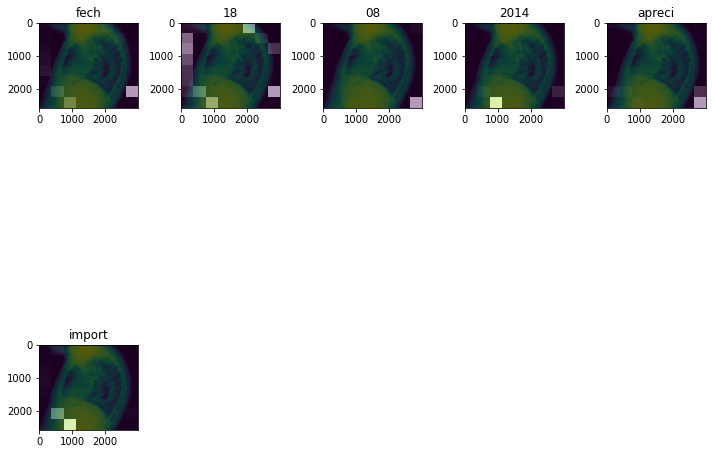

Real Caption: Translated(src=ca, dest=en, text=<Start> sign radiology COPD projection posteroanterior thorax Derech imag low esteem increases densid morphology alarg not arrange Identific cre lateral projection could correspond with shadow costal cartilage summation artifact image cit complete study tc <end>, pronunciation=<Start> sign radiology COPD projection posteroanterior thorax Derech imag low esteem increases densid morphology alarg not arrange Identific cre lateral projection could correspond with shadow costal cartilage summation artifact image cit complete study tc <end>, extra_data="{'translat...")
Prediction Caption: hallazg no relevant previous study radiology radiology sign with pneumonia sugest process lii <end>


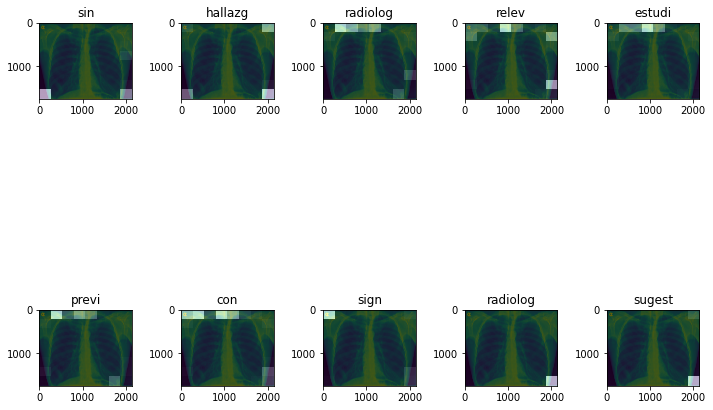

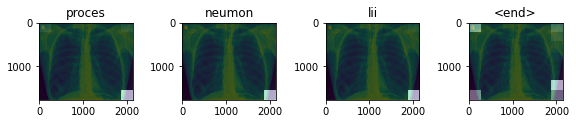

Real Caption: Translated(src=ca, dest=en, text=<Start> Silhouette CARDI Dentro normal mediastinum sen costofren increased libr discrete section broncovascul lingul sin clear imag condensation Hili Cambi prominent pulmonary chronic aortic elongations <end>, pronunciation=<Start> Silhouette CARDI Dentro normal mediastinum sen costofren increased libr discrete section broncovascul lingul sin clear imag condensation Hili Cambi prominent pulmonary chronic aortic elongations <end>, extra_data="{'translat...")
Prediction Caption: atelectasis subsegmentari basal lamina Izquierdo relationship with pecan atelectasis subsegmentari basal lamina Izquierdo relationship with pecan atelectasis subsegmentari basal lamina Izquierdo relationship with pecan atelectasis subsegmentari basal lamina Izquierdo relationship with pecan atelectasis subsegmentari basal lamina Izquierdo relationship with pecan atelectasis subsegmentari basal lamina Izquierdo relationship with pecan atelectasis subsegmentari left ba

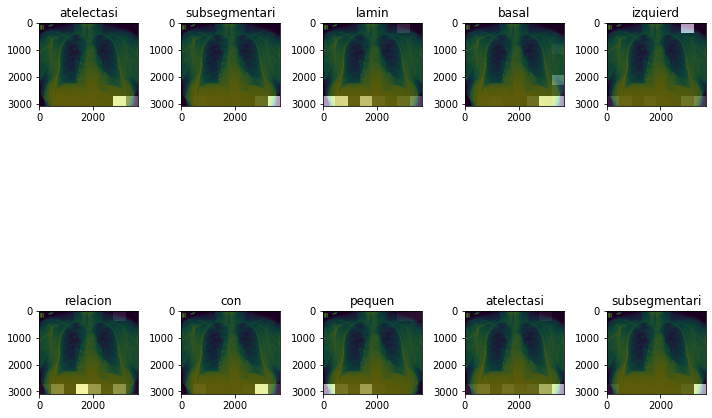

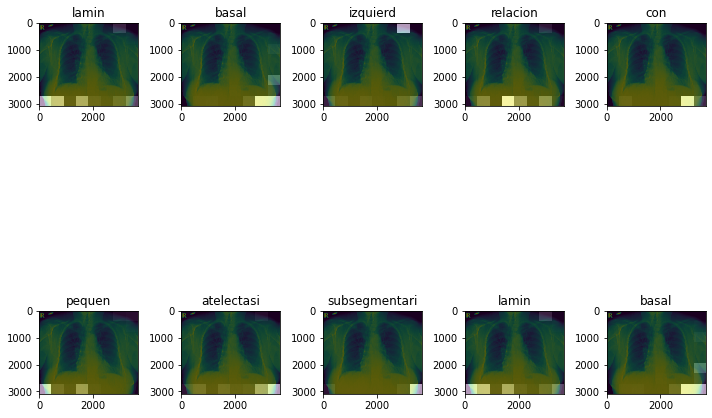

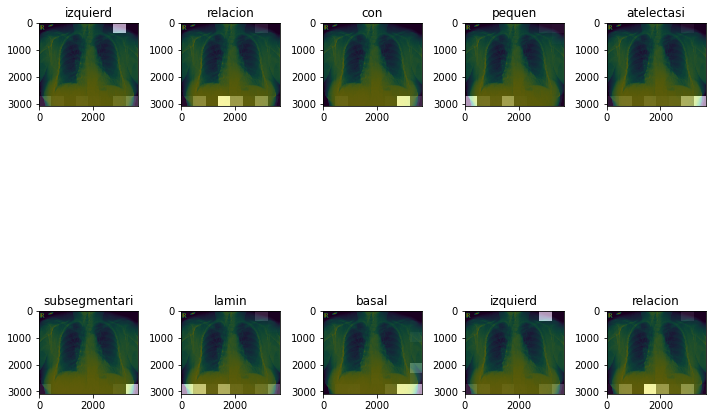

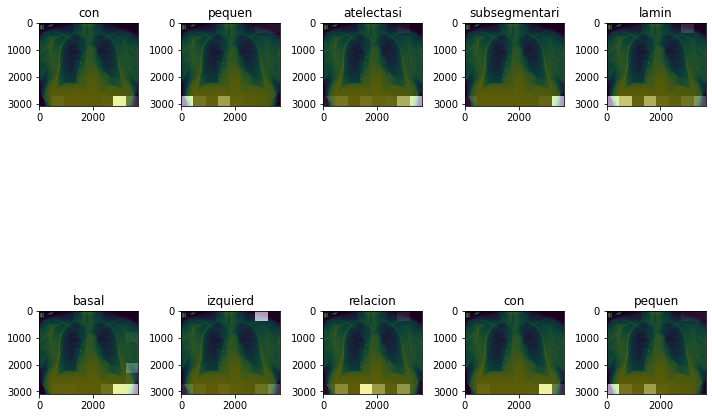

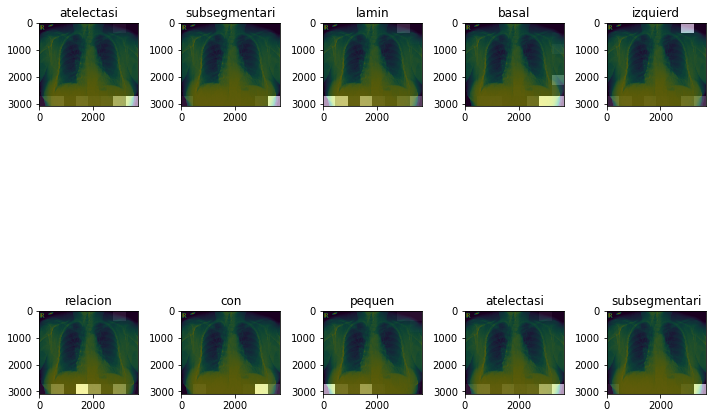

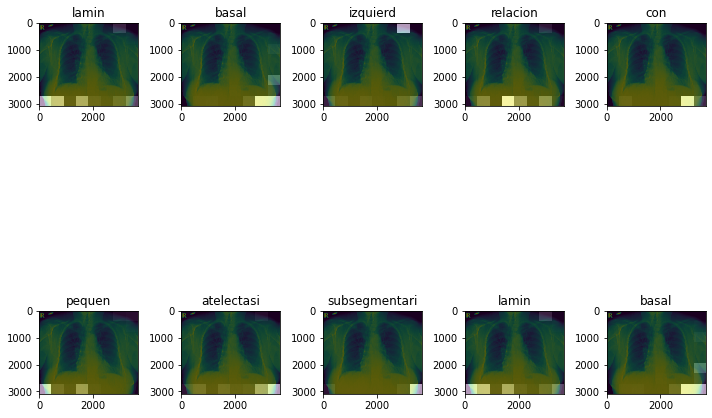

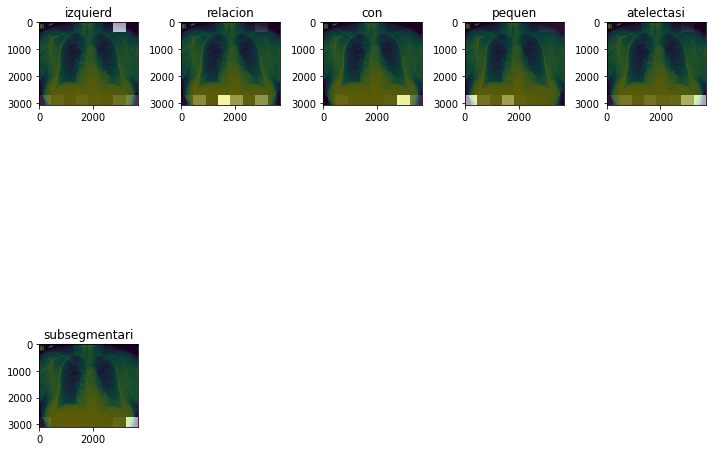

Real Caption: Translated(src=ca, dest=en, text=<Start> Dentro normal <end>, pronunciation=<Start> Dentro normal <end>, extra_data="{'translat...")
Prediction Caption: Cambi chronic pulmonary <end>


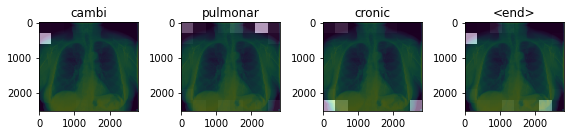

Real Caption: Translated(src=ca, dest=en, text=<Start> cardiomegaly under laminar atelectasis versus bilateral infiltrates perihiliar clinic function value <end>, pronunciation=<Start> cardiomegaly under laminar atelectasis versus bilateral infiltrates perihiliar clinic function value <end>, extra_data="{'translat...")
Prediction Caption: cardiomegaly pacemaker with 1st joint costoesternal Visualizer Body dorsal middle thorax left probable cardiomegaly it sells wine aorta Elong <end> cardiomegaly pacemaker with 1st joint costoesternal Visualizer Body dorsal middle thorax left probable cardiomegaly it sells wine aorta Elong <end> cardiomegaly pacemaker with 1st joint costoesternal Visualizer Body medium left dorsal thorax aorta likely cardiomegaly it sells wine Elong <end> cardiomegaly with pacemaker 1st Corps joint costoesternal Visualizer left dorsal thorax environment


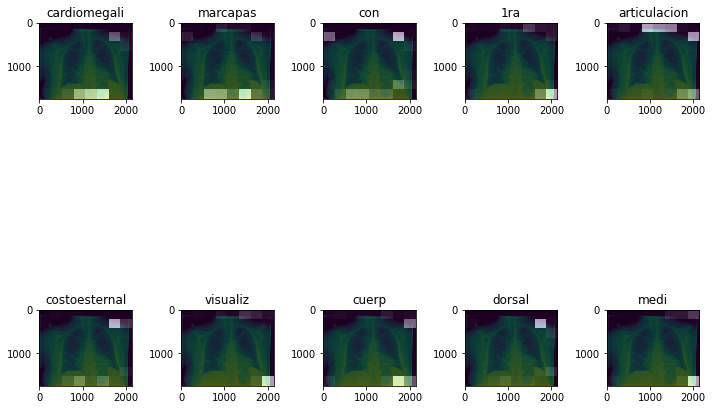

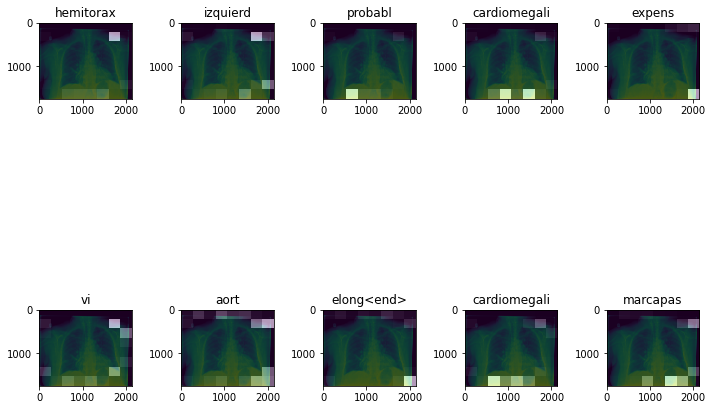

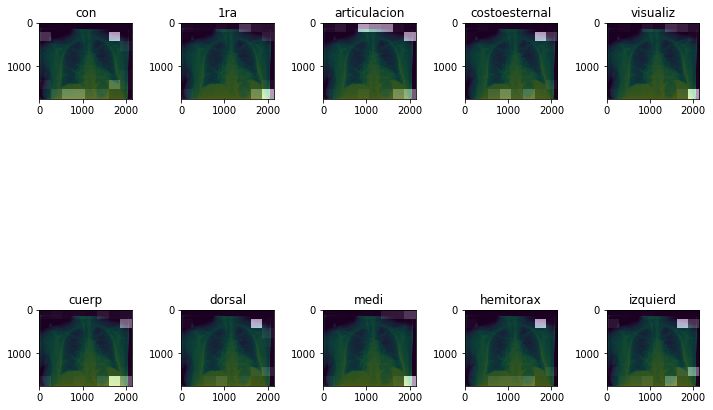

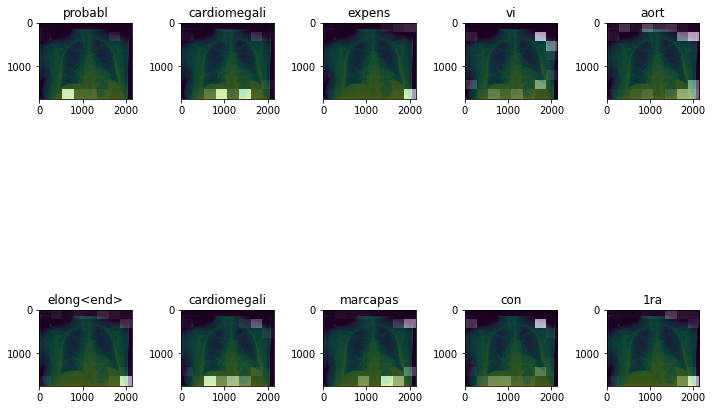

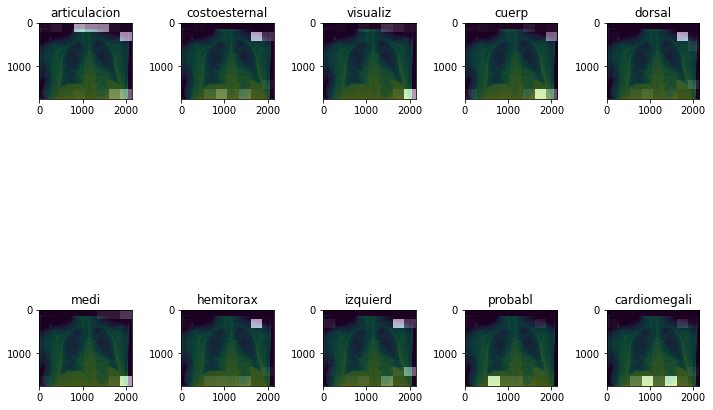

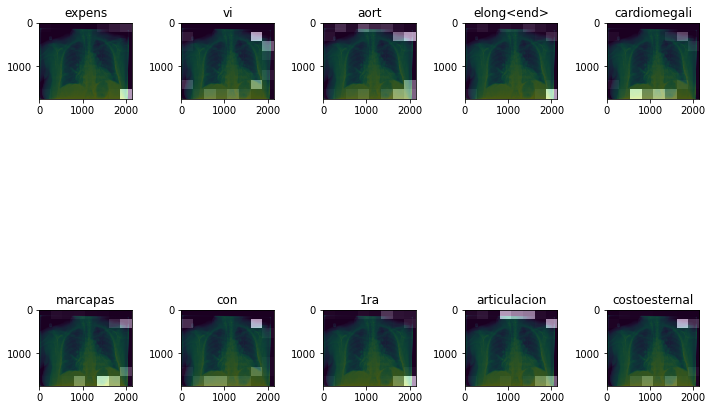

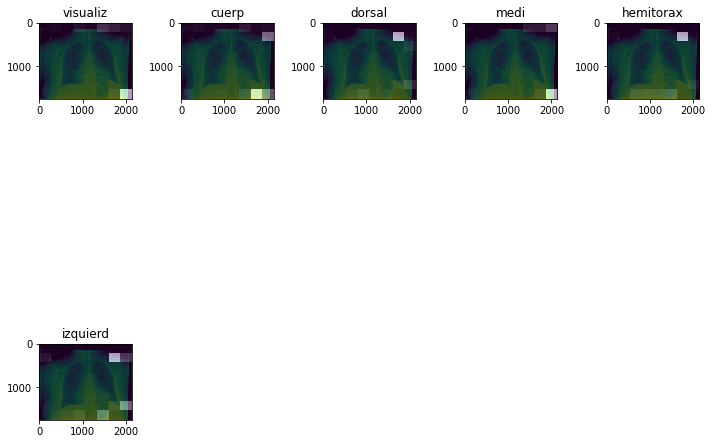

Real Caption: Translated(src=ca, dest=en, text=<Start> arco costal previous project thin hyperdense Right appreciation discreet impression corresponds with appreciation union Costochondral not alter sugest primoinfección tbc <end>, pronunciation=<Start> arco costal previous project thin hyperdense Right appreciation discreet impression corresponds with appreciation union Costochondral not alter sugest primoinfección tbc <end>, extra_data="{'translat...")
Prediction Caption: patron interstitial bilateral value process pneumonia infection value contact with pecan bull camp chronic lung field chronic lung field chronic lung field chronic lung field chronic lung field chronic lung field chronic lung field chronic lung field chronic lung field chronic lung field chronic lung field chronic lung field pulmonary chronic lung field camp chronic pulmonary chronic lung field camp chronic chronic pulmonary chronic lung field


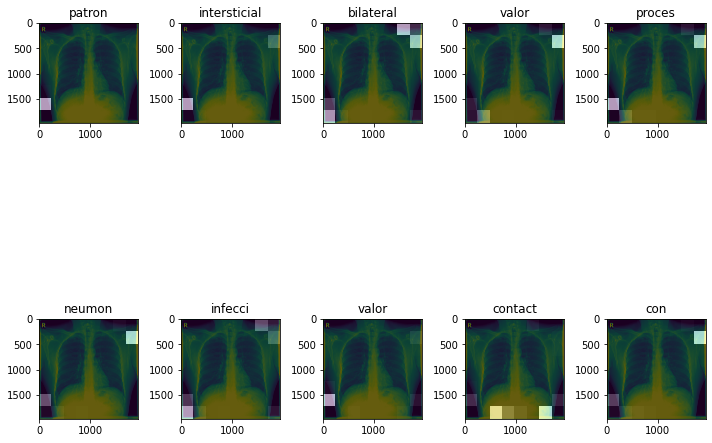

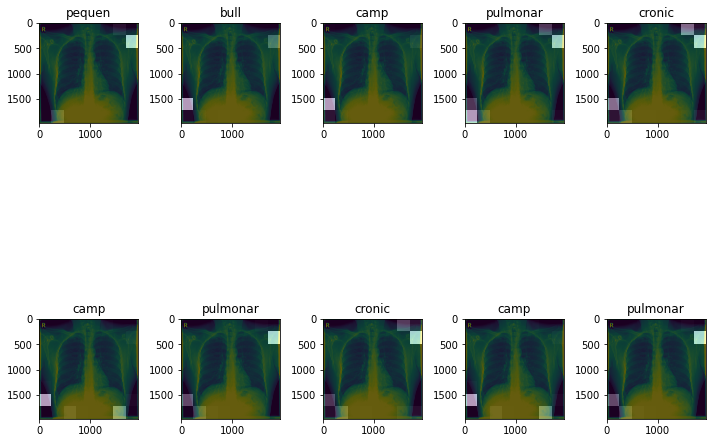

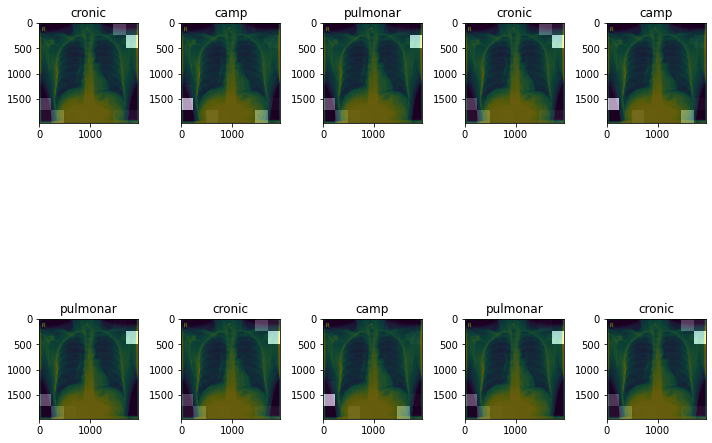

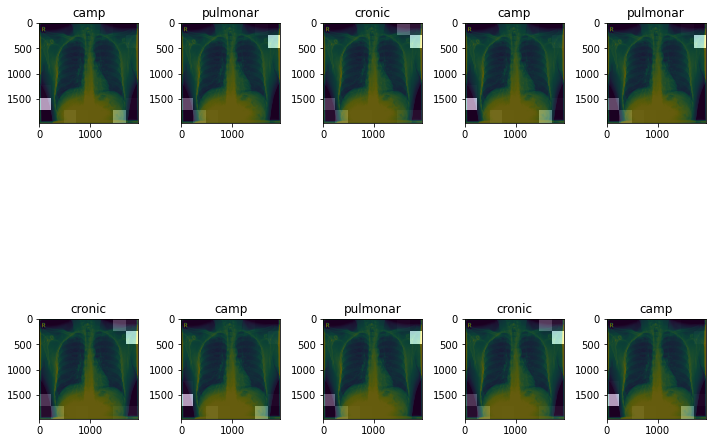

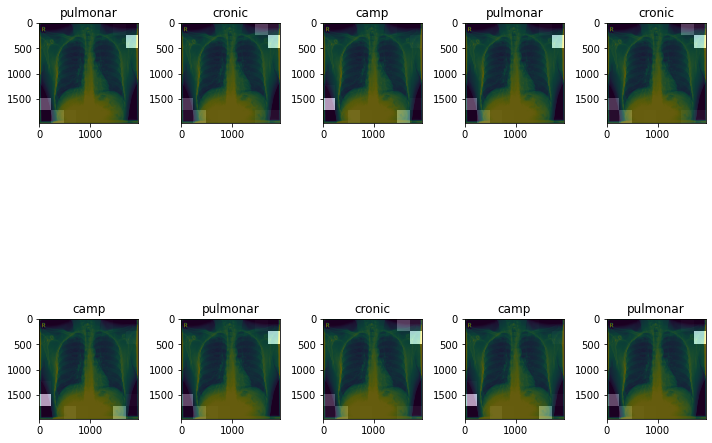

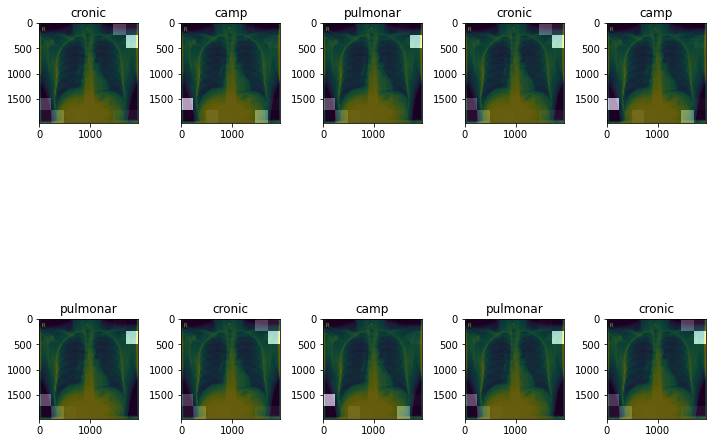

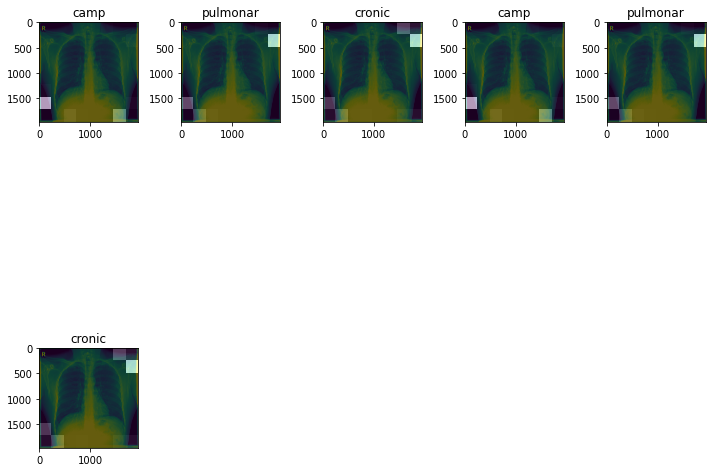

Real Caption: Translated(src=ca, dest=en, text=<Start> Mapping fractures but did not observe clear hallazg relevant <end>, pronunciation=<Start> Mapping fractures but did not observe clear hallazg relevant <end>, extra_data="{'translat...")
Prediction Caption: Radiology inter hallazg sin nor Cambi respect previous study <end>


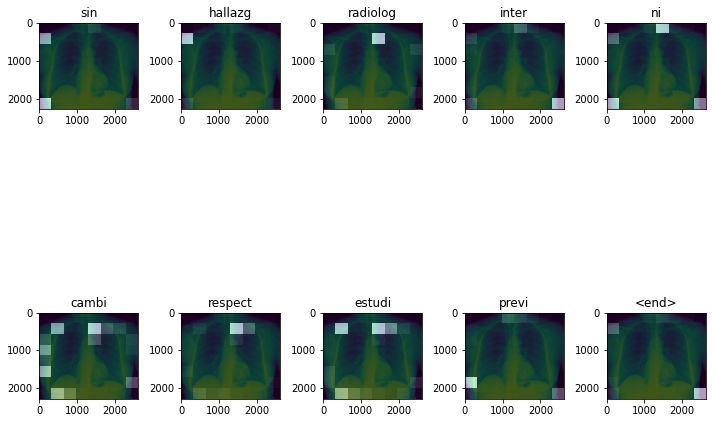

Real Caption: Translated(src=ca, dest=en, text=<Start> or no appreciation CONDENS pulmonary infiltrates <end>, pronunciation=<Start> or no appreciation CONDENS pulmonary infiltrates <end>, extra_data="{'translat...")
Prediction Caption: not observing ningun condensation pneumonia <end>


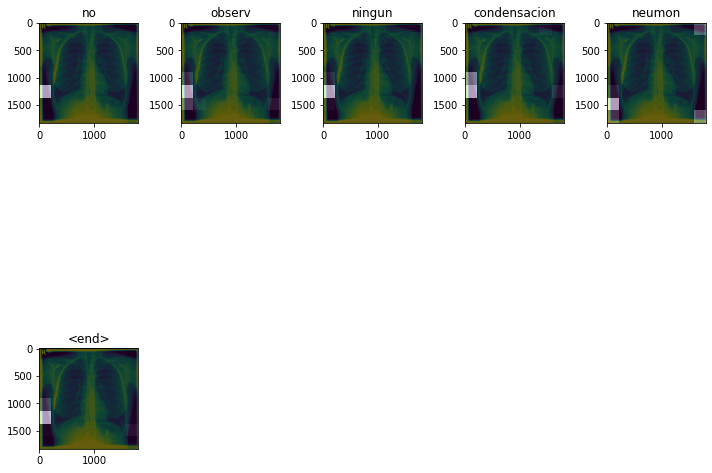

Real Caption: Translated(src=ca, dest=en, text=<Start> hallazg sin means spondylosis dorsal kyphosis <end>, pronunciation=<Start> hallazg sin means spondylosis dorsal kyphosis <end>, extra_data="{'translat...")
Prediction Caption: suboptimal study does not rot or appreciation CONDENS pulmonary infiltrates <end>


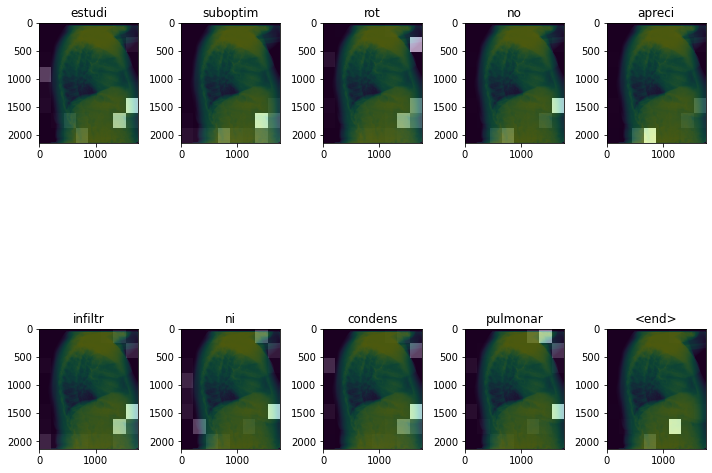

Real Caption: Translated(src=ca, dest=en, text=<Start> Cambi chronic pulmonary Liger sign trapped aere <end>, pronunciation=<Start> Cambi chronic pulmonary Liger sign trapped aere <end>, extra_data="{'translat...")
Prediction Caption: lobulacion hemidiafragm Derech <end>


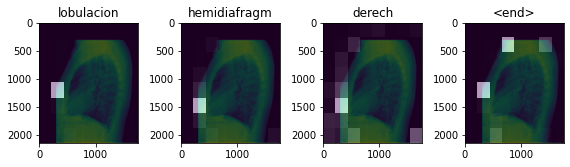

Real Caption: Translated(src=ca, dest=en, text=<Start> Visualizer time did not sign radiology infiltrates or pulmonary CONDENS Entido means <end>, pronunciation=<Start> Visualizer time did not sign radiology infiltrates or pulmonary CONDENS Entido means <end>, extra_data="{'translat...")
Prediction Caption: sign trapped aere Retrosternal Hili Taman estusi sign radiology COPD patron interstitial diffuse Recio appearance imag seudonodul tract pleuroparenquimat granuloma calcified sign trapped aere Retrosternal Hili Taman estusi sign radiology COPD patron interstitial diffuse Recio appearance imag seudonodul tract pleuroparenquimat granuloma calcified sign trapped aere Retrosternal Hili Taman estusi sign radiology COPD diffuse interstitial pattern Recio appearance imag seudonodul tract pleuroparenquimat calcified granulomas sign trapped aere


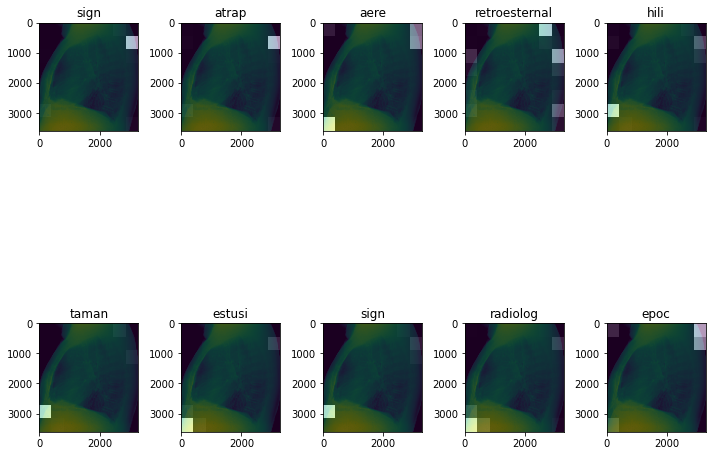

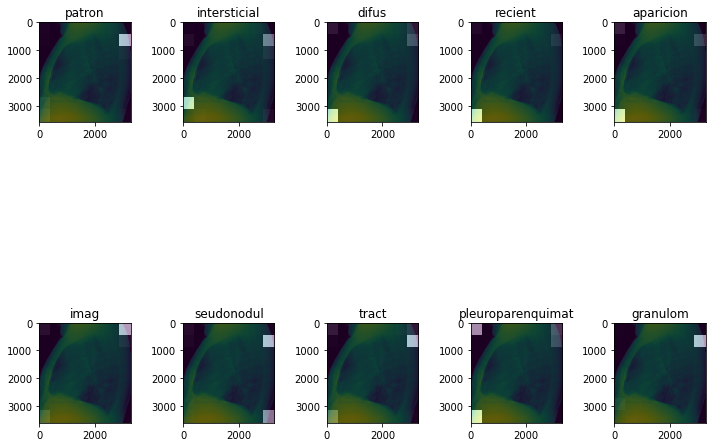

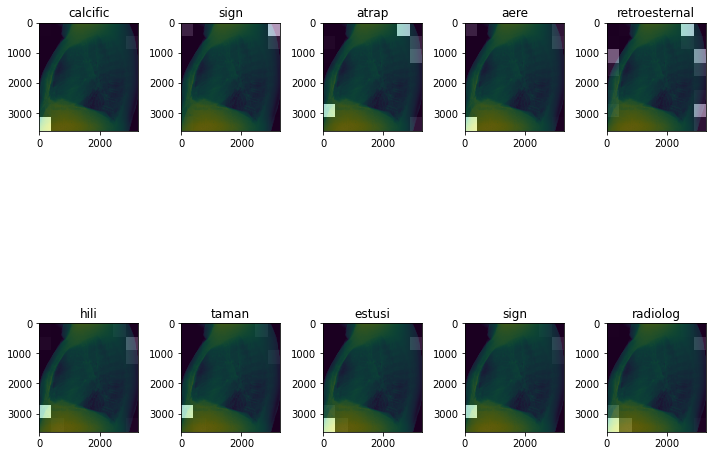

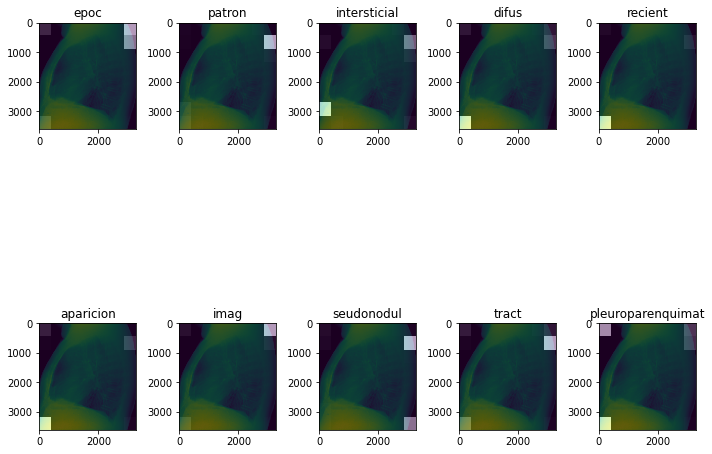

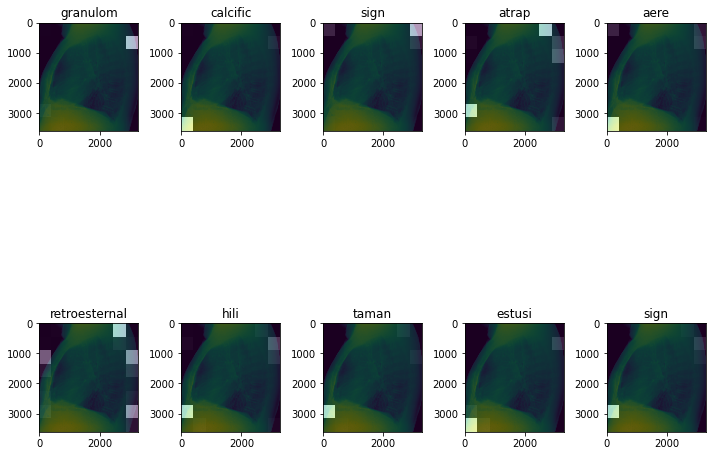

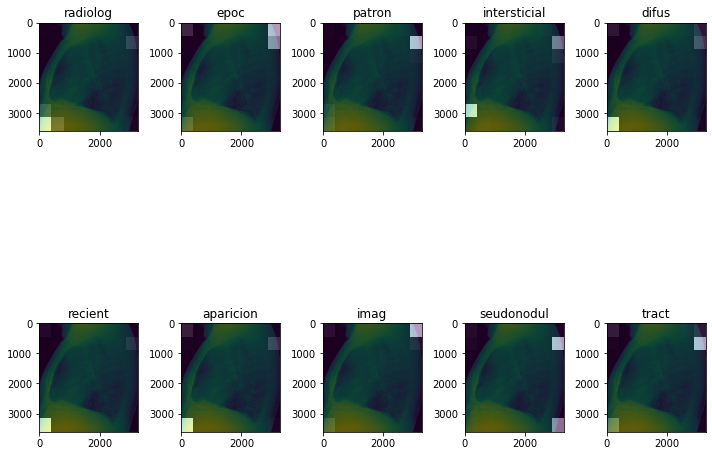

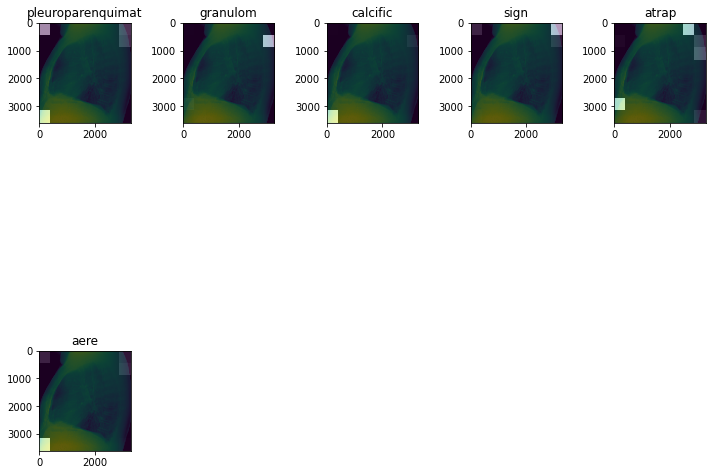

Real Caption: Translated(src=ca, dest=en, text=<Start> atelectasis Lamin sestertius Derech low environmental thorax lung left no significance hallazg <end>, pronunciation=<Start> atelectasis Lamin sestertius Derech low environmental thorax lung left no significance hallazg <end>, extra_data="{'translat...")
Prediction Caption: no appreciation infiltrated subsegmentari basal lamina Derech hallazg probable relationship with clinic no appreciation infiltrated subsegmentari basal lamina Derech hallazg probable relationship with clinic no appreciation infiltrated subsegmentari basal lamina Derech hallazg probable relationship with clinic no appreciation infiltrated subsegmentari basal lamina Derech hallazg probable relationship with clinic no appreciation subsegmentari infiltrating basal lamina Derech hallazg probable relationship with clinic subsegmentari no appreciation infiltrating basal lamina


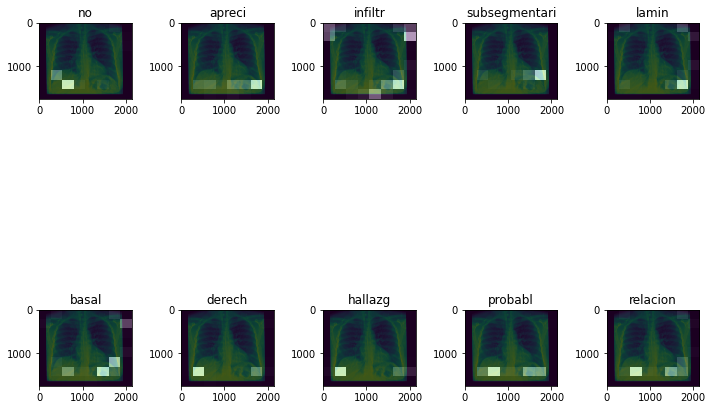

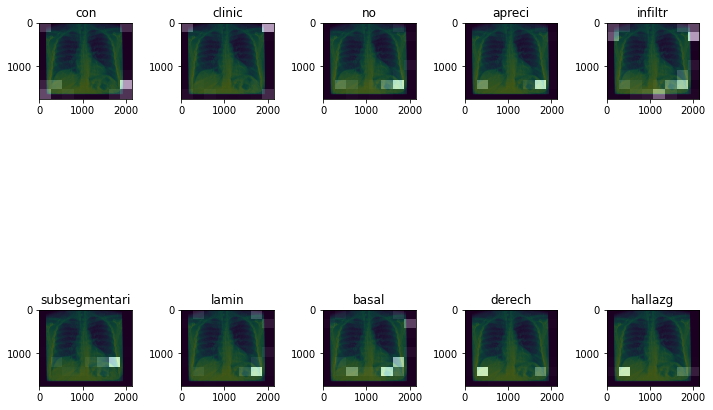

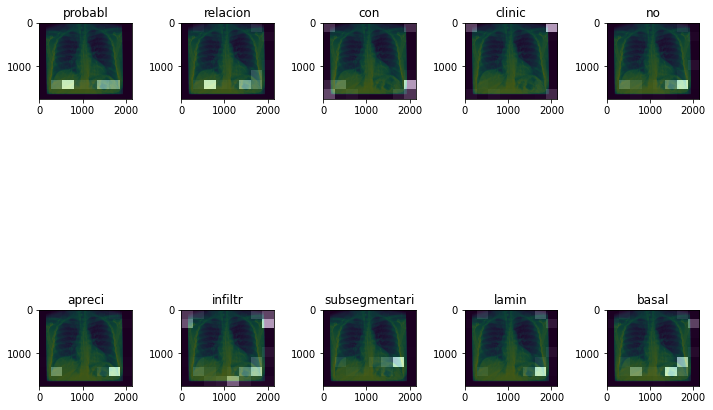

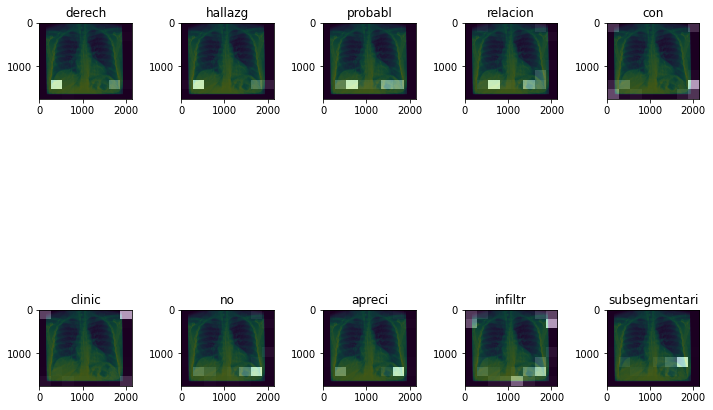

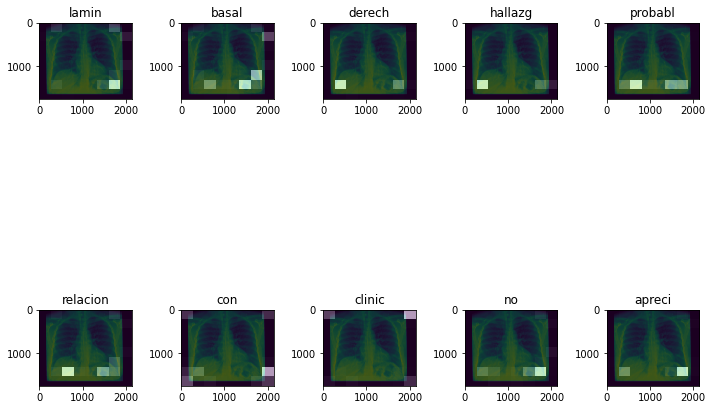

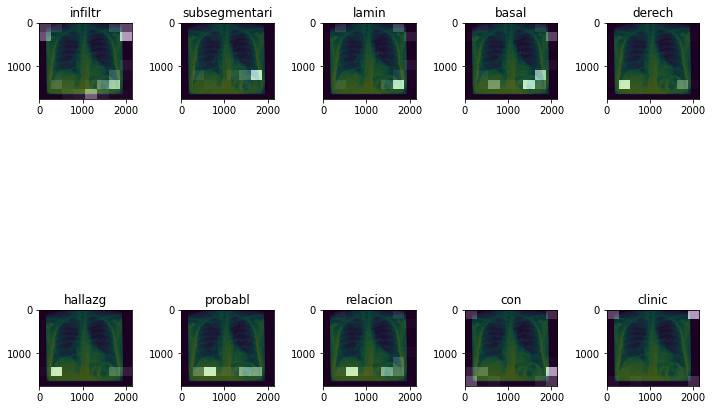

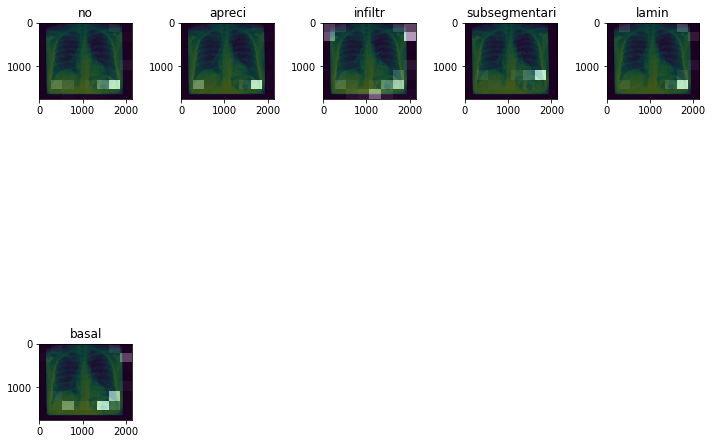

Real Caption: Translated(src=ca, dest=en, text=<Start> Radiology hallazg sin without meaning respect Cambi relevant previous study in 2011 with ano Compar <end>, pronunciation=<Start> Radiology hallazg sin without meaning respect Cambi relevant previous study in 2011 with ano Compar <end>, extra_data="{'translat...")
Prediction Caption: bibasal bilateral interstitial pattern predominantly sin means hallazg <end>


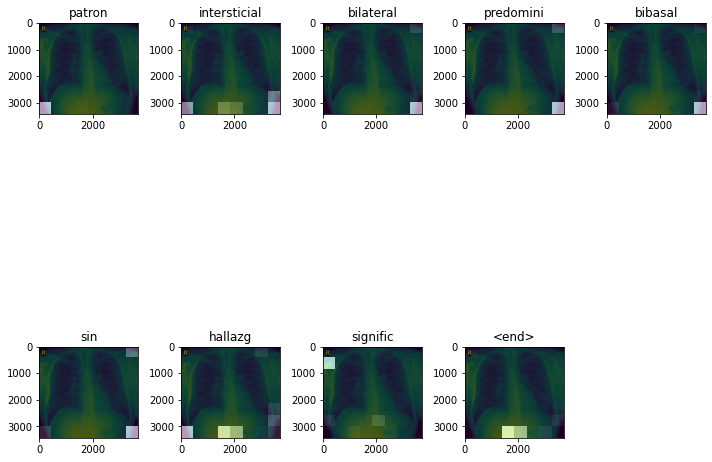

Real Caption: Translated(src=ca, dest=en, text=<Start> sign radiology COPD Hili prominent probable vascular etiology bilateral gynecomastia <end>, pronunciation=<Start> sign radiology COPD Hili prominent probable vascular etiology bilateral gynecomastia <end>, extra_data="{'translat...")
Prediction Caption: Derech hallazg infrahili interstitial pattern corresponds with elongations aortic Cambi chronic pulmonary <end>


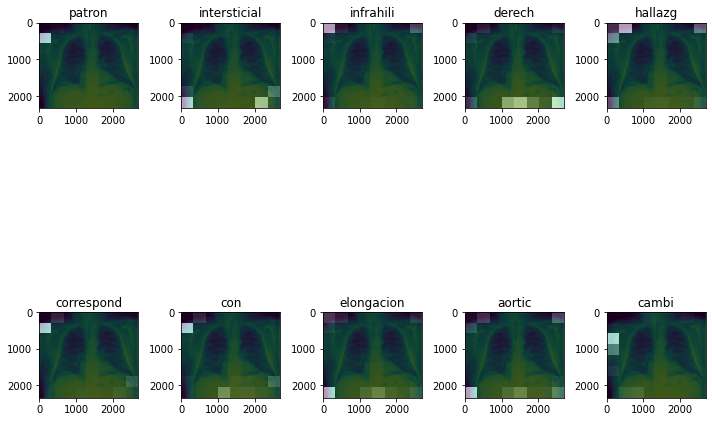

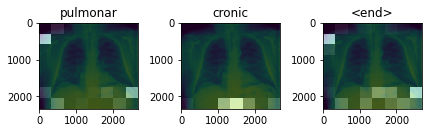

Real Caption: Translated(src=ca, dest=en, text=<Start> pinzamient sen costofren later left without hallazg pray <end>, pronunciation=<Start> pinzamient sen costofren later left without hallazg pray <end>, extra_data="{'translat...")
Prediction Caption: Silhouette cardiomediastin parenquim lung imagen lobulacion hemidiafragm Derech <end>


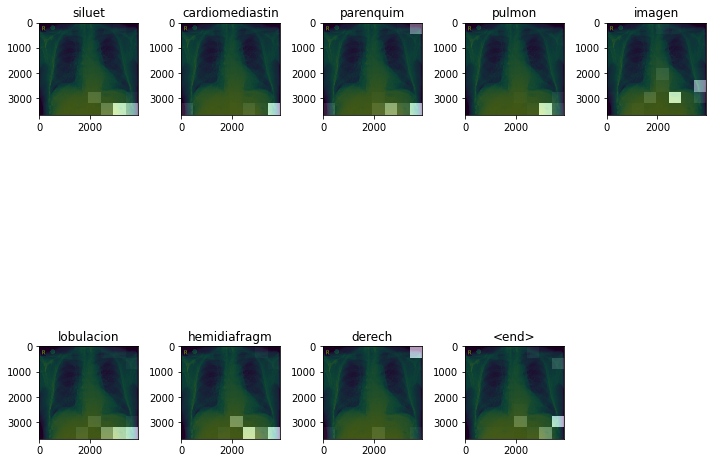

Real Caption: Translated(src=ca, dest=en, text=<Start> objet mejor means infiltrated with respect retrocardiac not levy lid pleural <end>, pronunciation=<Start> objet mejor means infiltrated with respect retrocardiac not levy lid pleural <end>, extra_data="{'translat...")
Prediction Caption: nasogastric tube axial column infradiaphragmatic change Mecan degener <end>


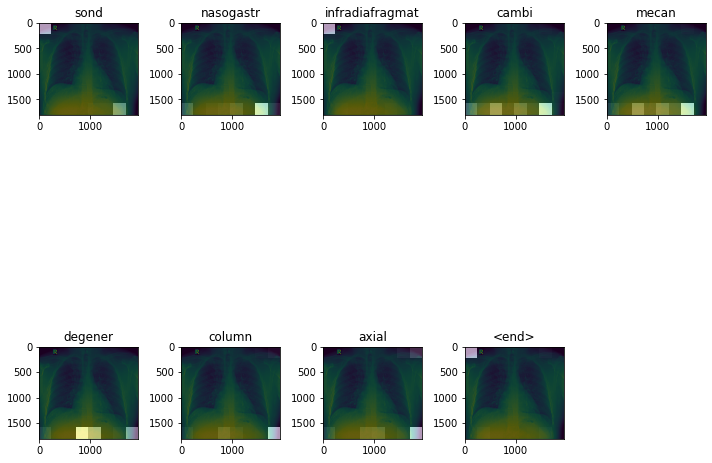

Real Caption: Translated(src=ca, dest=en, text=<Start> Hili prominent vascular sin hallazg relevant <end>, pronunciation=<Start> Hili prominent vascular sin hallazg relevant <end>, extra_data="{'translat...")
Prediction Caption: Cambi chronic lung bibasal ASOC atelectasis laminar bibasal Cambi chronic lung bibasal ASOC atelectasis laminar bibasal Cambi chronic lung bibasal ASOC atelectasis laminar bibasal Cambi chronic lung bibasal ASOC atelectasis laminar bibasal Cambi chronic lung bibasal ASOC atelectasis laminar bibasal Cambi chronic lung bibasal ASOC atelectasis laminar bibasal Cambi lung ASOC bibasal chronic pulmonary atelectasis laminar bibasal Cambi bibasal ASOC chronic pulmonary atelectasis laminar bibasal Cambi


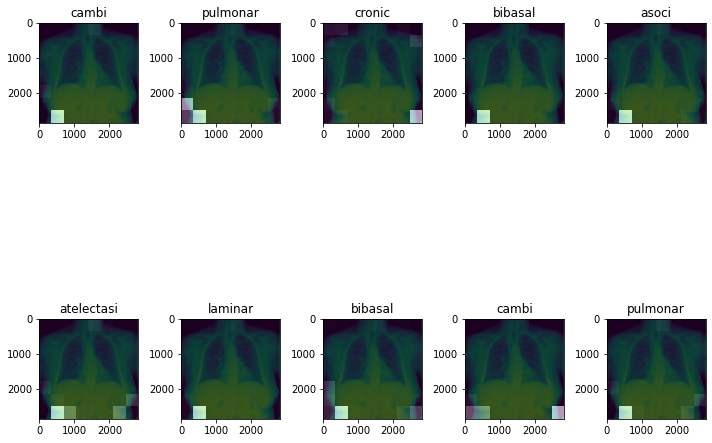

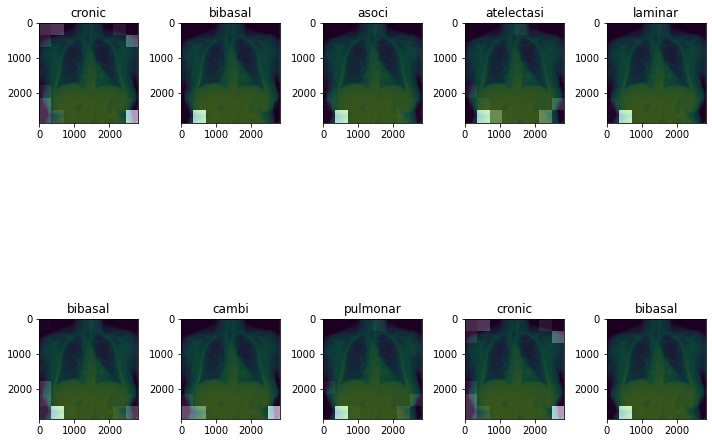

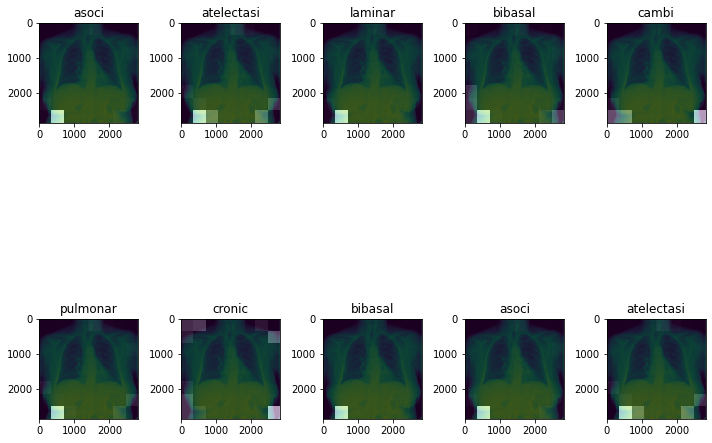

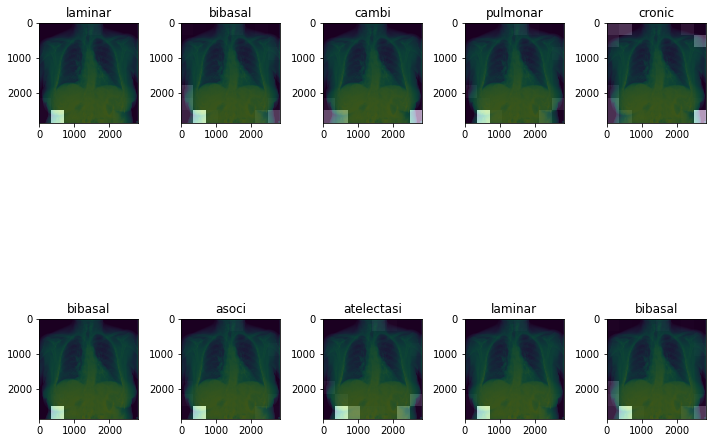

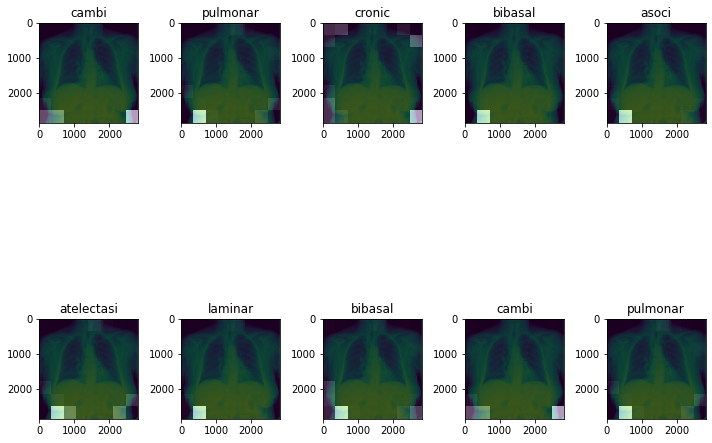

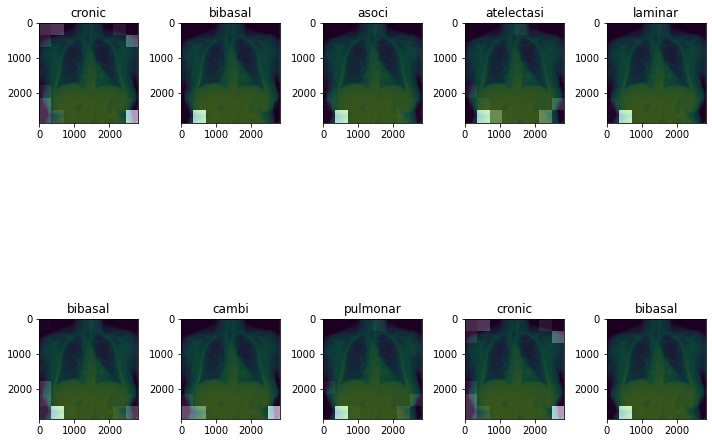

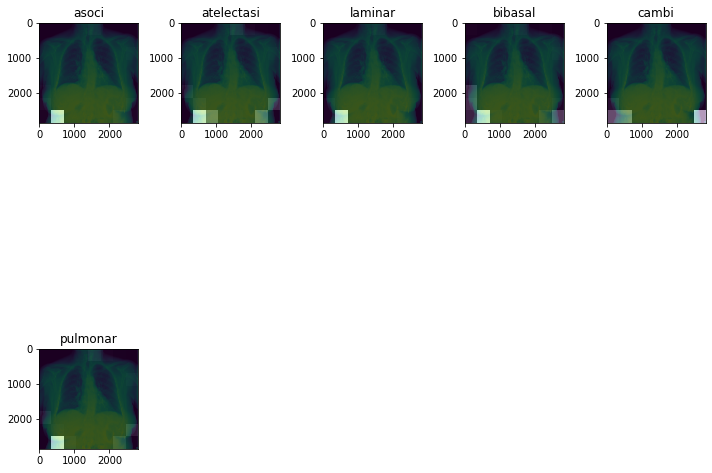

Real Caption: Translated(src=ca, dest=en, text=<Start> Cambi medium sternotomy <end>, pronunciation=<Start> Cambi medium sternotomy <end>, extra_data="{'translat...")
Prediction Caption: Cambi pulmonary radiology sign present predominance bibasal projection COPD loses volume thorax left calcified granulomas likely LSI increases densid present preliminary study with lateral projection <end>


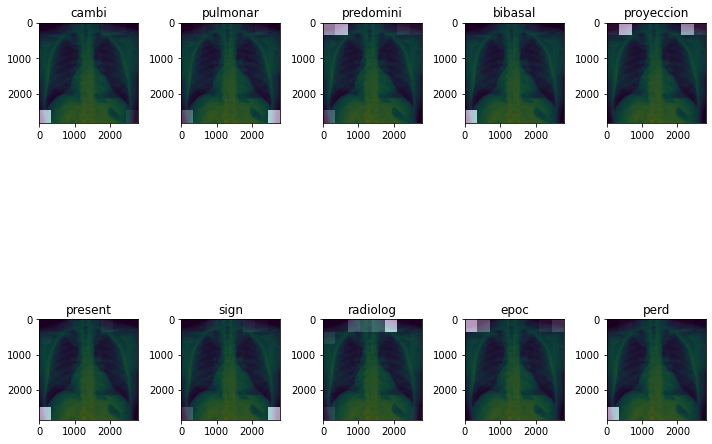

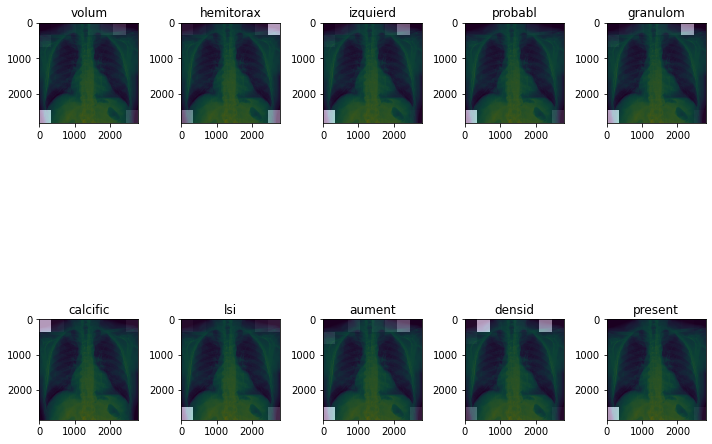

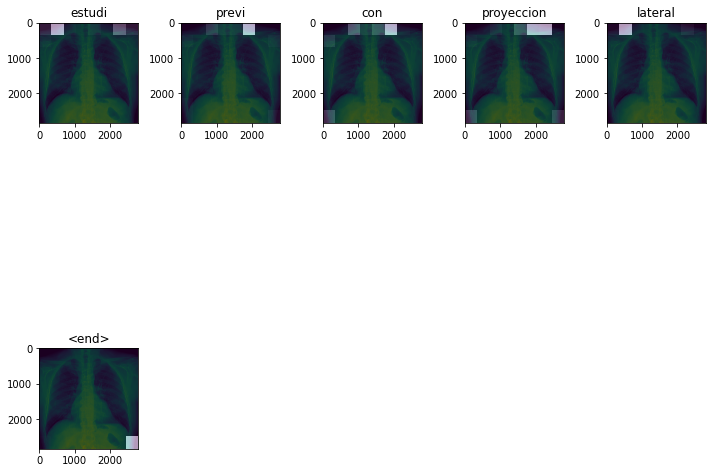

Real Caption: Translated(src=ca, dest=en, text=<Start> Silhouette CARDI Dentro normal mediastinum Hili prominent probable vascular sen costofren libr tax Cambi Cambi Mecan spine without relevant previous study with respect comp <end>, pronunciation=<Start> Silhouette CARDI Dentro normal mediastinum Hili prominent probable vascular sen costofren libr tax Cambi Cambi Mecan spine without relevant previous study with respect comp <end>, extra_data="{'translat...")
Prediction Caption: sign dorsal spondylosis <end>


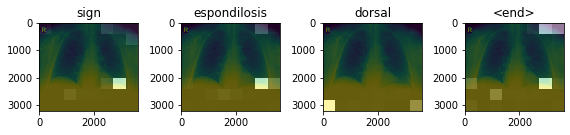

Real Caption: Translated(src=ca, dest=en, text=<Start> multiple bilateral pulmonary nodular lesion Taman different distribution plant fuzzy appearance Recio first option diagnost pulmonary metastases men orig probable infection cit complete study with tc thorax elongations with aortic calcified atheromatous Cambi degener ose with scoliosis osteofitosis back Lumb diffuse osteopenia <end>, pronunciation=<Start> multiple bilateral pulmonary nodular lesion Taman different distribution plant fuzzy appearance Recio first option diagnost pulmonary metastases men orig probable infection cit complete study with tc thorax elongations with aortic calcified atheromatous Cambi degener ose with scoliosis osteofitosis back Lumb diffuse osteopenia <end>, extra_data="{'translat...")
Prediction Caption: Compar comp con con comp <end>


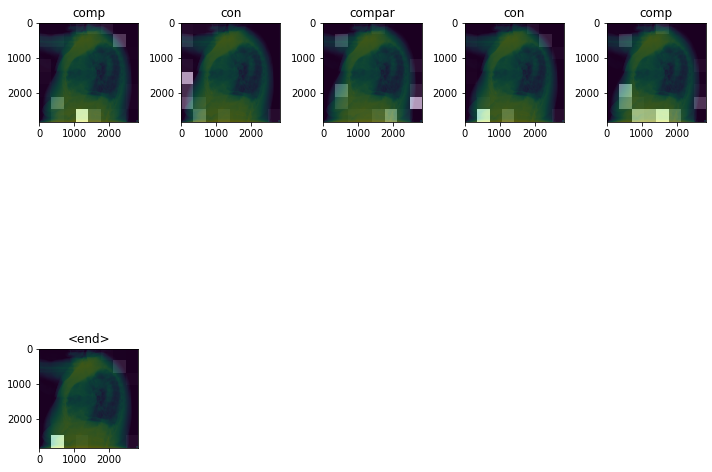

Real Caption: Translated(src=ca, dest=en, text=<Start> study Dentro normal limit <end>, pronunciation=<Start> study Dentro normal limit <end>, extra_data="{'translat...")
Prediction Caption: Nodular basal Derech hallazg meanings <end>


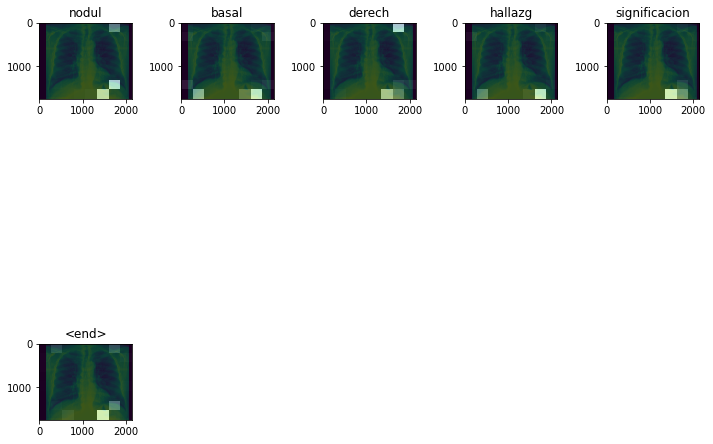

Real Caption: Translated(src=ca, dest=en, text=<Start> indic cardiotorac not limit normal high appreciation rib injury <end>, pronunciation=<Start> indic cardiotorac not limit normal high appreciation rib injury <end>, extra_data="{'translat...")
Prediction Caption: pneumonia spills pleural busy sen costodiafragmat left levy pleural busy sen costodiafragmat left levy pleural busy sen costodiafragmat left levy pleural busy sen costodiafragmat left levy pleural busy sen costodiafragmat left levy pleural busy sen costodiafragmat left levy pleural busy sen costodiafragmat left levy pleural busy sen costodiafragmat left levy costodiafragmat left pleural busy sen sen busy spills pleural effusion levy costodiafragmat left occupied sen costodiafragmat


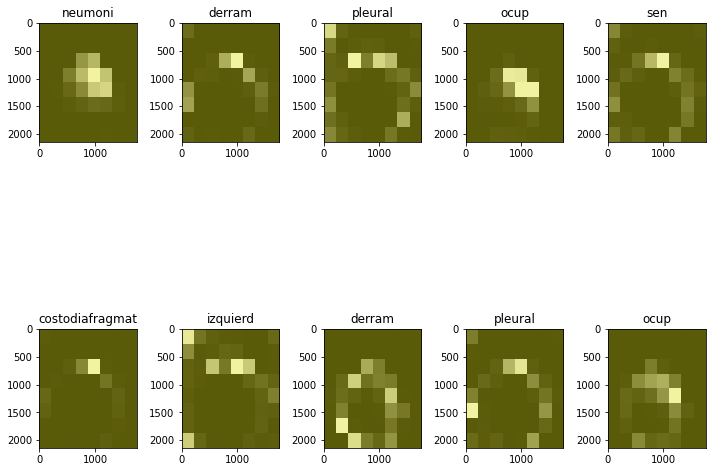

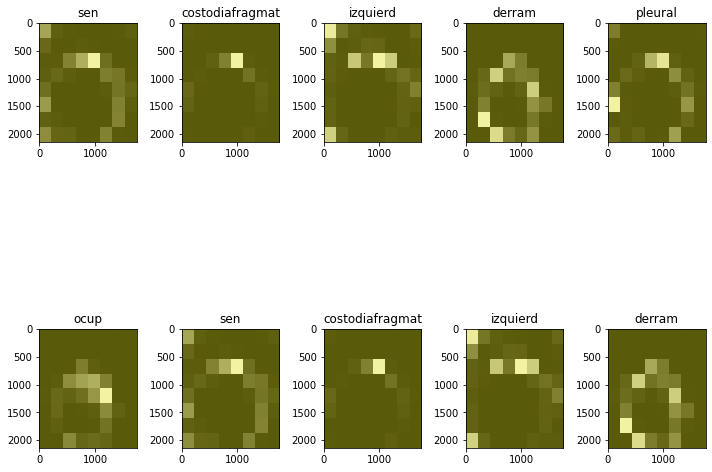

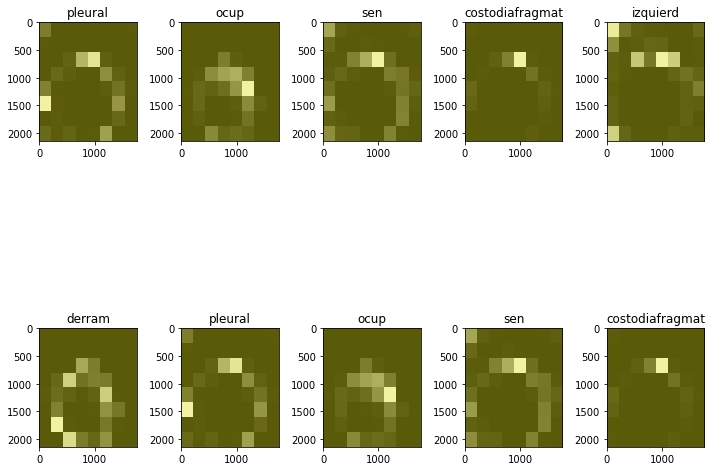

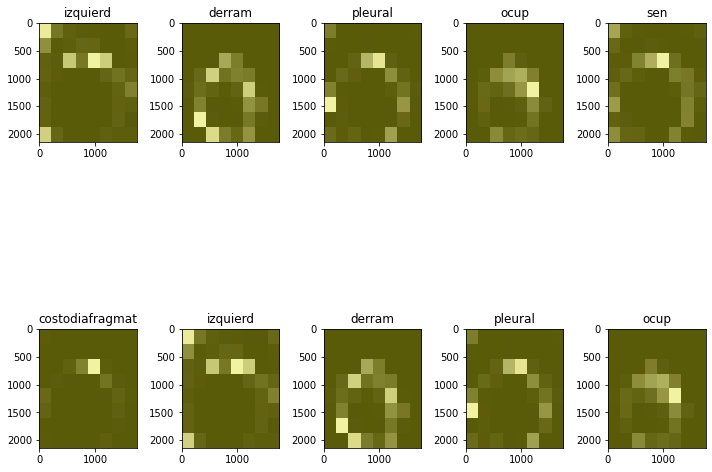

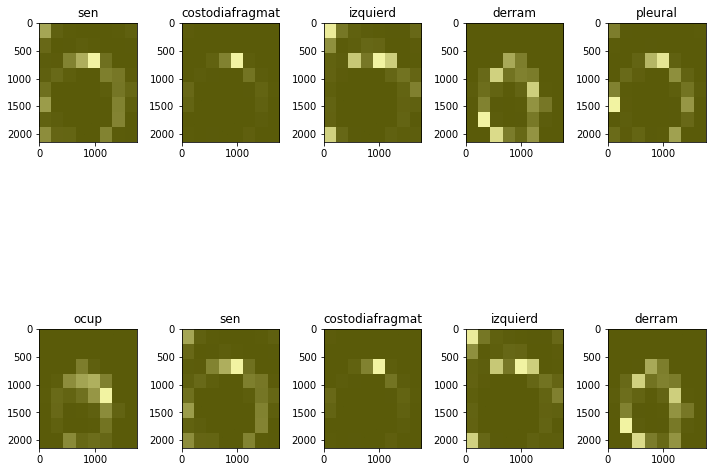

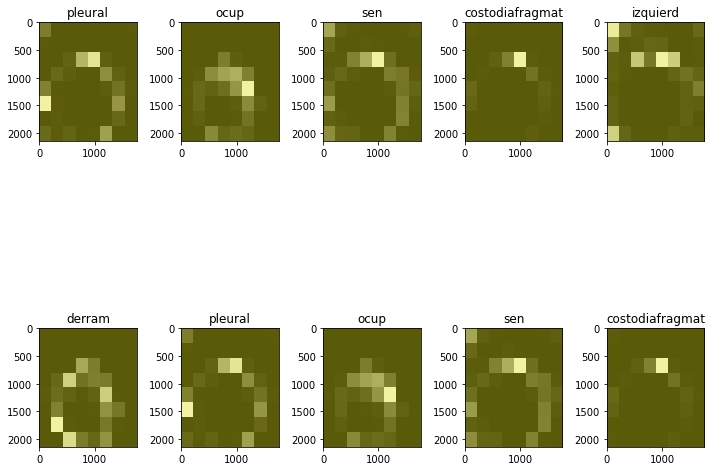

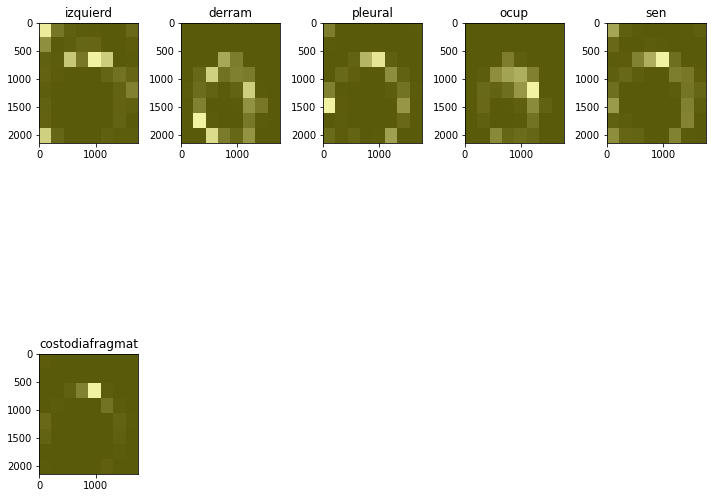

Real Caption: Translated(src=ca, dest=en, text=<Start> calcified aortic atheromatous Cambi degener ose axial skeleton study include radiology inter sin hallazg <end>, pronunciation=<Start> calcified aortic atheromatous Cambi degener ose axial skeleton study include radiology inter sin hallazg <end>, extra_data="{'translat...")
Prediction Caption: Hili left pleural wholesale biapical <end>


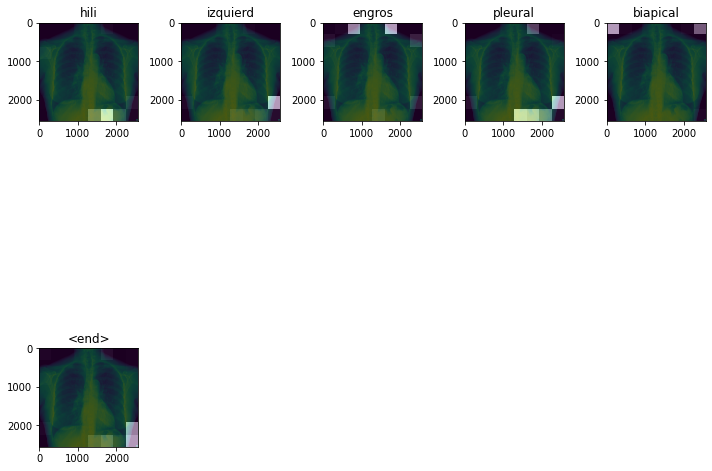

Real Caption: Translated(src=ca, dest=en, text=<Start> Cambi amount cronci sign COPD Liger mejor intestici alveolar infiltrates morphology pseudonodul basal atelectasis Derech retrocardiac elongations barter supraarot Boci sign with dorsal spondylosis osteofitosis prominent dorsal lateral scoliosis <end>, pronunciation=<Start> Cambi amount cronci sign COPD Liger mejor intestici alveolar infiltrates morphology pseudonodul basal atelectasis Derech retrocardiac elongations barter supraarot Boci sign with dorsal spondylosis osteofitosis prominent dorsal lateral scoliosis <end>, extra_data="{'translat...")
Prediction Caption: Chest X-ray sin hallazg pathology means with respect previous study Compar with Compar with Compar with Compar with Compar with Compar with Compar with Compar with Compar with Compar with Compar with Compar with Compar with Compar with Compar with Compar with Compar with Compar with Compar with Compar con Compar Compar con con con Compar Compar Compar con con con Compa

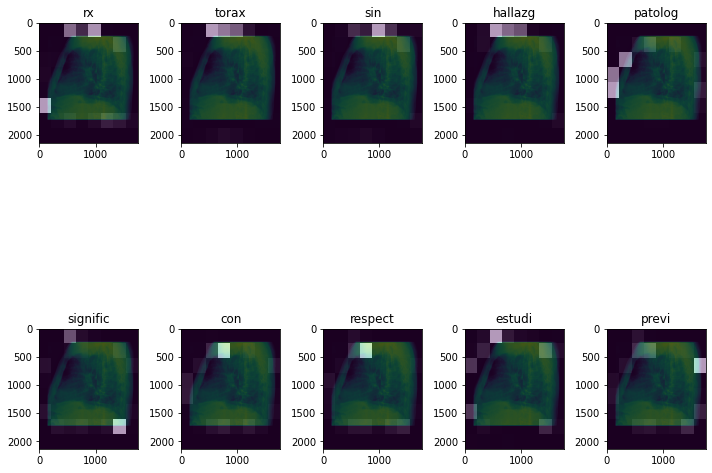

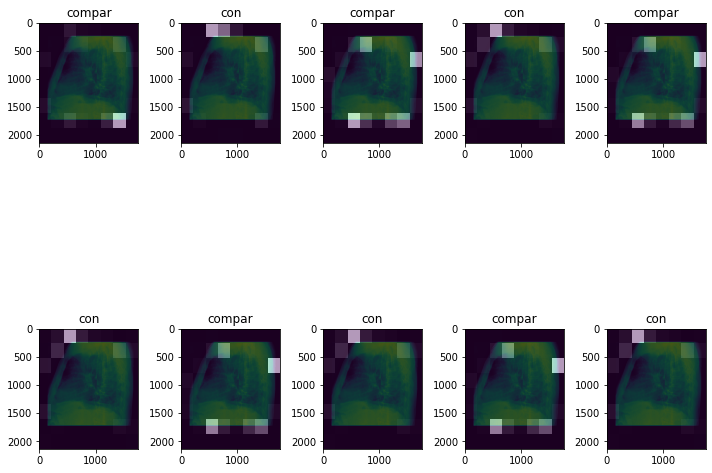

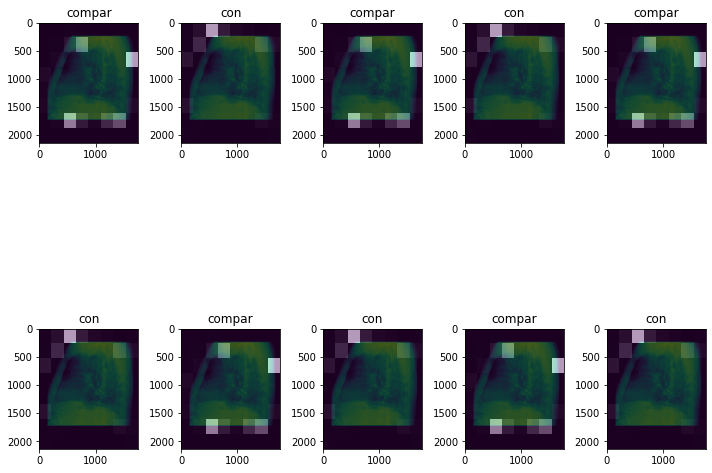

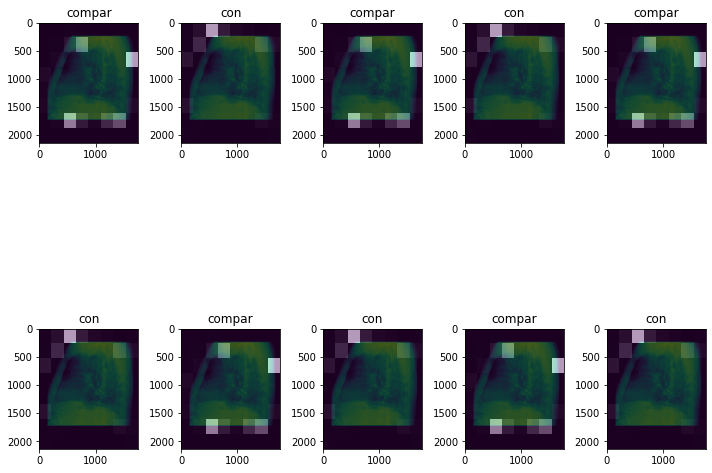

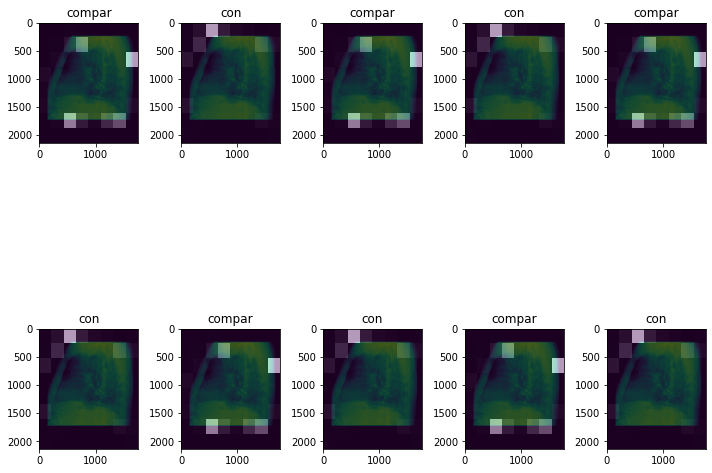

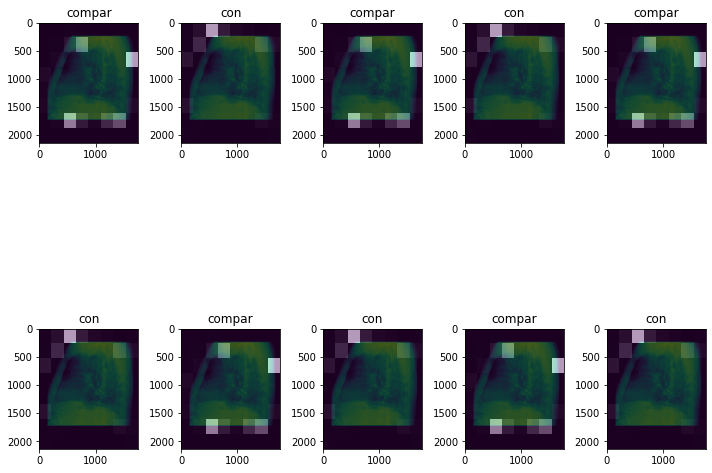

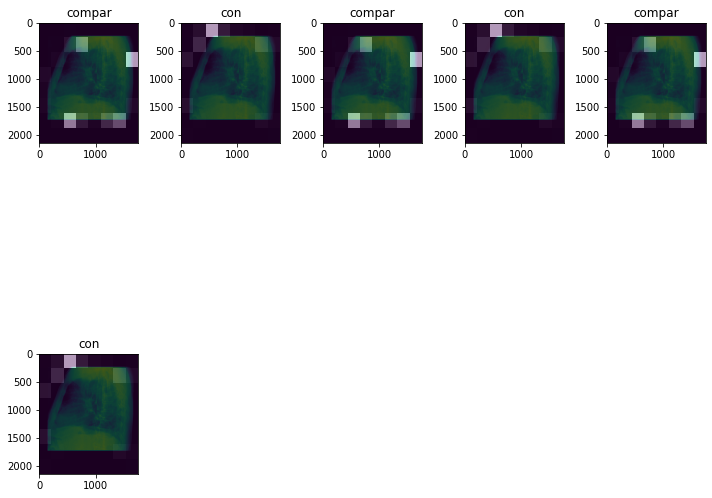

Real Caption: Translated(src=ca, dest=en, text=<Start> Radiology sin hallazg relevant <end>, pronunciation=<Start> Radiology sin hallazg relevant <end>, extra_data="{'translat...")
Prediction Caption: no appreciation infiltrated means <end>


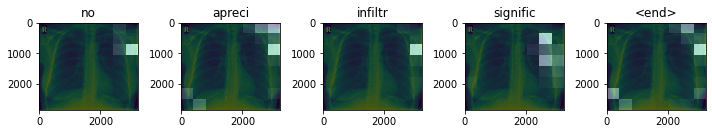

Real Caption: Translated(src=ca, dest=en, text=<Start> osteopororsis fuzzy dorsal spondylosis imag dense nodular morphology proyect lid along cardiofren sen no visible projection pa appreciation Side deb deb big spikes correspond summation image but you proyect orthogonal recom evaluated con tac aorta Elong <end>, pronunciation=<Start> osteopororsis fuzzy dorsal spondylosis imag dense nodular morphology proyect lid along cardiofren sen no visible projection pa appreciation Side deb deb big spikes correspond summation image but you proyect orthogonal recom evaluated con tac aorta Elong <end>, extra_data="{'translat...")
Prediction Caption: no appreciation pulmonary infiltrates or CONDENS <end>


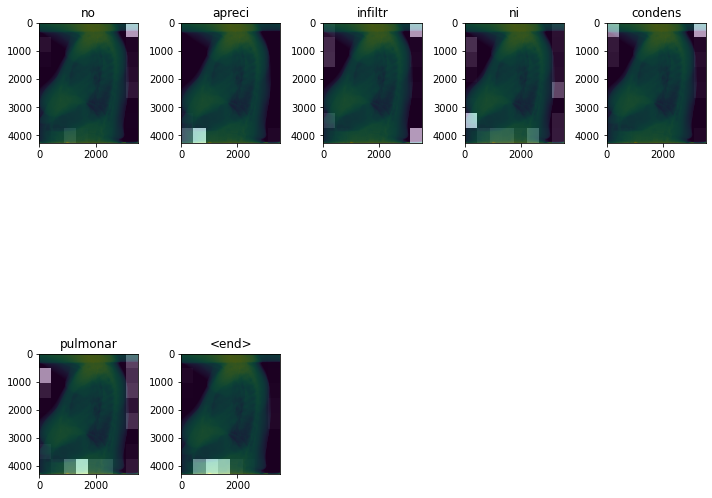

Real Caption: Translated(src=ca, dest=en, text=<Start> Study sin means alter <end>, pronunciation=<Start> Study sin means alter <end>, extra_data="{'translat...")
Prediction Caption: thorax side without bread hallazg <end>


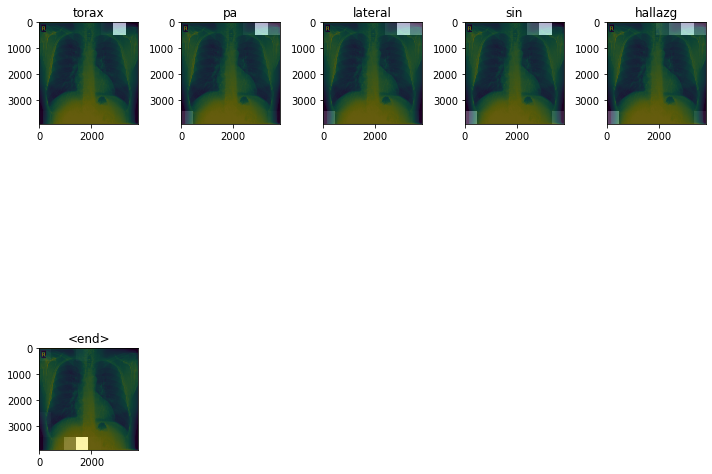

Real Caption: Translated(src=ca, dest=en, text=<Start> comp preliminary study with 22 juni 2016 FECH Observers resolution patron icc <end>, pronunciation=<Start> comp preliminary study with 22 juni 2016 FECH Observers resolution patron icc <end>, extra_data="{'translat...")
Prediction Caption: no appreciation infiltrated means <end>


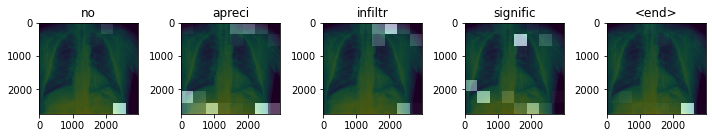

Real Caption: Translated(src=ca, dest=en, text=<Start> sin hallazg relevant <end>, pronunciation=<Start> sin hallazg relevant <end>, extra_data="{'translat...")
Prediction Caption: Melanoma esplda motif consult prior thorax FECH 08 2011 <end>


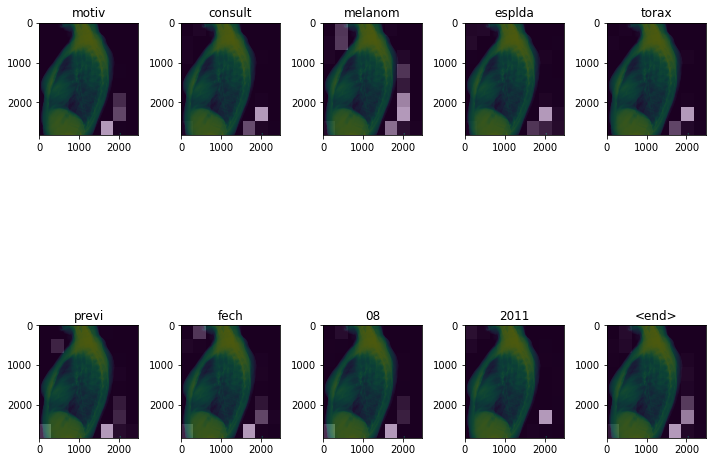

Real Caption: Translated(src=ca, dest=en, text=<Start> hallazg Silhouette mediastinal increase cardio pulmonary CONDENS size does not observe it spills pleural <end>, pronunciation=<Start> hallazg Silhouette mediastinal increase cardio pulmonary CONDENS size does not observe it spills pleural <end>, extra_data="{'translat...")
Prediction Caption: hallazg sin <end>


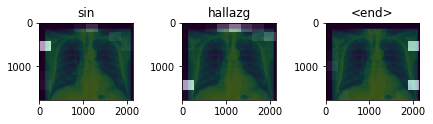

Real Caption: Translated(src=ca, dest=en, text=<Start> hallazgos radiology sin means <end>, pronunciation=<Start> hallazgos radiology sin means <end>, extra_data="{'translat...")
Prediction Caption: Left apical pleural wholesale previous study in 2013 FECH 4 cm <end>


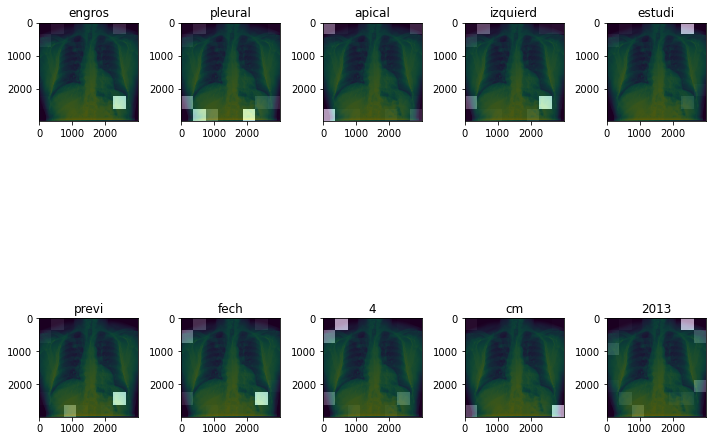

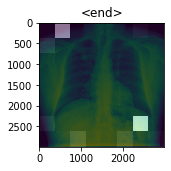

Real Caption: Translated(src=ca, dest=en, text=<Start> hallazg sin no appreciation consolidate relevant <end>, pronunciation=<Start> hallazg sin no appreciation consolidate relevant <end>, extra_data="{'translat...")
Prediction Caption: wholesale traduc bilateral pulmonary hypertension Right sin hallazgo relevant <end>


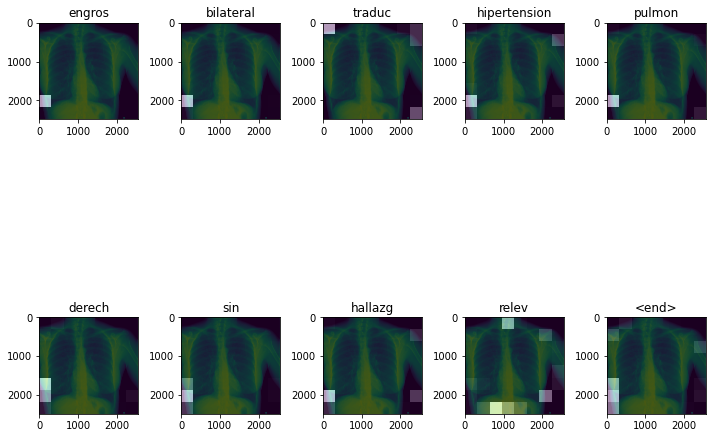

Real Caption: Translated(src=ca, dest=en, text=<Start> sin Cambi study with respect ayer <end>, pronunciation=<Start> sin Cambi study with respect ayer <end>, extra_data="{'translat...")
Prediction Caption: via central trav sold cav upper left sng sold cav upper left sng sold cav upper left sng sold cav upper left sng sold cav upper left sng sold cav upper left sng sold cav upper left sng sold cav upper left sng sold cav upper left sng sold cav top left top left sng sng cav sells sells sells cav cav upper left sng top


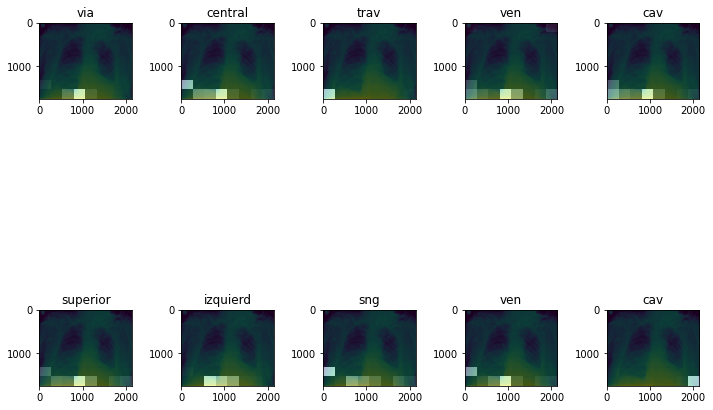

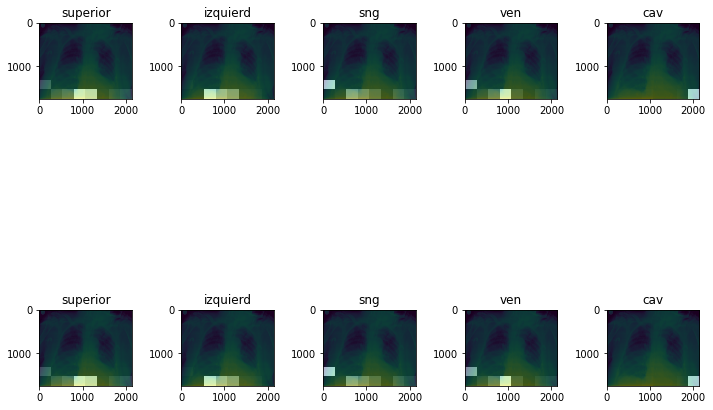

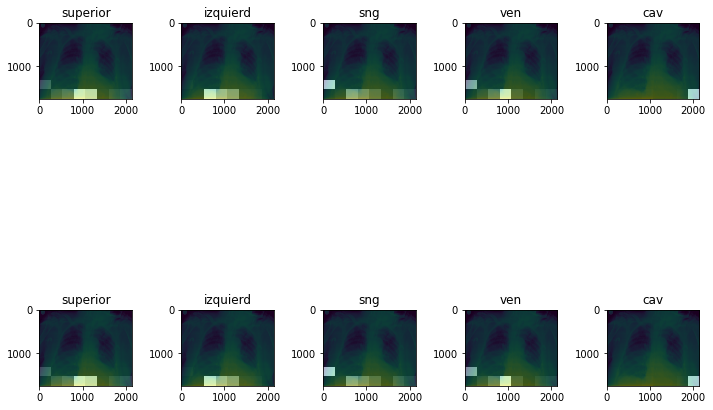

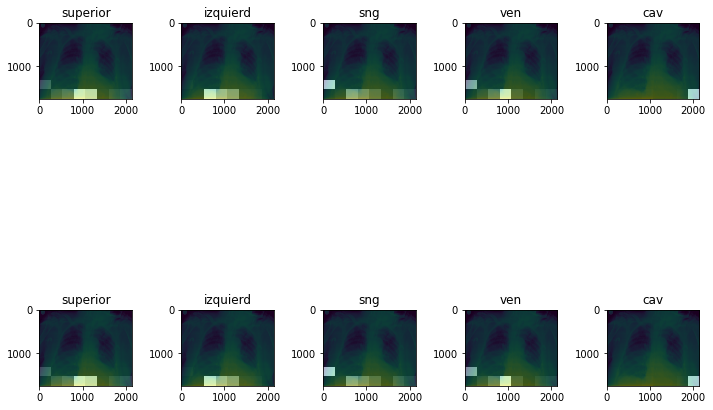

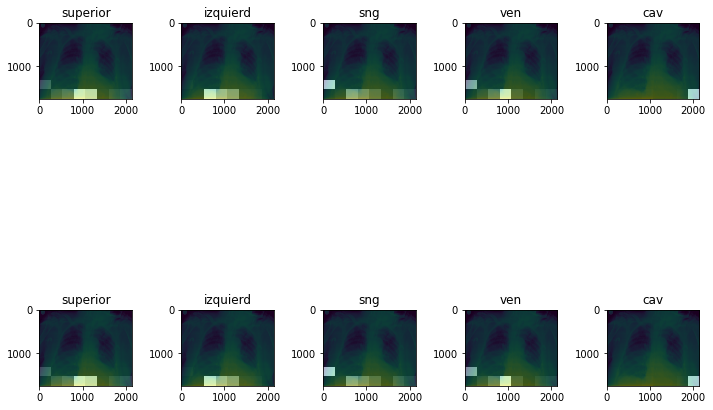

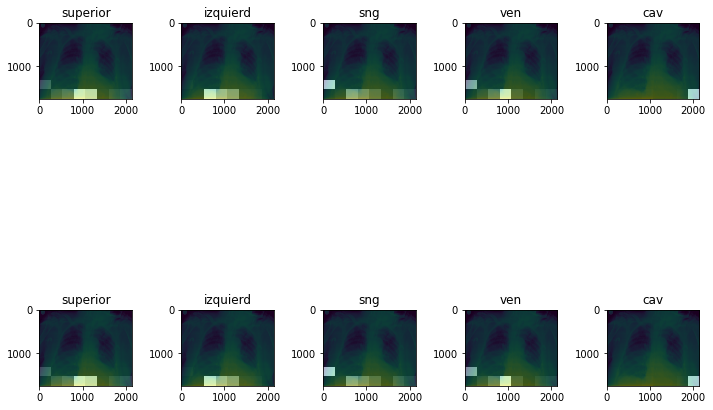

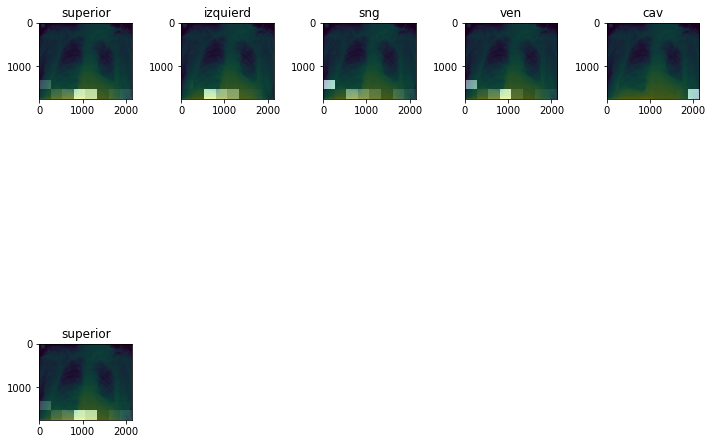

Real Caption: Translated(src=ca, dest=en, text=<Start> densid nodules localizacion parahiliar left commend complete study program form with taco thoracic pathologies discard localizacion rest exploration sin means alter <end>, pronunciation=<Start> densid nodules localizacion parahiliar left commend complete study program form with taco thoracic pathologies discard localizacion rest exploration sin means alter <end>, extra_data="{'translat...")
Prediction Caption: no appreciation or infiltrated CONDENS dorsal kyphosis Silhouette cardiac pulmonary atelectasis basal lamina Derech prominent probable vascular sin Cambi great respect perform 13th in 2013 with 08 sign trapped aere Cambi chronic pulmonary aorta elongations <end>


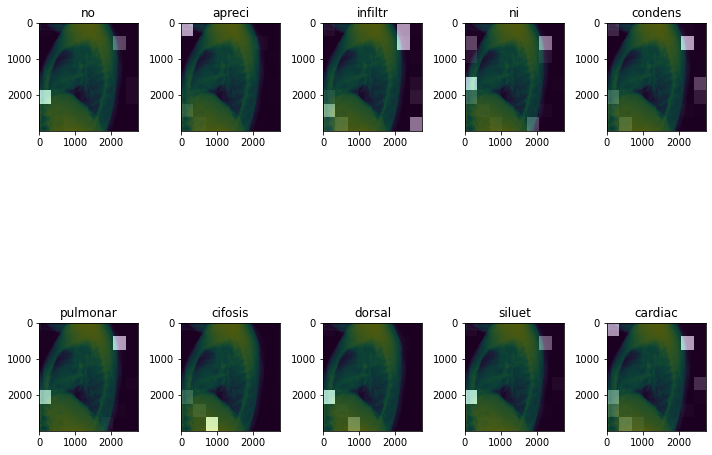

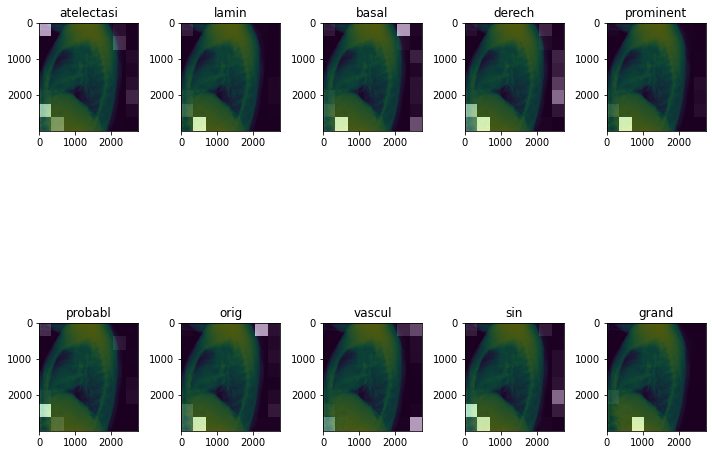

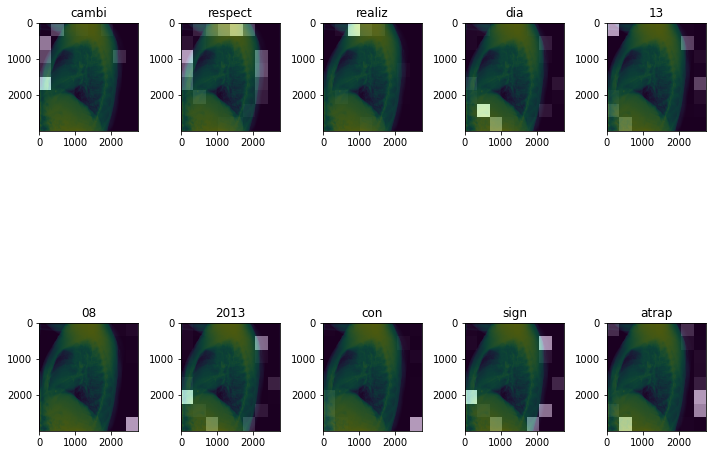

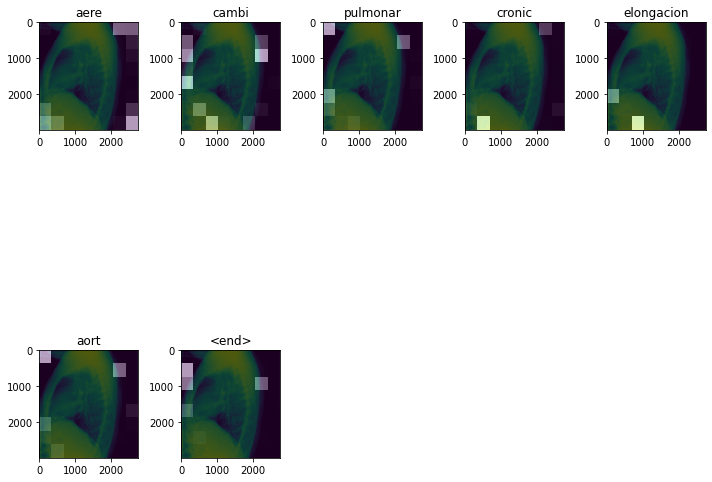

Real Caption: Translated(src=ca, dest=en, text=<Start> Cambi sign with chronic lung hyperinflation parenqui probably dare call arco costal fractures 6o Derech sign spondylosis column included study <end>, pronunciation=<Start> Cambi sign with chronic lung hyperinflation parenqui probably dare call arco costal fractures 6o Derech sign spondylosis column included study <end>, extra_data="{'translat...")
Prediction Caption: Hili prominent probable vascular radiology rest hallazg sin relevant <end>


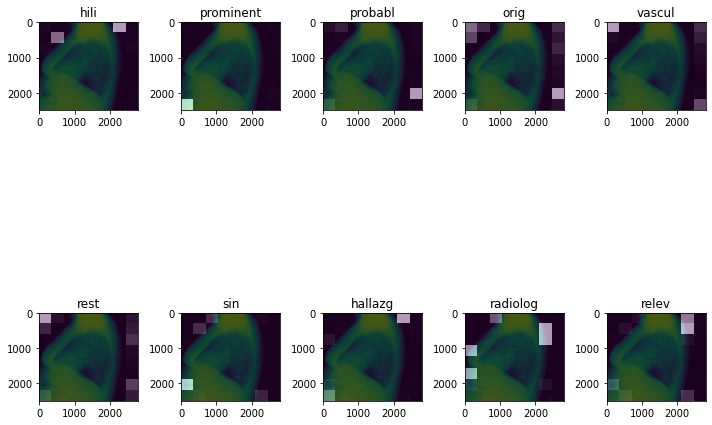

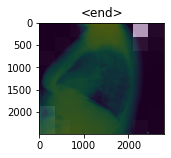

Real Caption: Translated(src=ca, dest=en, text=<Start> comp preliminary study with 05 FECH 04,215 infiltrated resolution appreciation LSI current study does not visualize pulmonary infiltrates or CONDENS <end>, pronunciation=<Start> comp preliminary study with 05 FECH 04,215 infiltrated resolution appreciation LSI current study does not visualize pulmonary infiltrates or CONDENS <end>, extra_data="{'translat...")
Prediction Caption: comp <end>


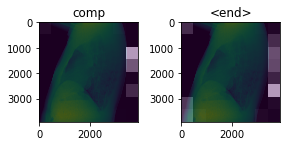

Real Caption: Translated(src=ca, dest=en, text=<Start> sin hallazg meanings pathology <end>, pronunciation=<Start> sin hallazg meanings pathology <end>, extra_data="{'translat...")
Prediction Caption: hallazg sin <end>


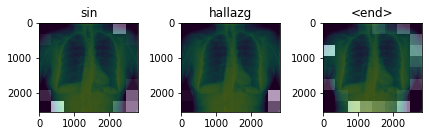

Real Caption: Translated(src=ca, dest=en, text=<Start> unsigned enfermed metastas current study without prior study Cambi respect FECH 18 05 2012 <end>, pronunciation=<Start> unsigned enfermed metastas current study without prior study Cambi respect FECH 18 05 2012 <end>, extra_data="{'translat...")
Prediction Caption: Hili prominent sign radiology COPD probable vascular bilateral gynecomastia sin hallazg relevant <end>


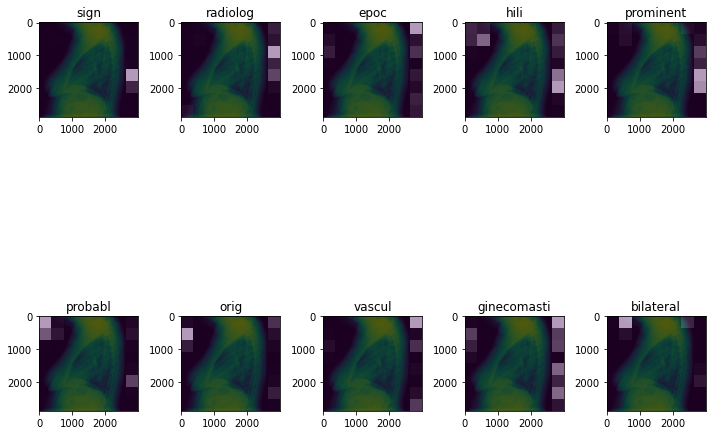

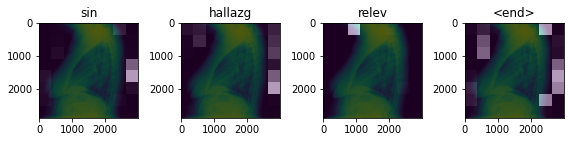

Real Caption: Translated(src=ca, dest=en, text=<Start> cardiomegaly Hili prominent vascular etiology wholesale cisural patron interstitial infrahili Derech icc value <end>, pronunciation=<Start> cardiomegaly Hili prominent vascular etiology wholesale cisural patron interstitial infrahili Derech icc value <end>, extra_data="{'translat...")
Prediction Caption: Hili prominent vascular likely left Relevant sen costofren <end>


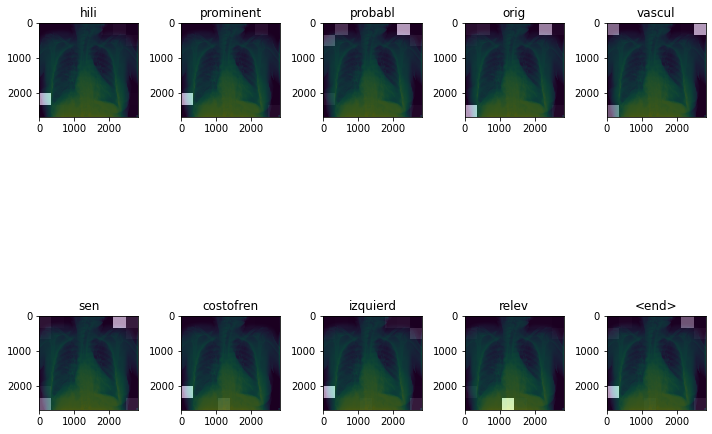

Real Caption: Translated(src=ca, dest=en, text=<Start> Mapping fractures but did not observe clear hallazg relevant <end>, pronunciation=<Start> Mapping fractures but did not observe clear hallazg relevant <end>, extra_data="{'translat...")
Prediction Caption: Radiology inter hallazg sin nor Cambi respect previous study <end>


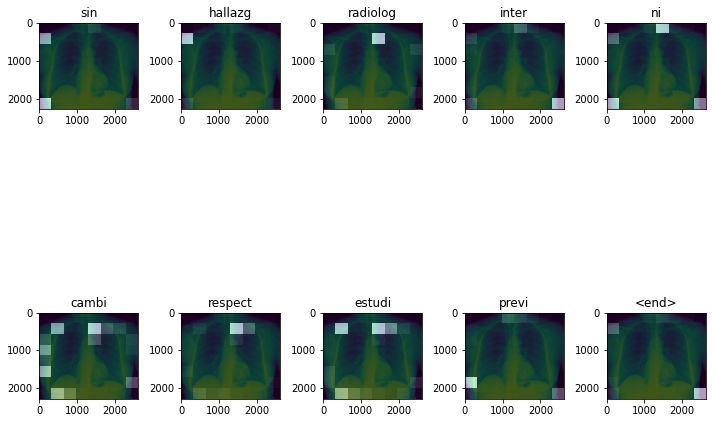

Real Caption: Translated(src=ca, dest=en, text=<Start> mamil field project elongations lower aorta costal horizontalizacion sin hallazg radiology or inter Cambi respect previous study 26 10 16 <end>, pronunciation=<Start> mamil field project elongations lower aorta costal horizontalizacion sin hallazg radiology or inter Cambi respect previous study 26 10 16 <end>, extra_data="{'translat...")
Prediction Caption: Radiology sign COPD <end>


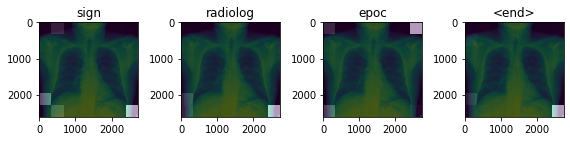

Real Caption: Translated(src=ca, dest=en, text=<Start> unsigned Chokes no appreciation appreciation lin lin no fracture fractured breastbone <end>, pronunciation=<Start> unsigned Chokes no appreciation appreciation lin lin no fracture fractured breastbone <end>, extra_data="{'translat...")
Prediction Caption: Identifies no sin imagen vs chronic pulmonary infiltrates field Cambi no previous study with respect comp <end>


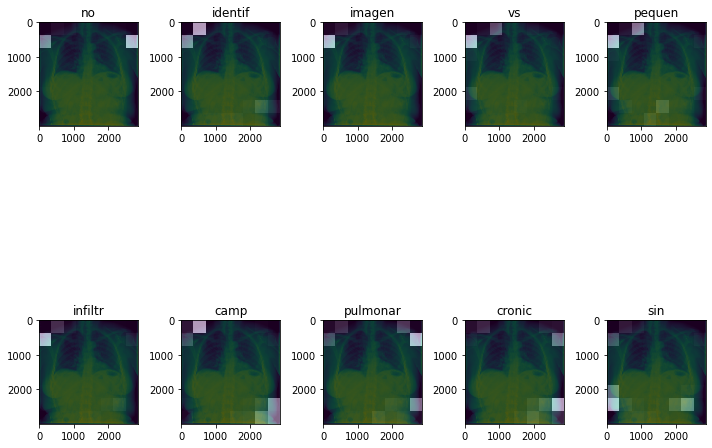

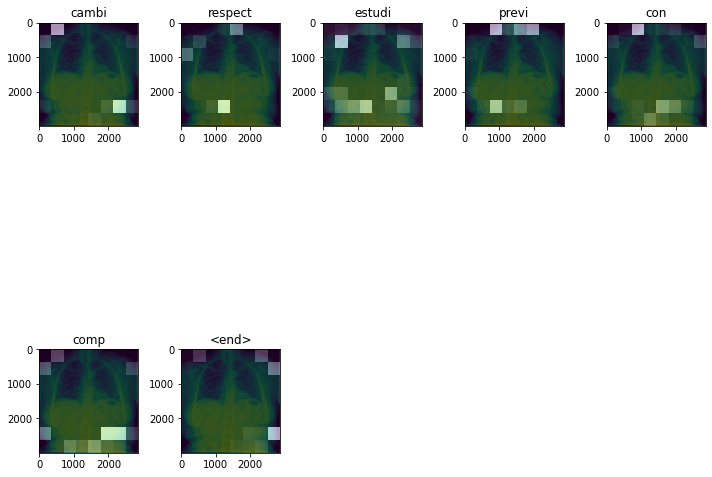

Real Caption: Translated(src=ca, dest=en, text=<Start> elevation frame framework hypoventilation bibasal Derech lung atelectasis with congestive Hili lm <end>, pronunciation=<Start> elevation frame framework hypoventilation bibasal Derech lung atelectasis with congestive Hili lm <end>, extra_data="{'translat...")
Prediction Caption: no appreciation infiltrate or CONDENS elongations aortic Hili prominent vascular no appreciation infiltrate or CONDENS elongations aortic Hili prominent vascular no appreciation infiltrate or CONDENS elongations aortic Hili prominent vascular no appreciation infiltrate or CONDENS elongations aortic Hili prominent vascular no appreciation infiltrate or CONDENS elongations Hili prominent aortic vascular infiltrate or no appreciation CONDENS elongations prominent aortic vascular Hili


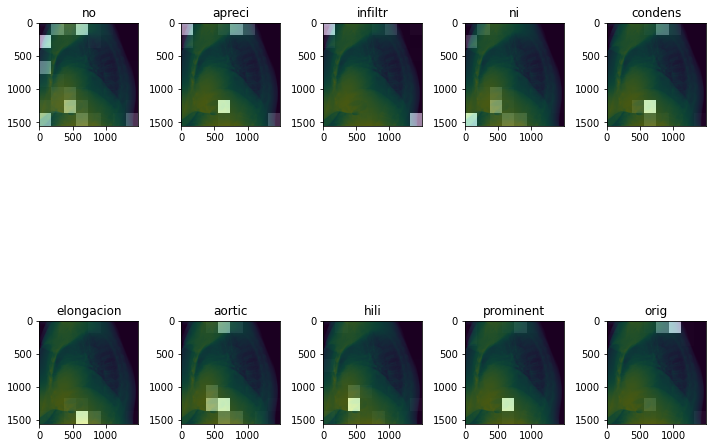

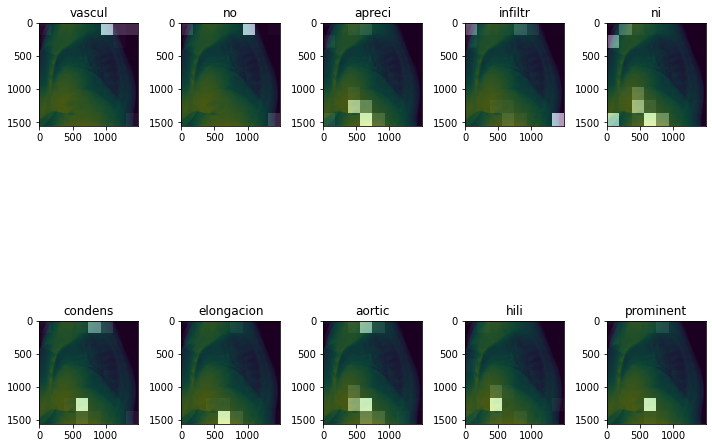

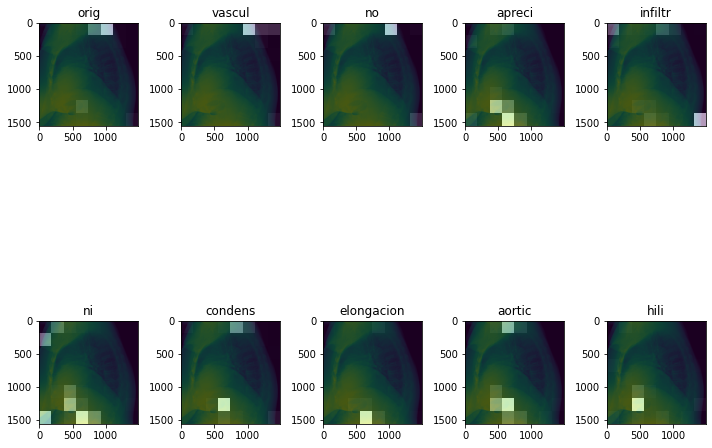

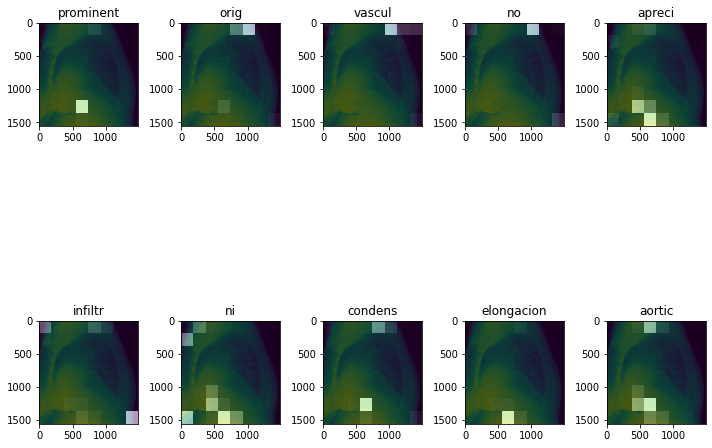

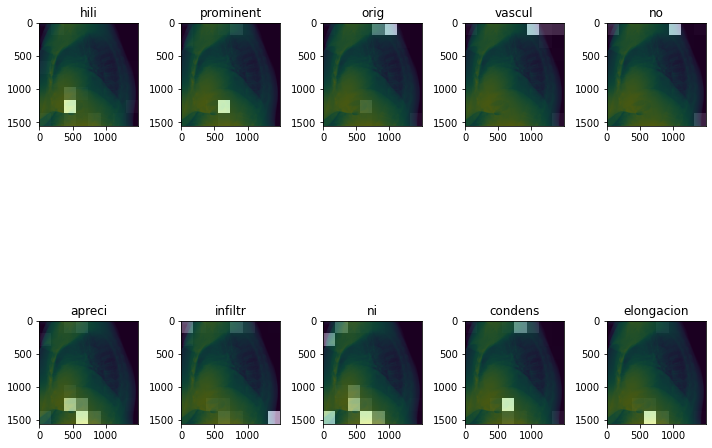

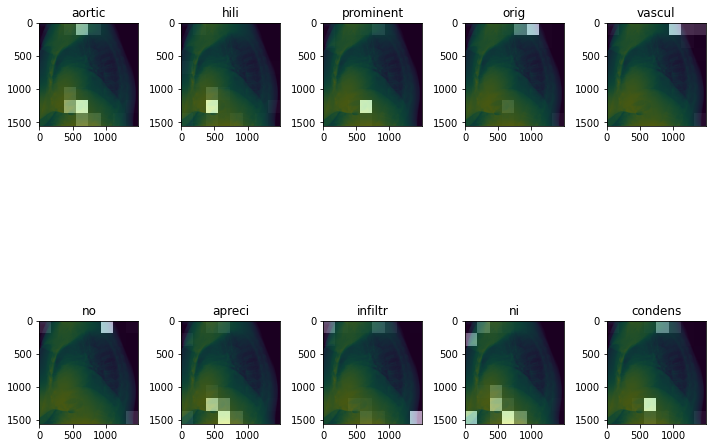

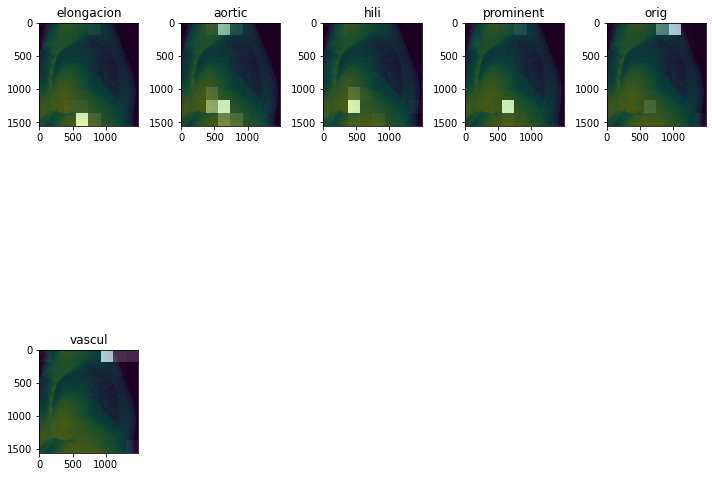

Real Caption: Translated(src=ca, dest=en, text=<Start> Cambi sin <end>, pronunciation=<Start> Cambi sin <end>, extra_data="{'translat...")
Prediction Caption: comp <end>


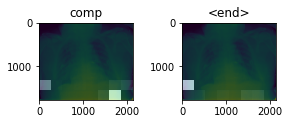

Real Caption: Translated(src=ca, dest=en, text=<Start> sign trapped aere sin sin hallazg relevant previous study Cambi respect ano 2012 con comp <end>, pronunciation=<Start> sign trapped aere sin sin hallazg relevant previous study Cambi respect ano 2012 con comp <end>, extra_data="{'translat...")
Prediction Caption: Objective imagen no means alter <end>


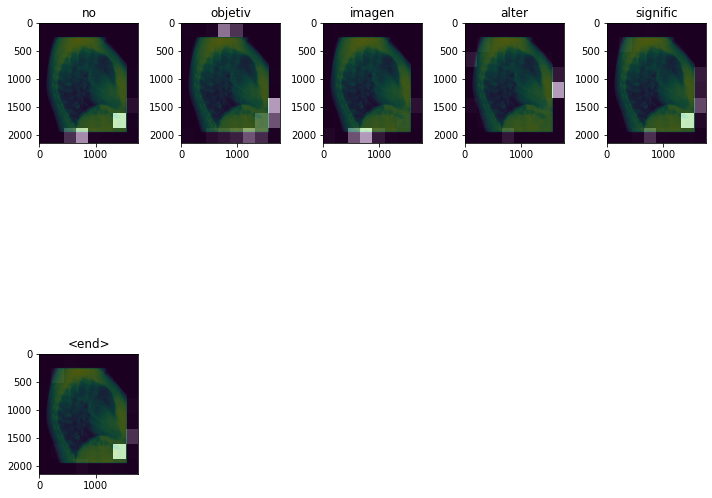

Real Caption: Translated(src=ca, dest=en, text=<Start> sin means hallazg dorsal scoliosis <end>, pronunciation=<Start> sin means hallazg dorsal scoliosis <end>, extra_data="{'translat...")
Prediction Caption: not dat contraindicated surgery infiltrated lingul angular costofren Derech not dat contraindicated surgery infiltrated lingul angular costofren Derech not dat contraindicated surgery infiltrated lingul angular costofren Derech not dat contraindicated surgery infiltrated lingul angular costofren Derech not dat contraindicated surgery infiltrated lingul angular costofren Derech not dat contraindicated surgery infiltrated lingul angular costofren Derech not contraindicate surgery dat infiltrated lingul angular costofren dat Derech not contraindicated


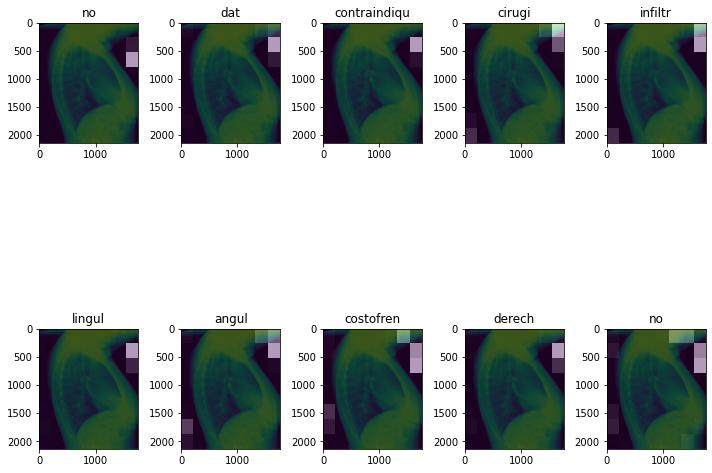

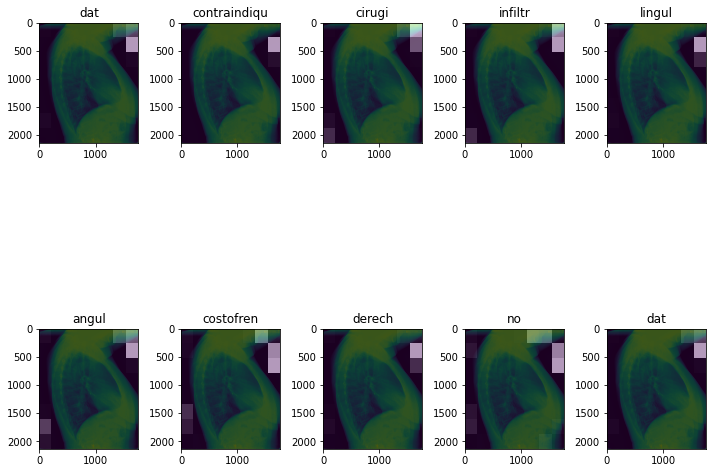

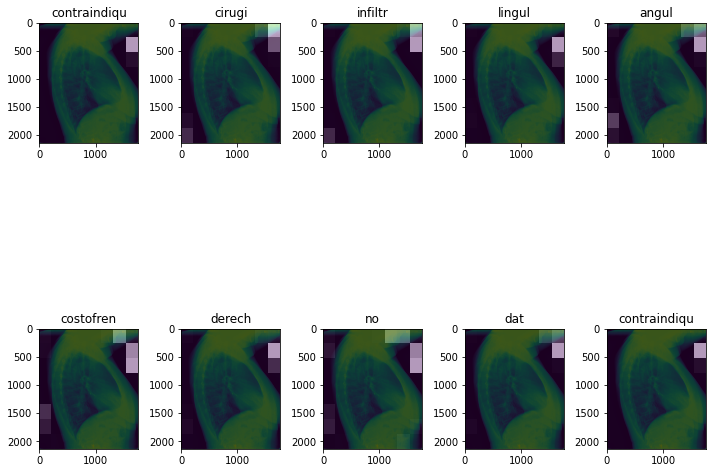

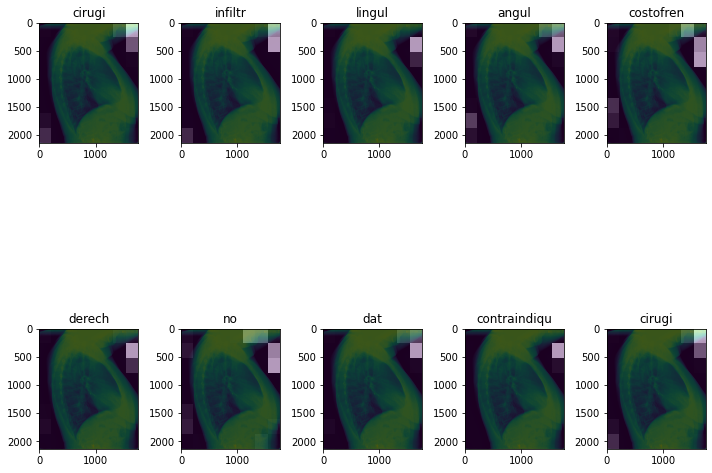

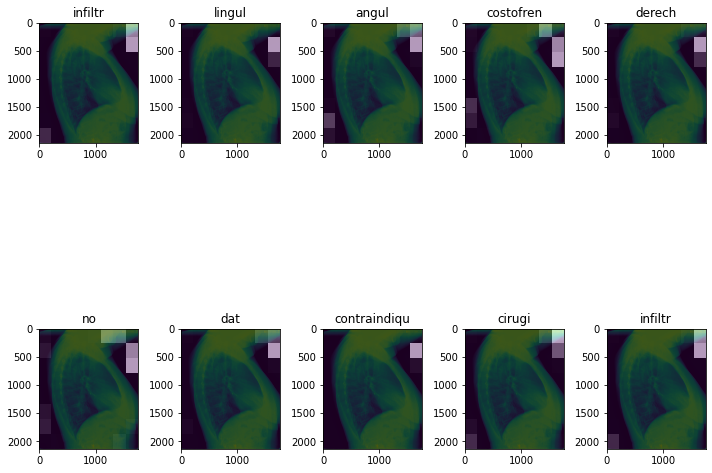

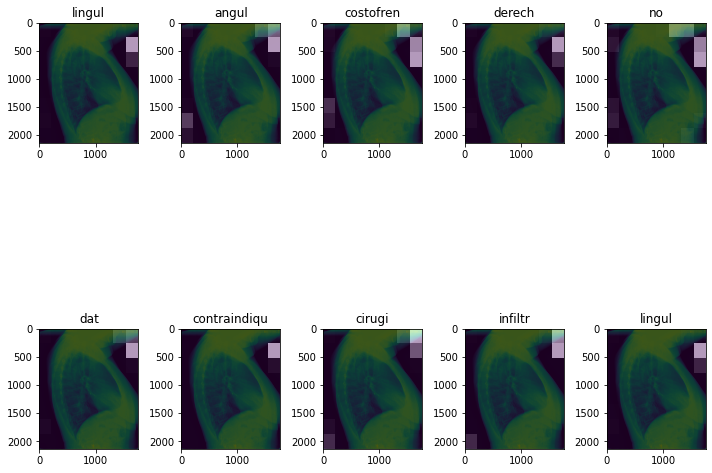

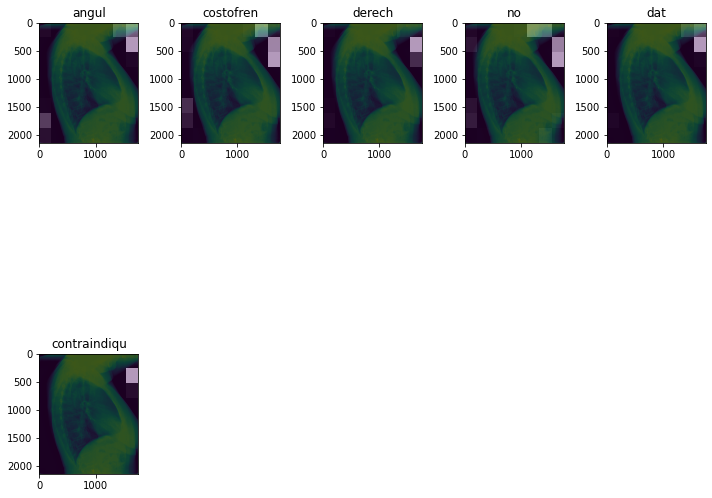

Real Caption: Translated(src=ca, dest=en, text=<Start> acig lobe variant Liger normal lumbar scoliosis <end>, pronunciation=<Start> acig lobe variant Liger normal lumbar scoliosis <end>, extra_data="{'translat...")
Prediction Caption: unobvious enfermed lung Derech not observing enfermed lungs or CONDENS pulmonary unobserved enfermed lungs or CONDENS pulmonary unobserved enfermed lungs or CONDENS pulmonary unobserved enfermed lungs or CONDENS pulmonary unobserved enfermed lungs or CONDENS pulmonary unobserved enfermed lungs or CONDENS pulmonary unobserved enfermed CONDENS lung or pulmonary lung enfermed not observing or not observing CONDENS pulmonary or lung enfermed


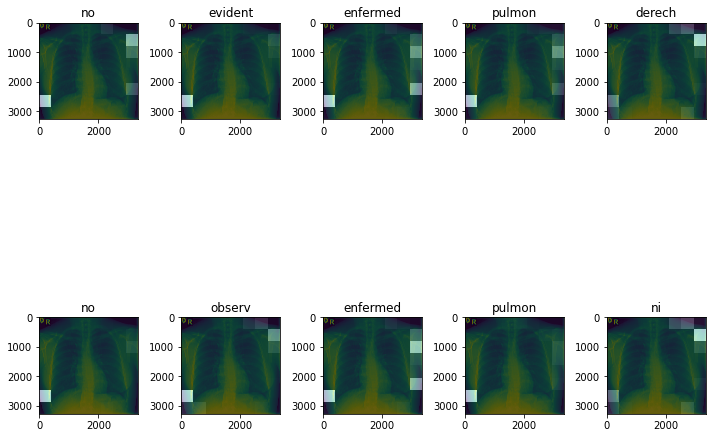

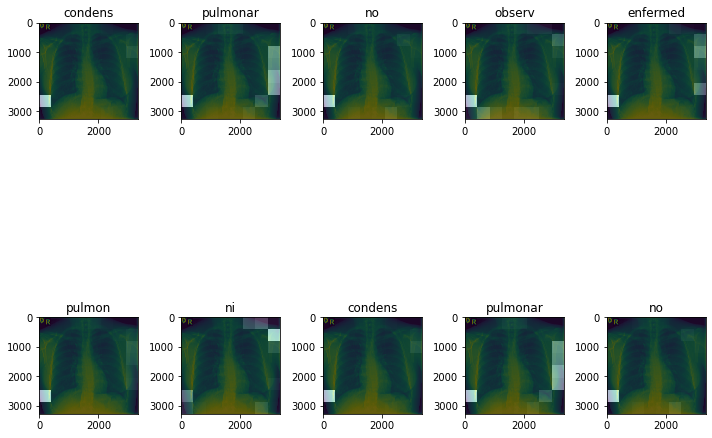

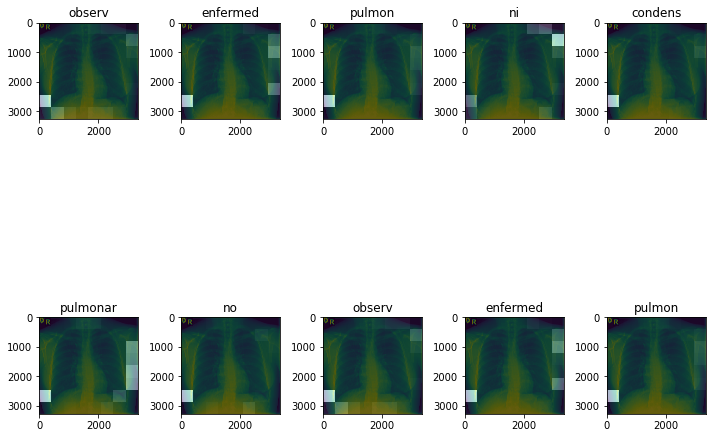

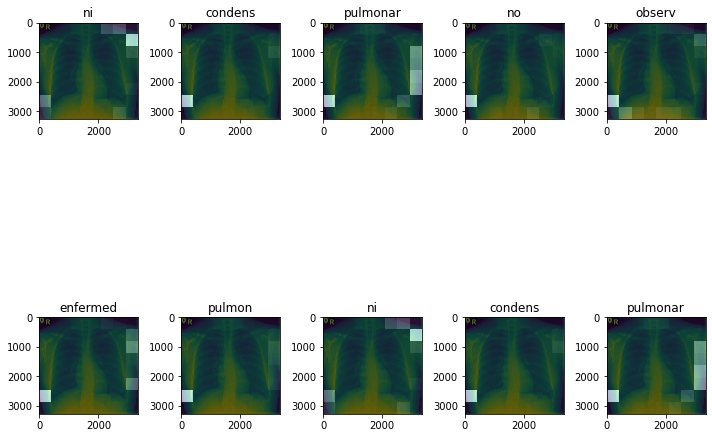

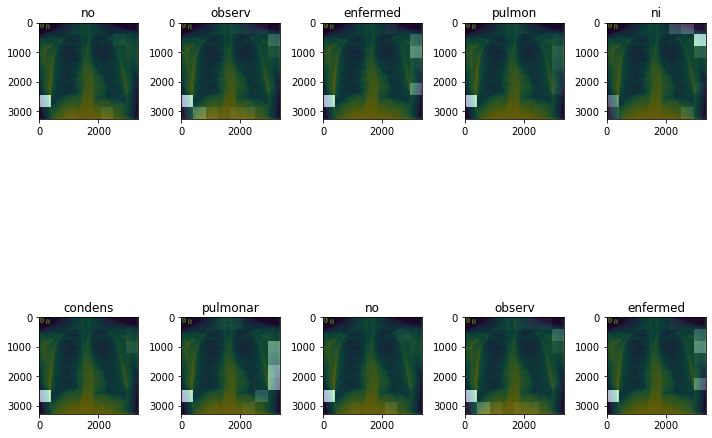

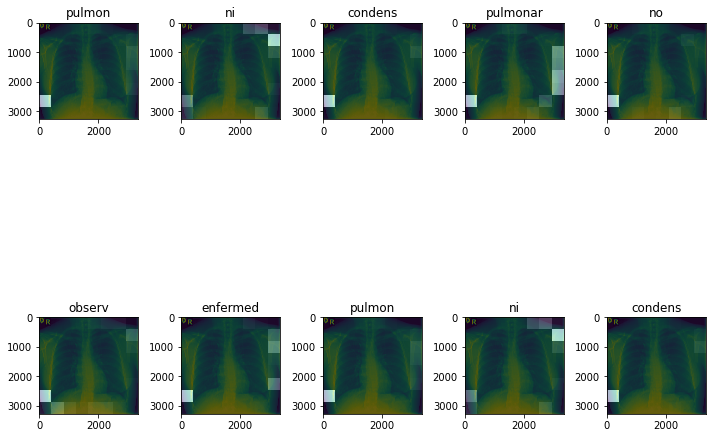

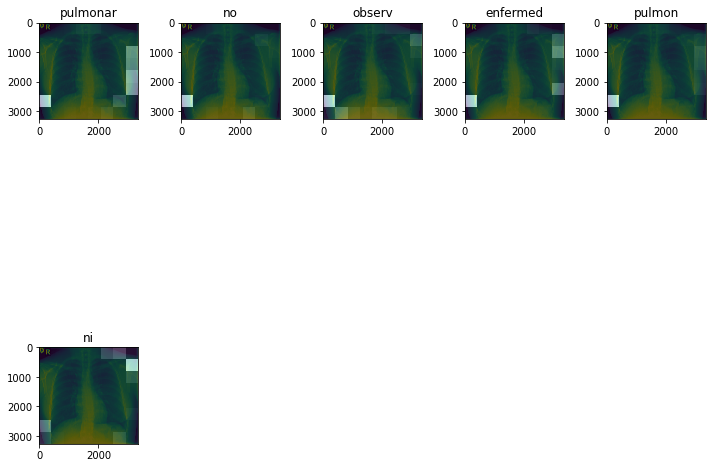

Real Caption: Translated(src=ca, dest=en, text=<Start> indic cardiothorac it sells increasing cavity right hallazgo sin sin means Cambi respect relevant prior noviembr 2015 <end>, pronunciation=<Start> indic cardiothorac it sells increasing cavity right hallazgo sin sin means Cambi respect relevant prior noviembr 2015 <end>, extra_data="{'translat...")
Prediction Caption: Radiology sign with COPD catch aere pinzamient sen costofren Derech sin hallazg relevant <end>


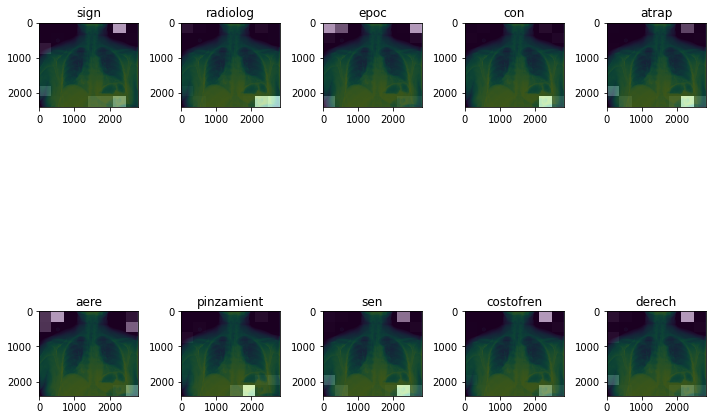

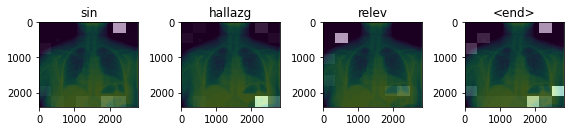

Real Caption: Translated(src=ca, dest=en, text=<Start> densidad Cambi pseudonodular bilateral sin with previous studies with respect Compar 2013 <end>, pronunciation=<Start> densidad Cambi pseudonodular bilateral sin with previous studies with respect Compar 2013 <end>, extra_data="{'translat...")
Prediction Caption: sign radiology two lymph calcified Derech sign radiology two lymph calcified Derech sign radiology two lymph calcified Derech sign radiology two lymph calcified Derech sign radiology two lymph calcified Derech sign radiology two lymph calcified Derech sign radiology two lymph calcified Derech sign radiology two lymph calcified Derech sign Radiology two calcified lymph Derech Derech calcified lymph sign two radiology radiology sign two calcified lymph Derech


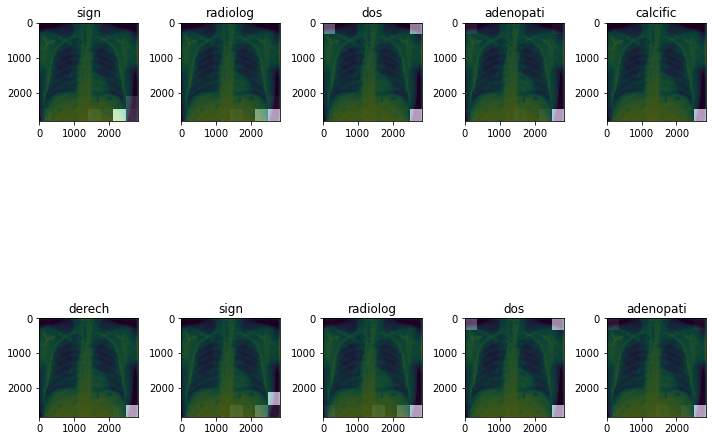

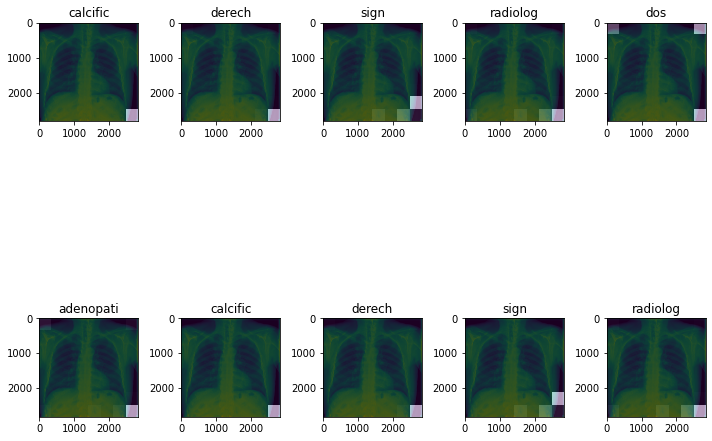

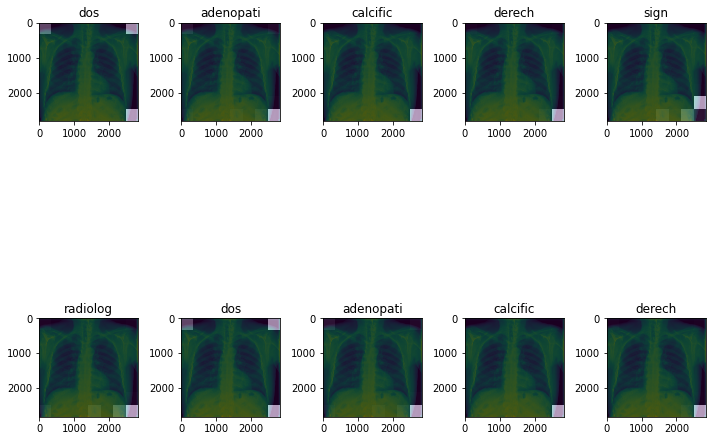

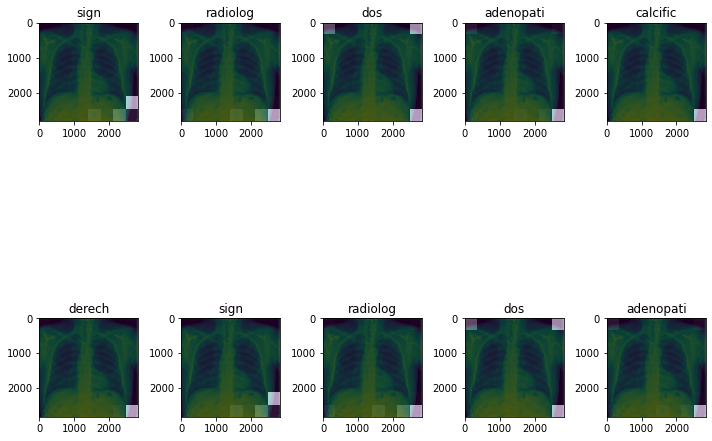

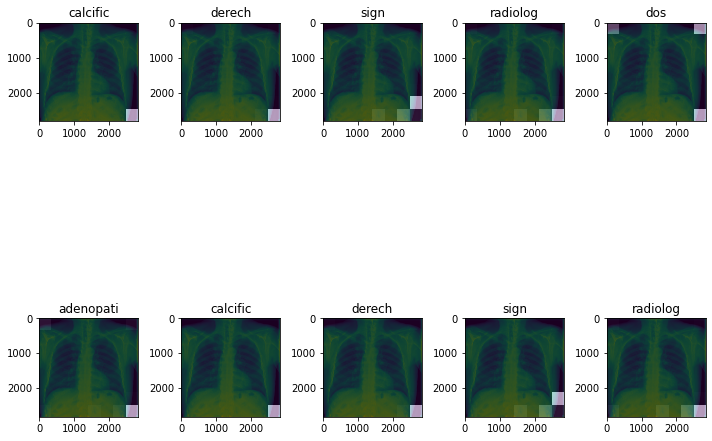

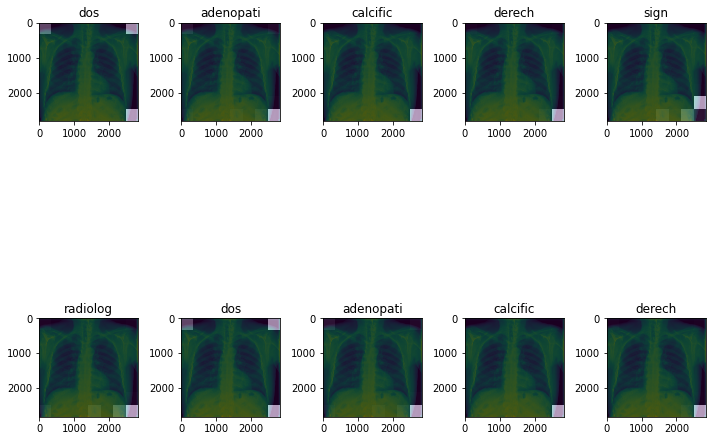

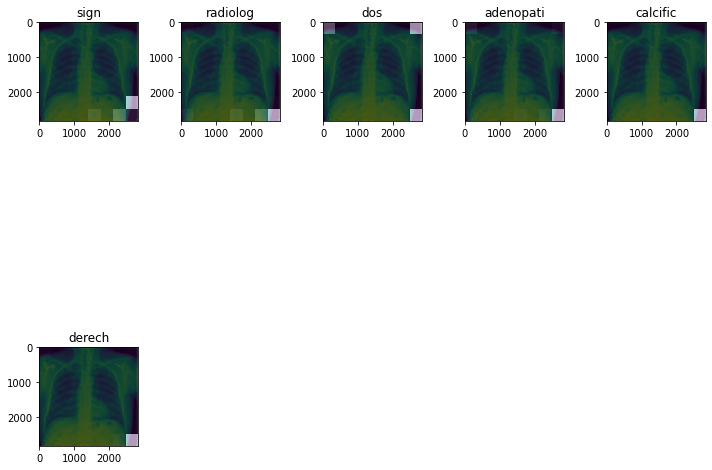

Real Caption: Translated(src=ca, dest=en, text=<Start> pacemaker tricameral increased broncovascul lid section <end>, pronunciation=<Start> pacemaker tricameral increased broncovascul lid section <end>, extra_data="{'translat...")
Prediction Caption: comp with previous study FECH 25 06 2015 <end>


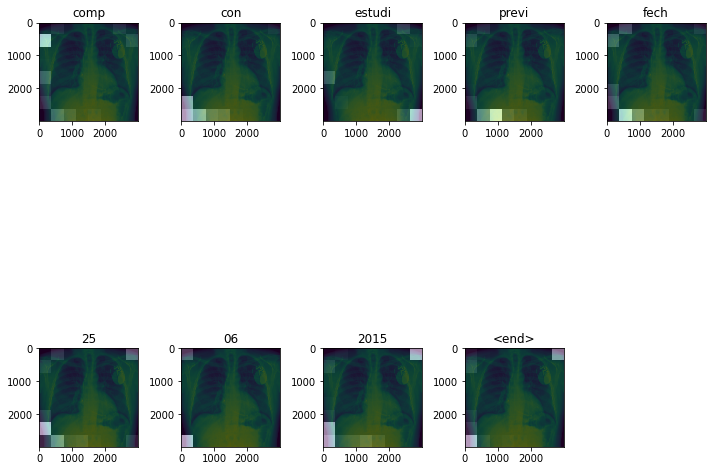

Real Caption: Translated(src=ca, dest=en, text=<Start> hallazg sin sin Cambi relevant previous study with respect comp FECH 15 12 15 <end>, pronunciation=<Start> hallazg sin sin Cambi relevant previous study with respect comp FECH 15 12 15 <end>, extra_data="{'translat...")
Prediction Caption: Hili prominent probable vascular indic cardiotorac upper limit normal Hili prominent probable vascular indic cardiotorac upper limit normal Hili prominent probable vascular indic cardiotorac upper limit normal Hili prominent probable vascular indic cardiotorac upper limit normal Hili prominent probable vascular indic cardiotorac upper limit normal Hili prominent vascular indic cardiotorac probable upper limit normal Hili prominent probable vascular indic


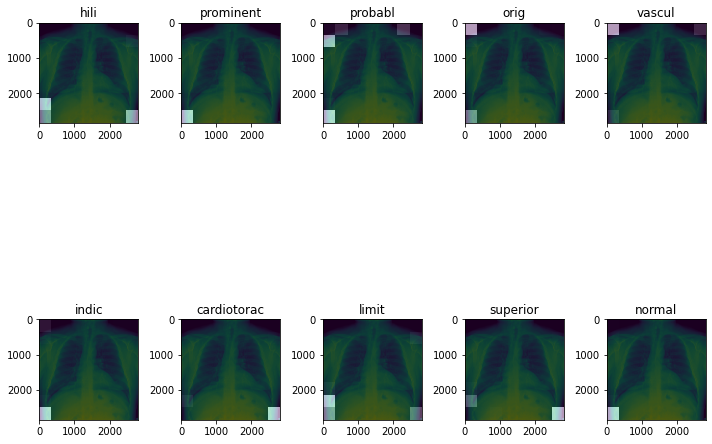

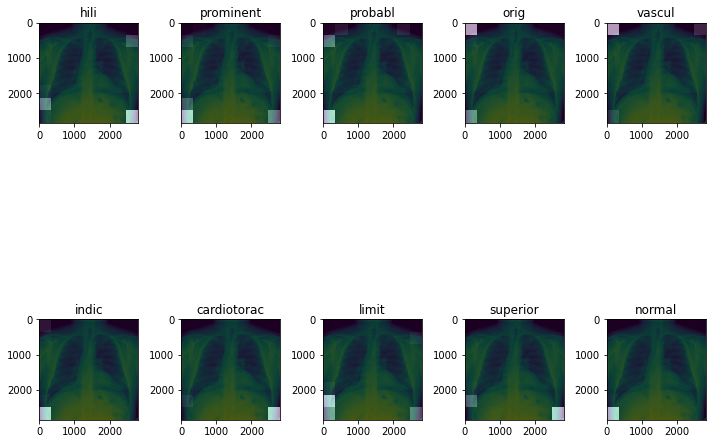

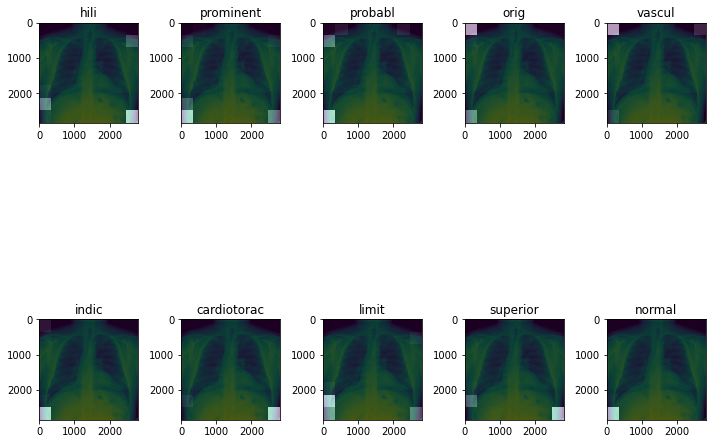

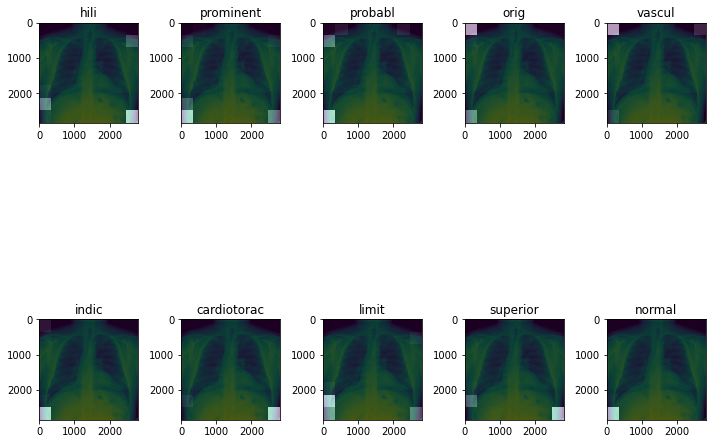

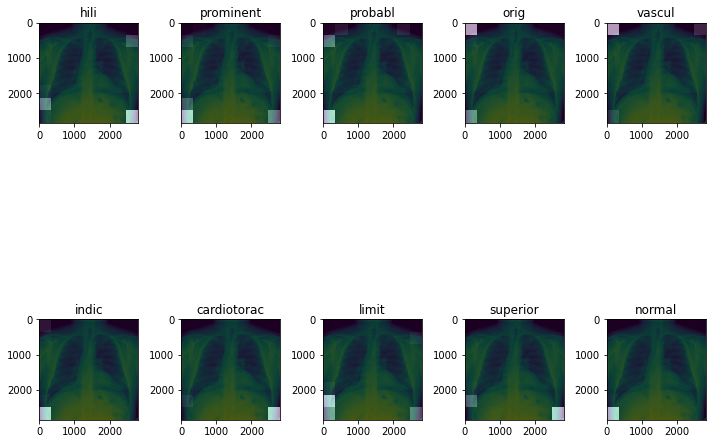

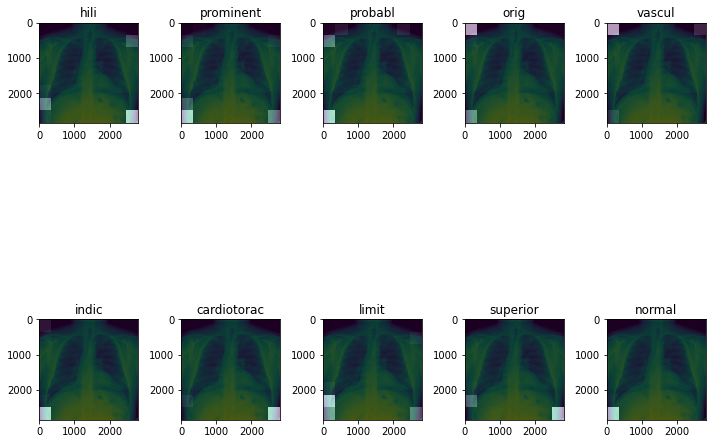

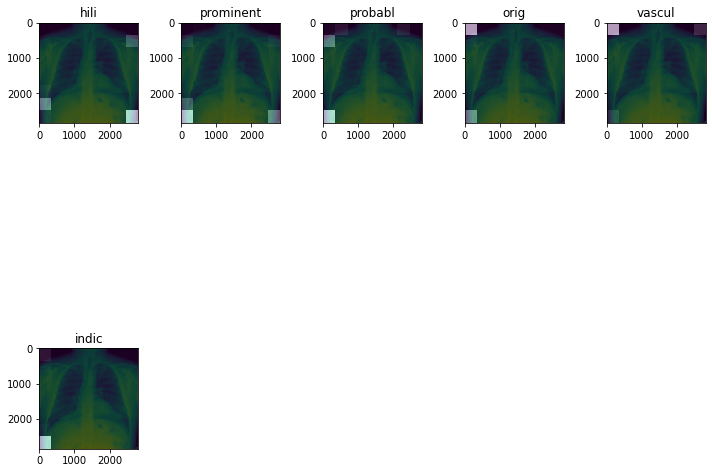

Real Caption: Translated(src=ca, dest=en, text=<Start> hallazg without pathology meaning Liger lumbar spondylosis scoliosis dorsal <end>, pronunciation=<Start> hallazg without pathology meaning Liger lumbar spondylosis scoliosis dorsal <end>, extra_data="{'translat...")
Prediction Caption: wholesale pleuroapical left <end>


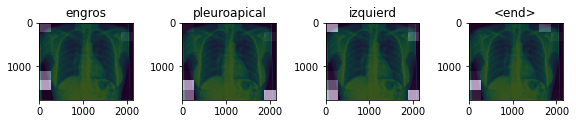

Real Caption: Translated(src=ca, dest=en, text=<Start> Beijing atelectasis subsegmentari sen costofren <end>, pronunciation=<Start> Beijing atelectasis subsegmentari sen costofren <end>, extra_data="{'translat...")
Prediction Caption: Relevant sin hallazg <end>


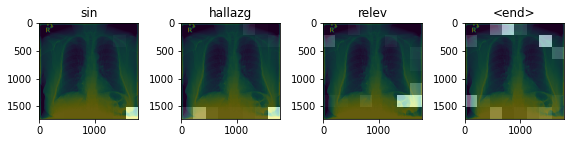

Real Caption: Translated(src=ca, dest=en, text=<Start> parenquim lung Silhouette cardiomediastin Dentro normal dorsal kyphosis Liger Liger Acuña cuerpo con Baj Baj dorsal <end>, pronunciation=<Start> parenquim lung Silhouette cardiomediastin Dentro normal dorsal kyphosis Liger Liger Acuña cuerpo con Baj Baj dorsal <end>, extra_data="{'translat...")
Prediction Caption: paremquim motif consult smoker lung indic cardiotorac no means alter <end>


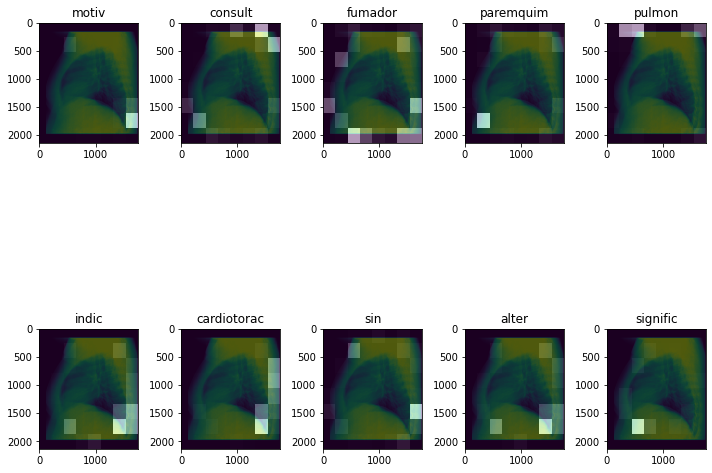

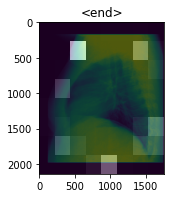

Real Caption: Translated(src=ca, dest=en, text=<Start> Cambi chronic pulmonary interstitial pattern does not change with respect previous study pinzamient ambos sen costofren cardiomegaly ascending descending aortic dilation condition mediastinal widening <end>, pronunciation=<Start> Cambi chronic pulmonary interstitial pattern does not change with respect previous study pinzamient ambos sen costofren cardiomegaly ascending descending aortic dilation condition mediastinal widening <end>, extra_data="{'translat...")
Prediction Caption: patron interstitial bilateral predominantly low lung Derech with pattern interstitial bilateral predominantly low lung Derech with pattern interstitial bilateral predominantly low lung Derech with pattern interstitial bilateral predominantly low lung Derech with pattern interstitial bilateral predominantly low lung Derech with pattern interstitial bilateral predominantly low lung Derech with pattern interstitial Derech low prevalence bilateral lungs with 

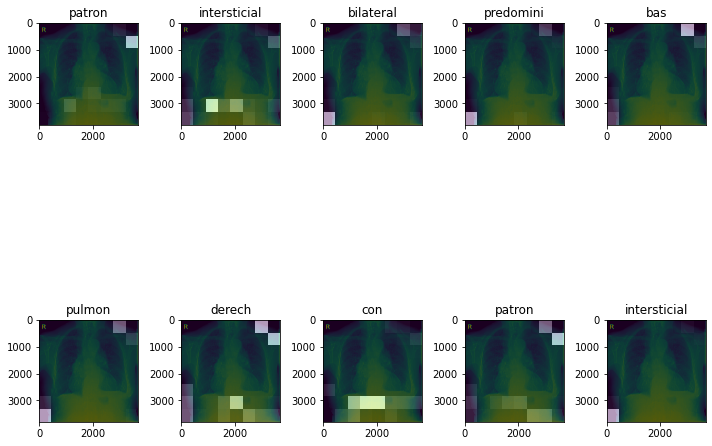

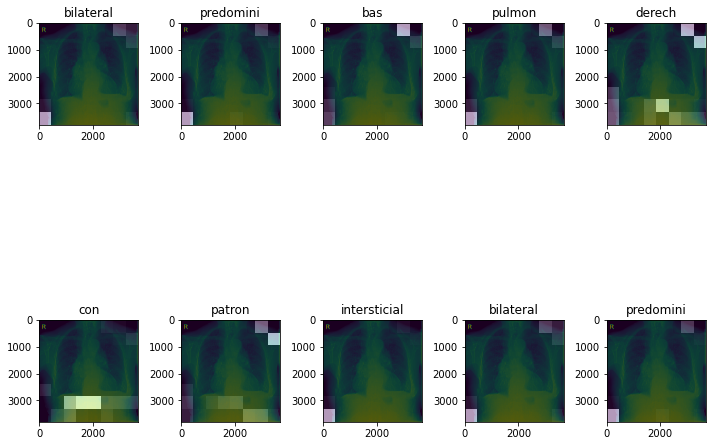

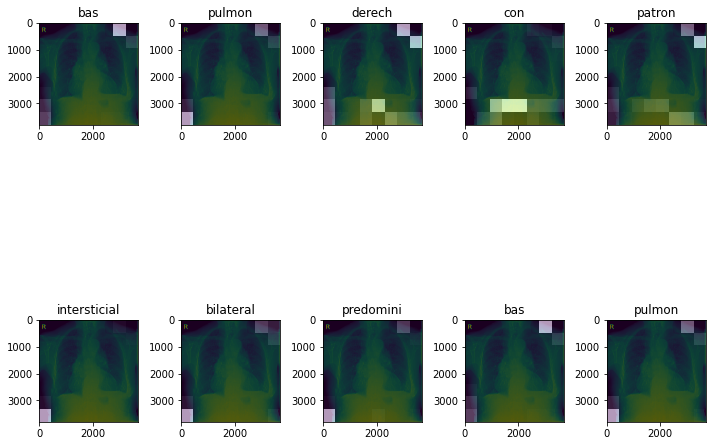

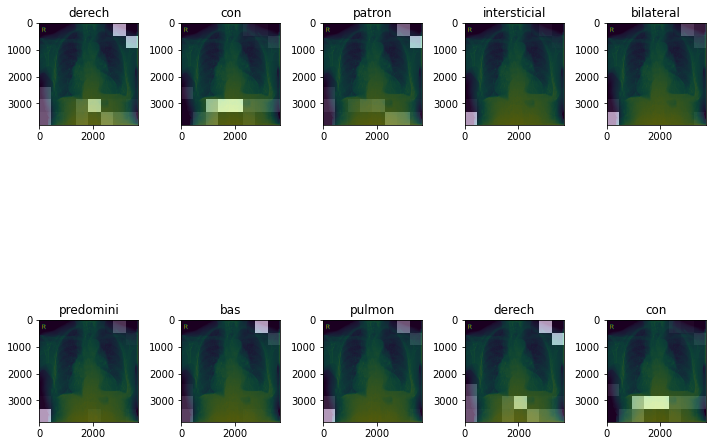

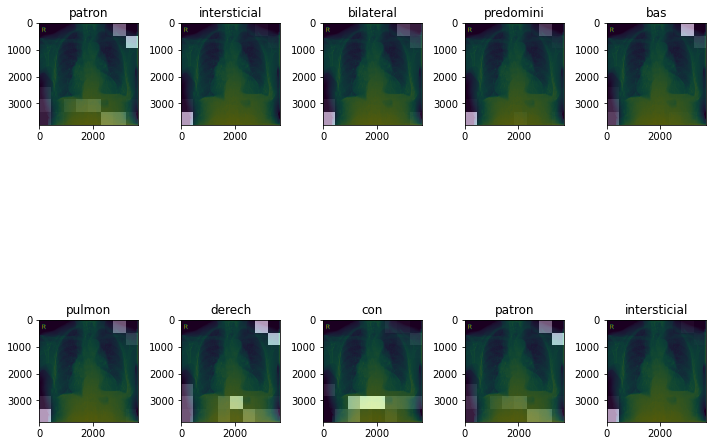

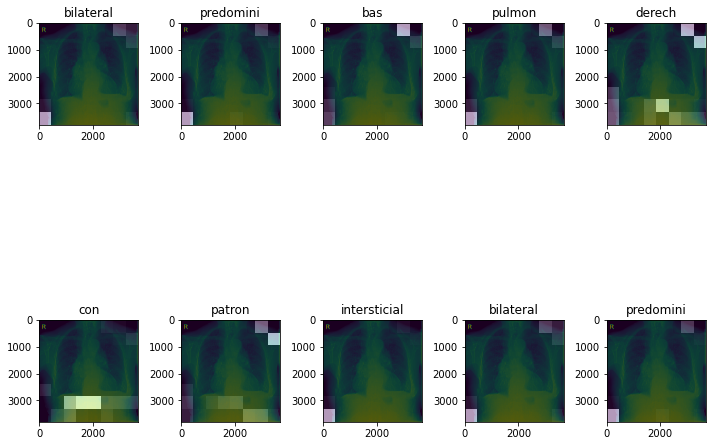

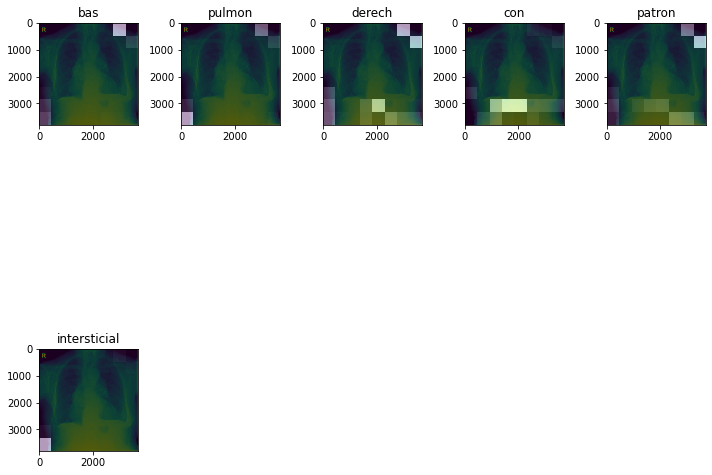

Real Caption: Translated(src=ca, dest=en, text=<Start> Cambi chronic pulmonary interstitial pattern does not change with respect previous study pinzamient ambos sen costofren cardiomegaly ascending descending aortic dilation condition mediastinal widening <end>, pronunciation=<Start> Cambi chronic pulmonary interstitial pattern does not change with respect previous study pinzamient ambos sen costofren cardiomegaly ascending descending aortic dilation condition mediastinal widening <end>, extra_data="{'translat...")
Prediction Caption: patron interstitial bilateral predominantly low lung Derech with pattern interstitial bilateral predominantly low lung Derech with pattern interstitial bilateral predominantly low lung Derech with pattern interstitial bilateral predominantly low lung Derech with pattern interstitial bilateral predominantly low lung Derech with pattern interstitial bilateral predominantly low lung Derech with pattern interstitial Derech low prevalence bilateral lungs with 

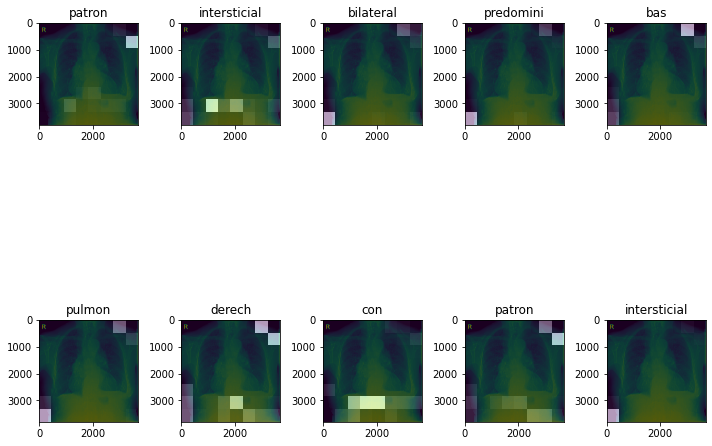

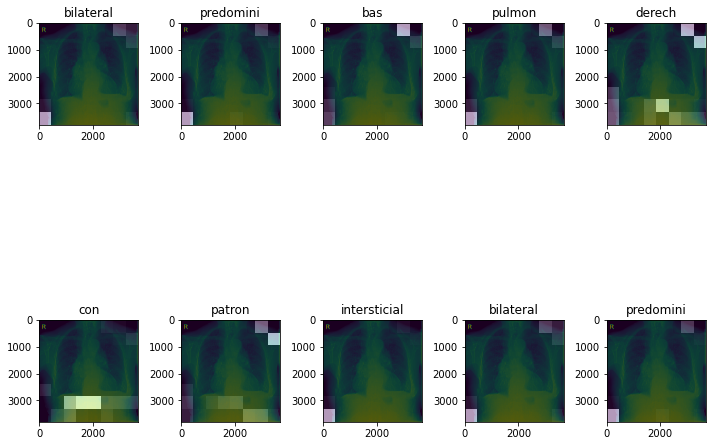

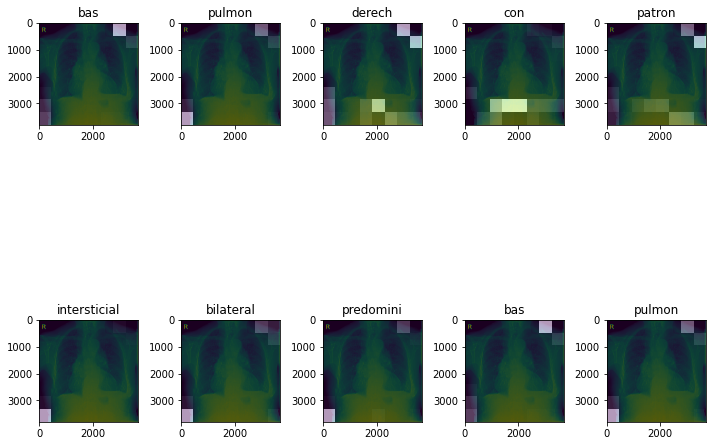

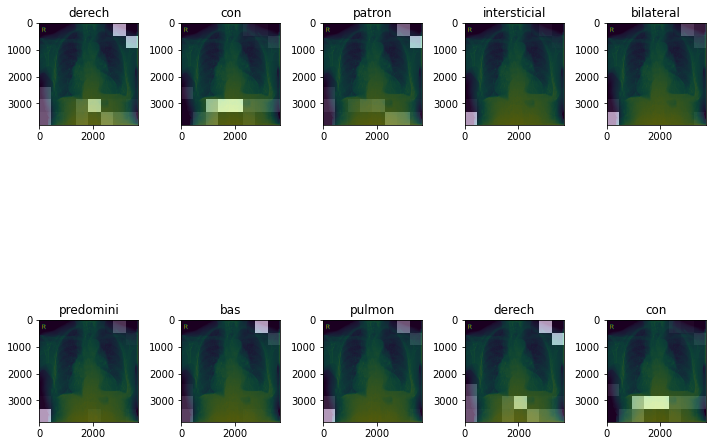

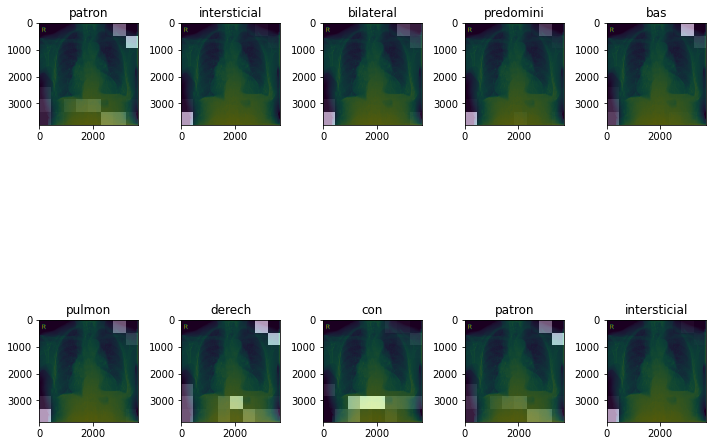

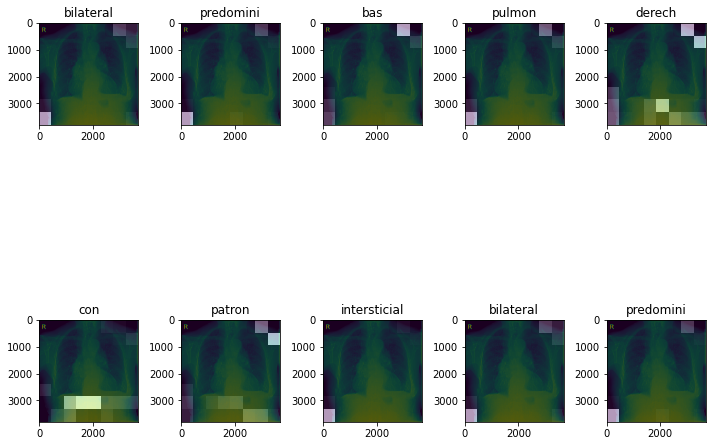

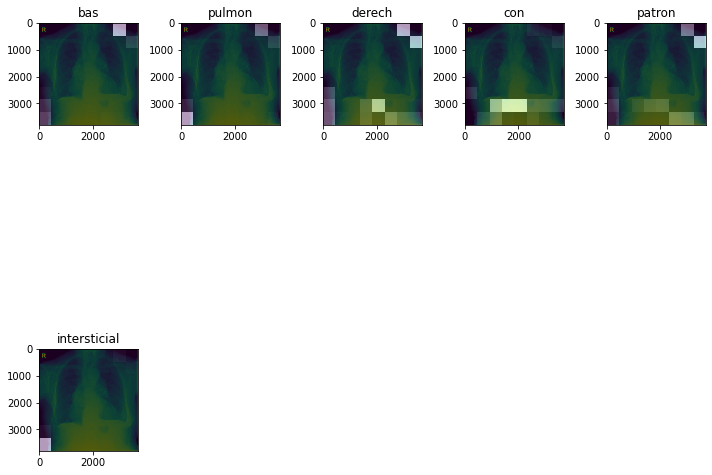

Real Caption: Translated(src=ca, dest=en, text=<Start> CARDI Silhouette Derech disappearance infiltrate normal mediastinum Dentro sen costofren libr imag psuedonodul basal Derech sugest mamil sin hallazg radiology relevant <end>, pronunciation=<Start> CARDI Silhouette Derech disappearance infiltrate normal mediastinum Dentro sen costofren libr imag psuedonodul basal Derech sugest mamil sin hallazg radiology relevant <end>, extra_data="{'translat...")
Prediction Caption: Silhouette CARDI mediastinum Dentro normal sen costofren libr sin hallazg means Pathology catch aere Retrosternal first boundary cease normal sin hallazg means Pathology catch aere Retrosternal first boundary cease normal sin hallazg means Pathology catch aere Retrosternal first boundary cease normal sin hallazg means Pathology catch aere Retrosternal first boundary alto normal means without hallazg pathology catch aere retrosternal first boundary cease normal means without hallazg


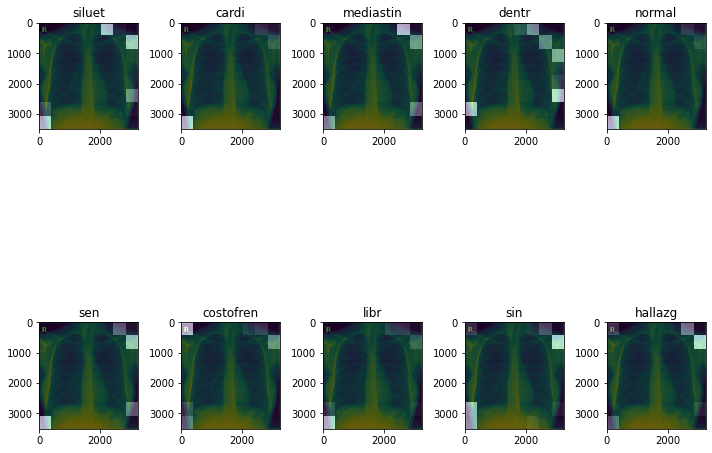

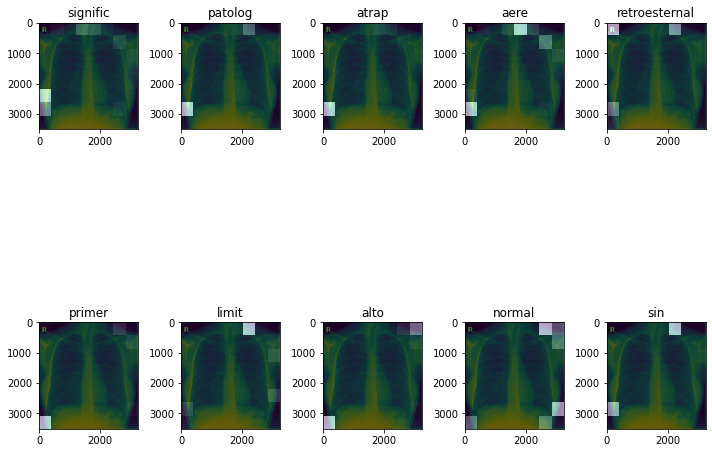

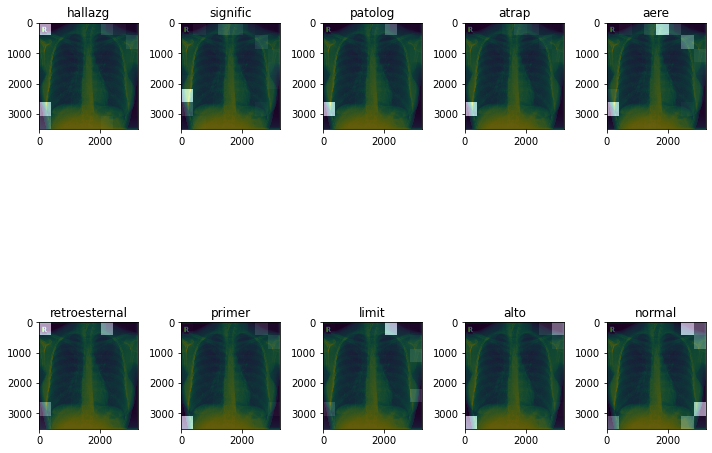

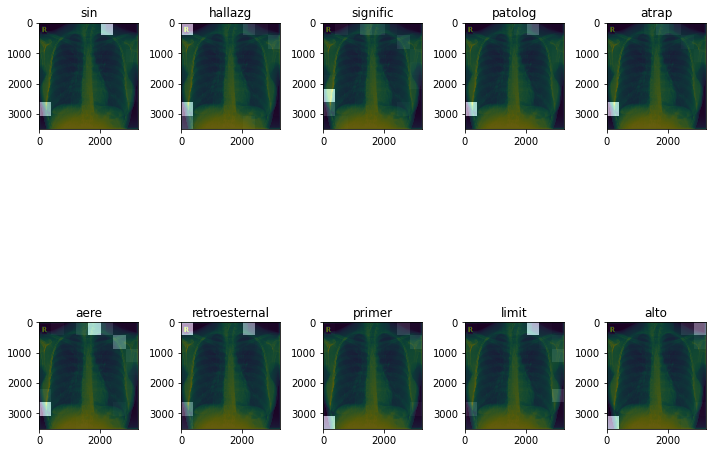

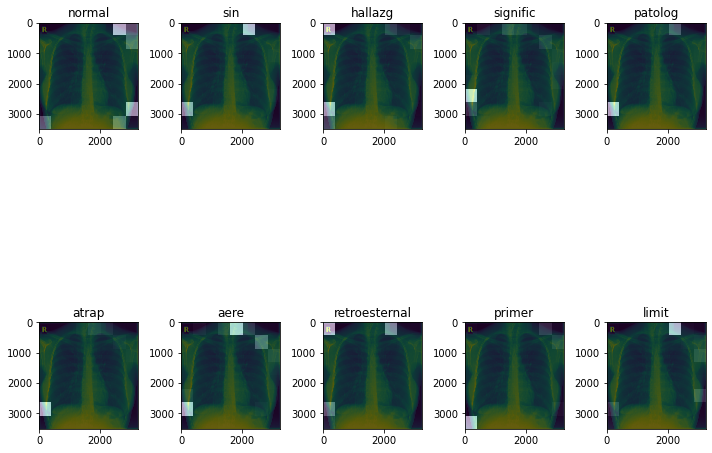

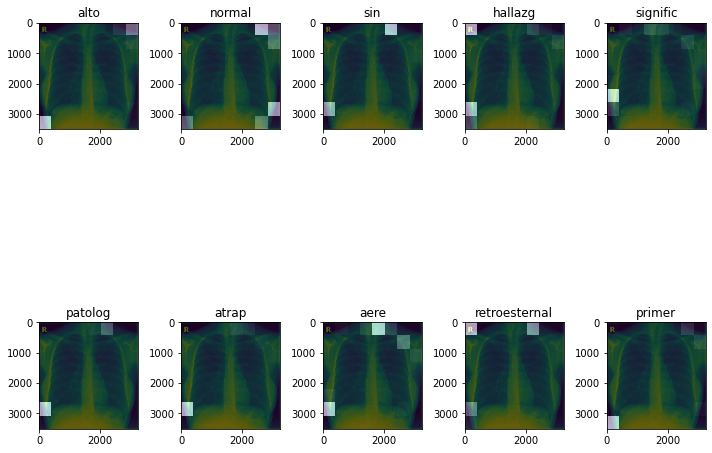

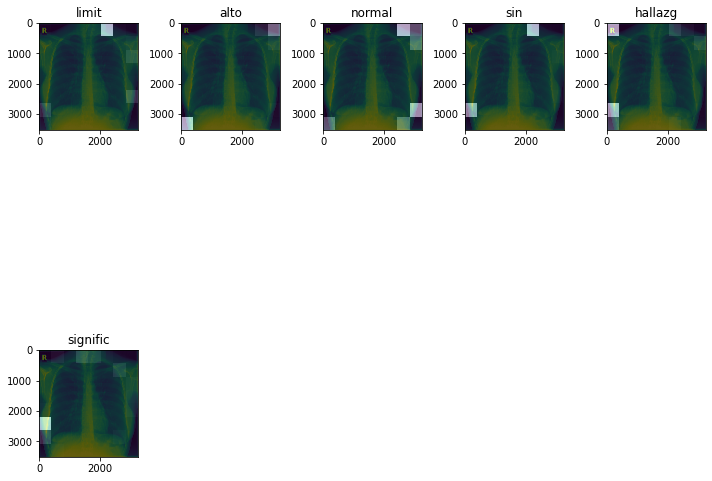

Real Caption: Translated(src=ca, dest=en, text=<Start> Silhouette normal cardiac limit alto sen costofren libr unidentified alter radiology revel <end>, pronunciation=<Start> Silhouette normal cardiac limit alto sen costofren libr unidentified alter radiology revel <end>, extra_data="{'translat...")
Prediction Caption: elongations aortic calcifications elongations aortic Herni hiatus elongations aortic calcifications elongations aortic Herni hiatus elongations aortic calcifications elongations aortic Herni hiatus elongations aortic calcifications elongations aortic Herni hiatus elongations aortic calcifications elongations aortic Herni hiatus elongations aortic calcifications elongations aortic Herni hiatus elongations aortic calcifications elongations aortic Herni hiatus elongations aortic calcifications elongations Herni aortic hiatus elongations aortic calcifications elongations Herni aortic hiatus aortic calcifications elongations


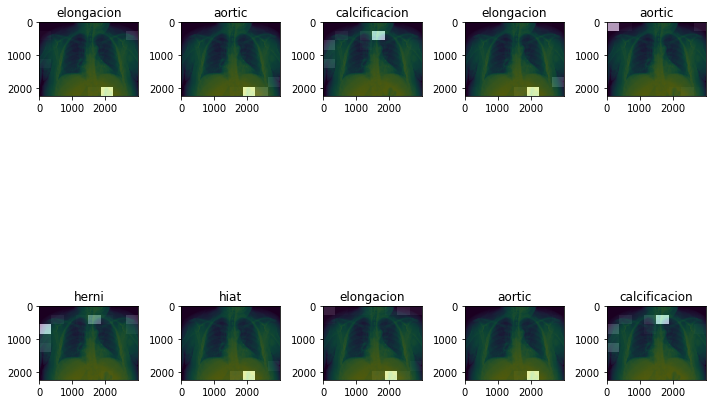

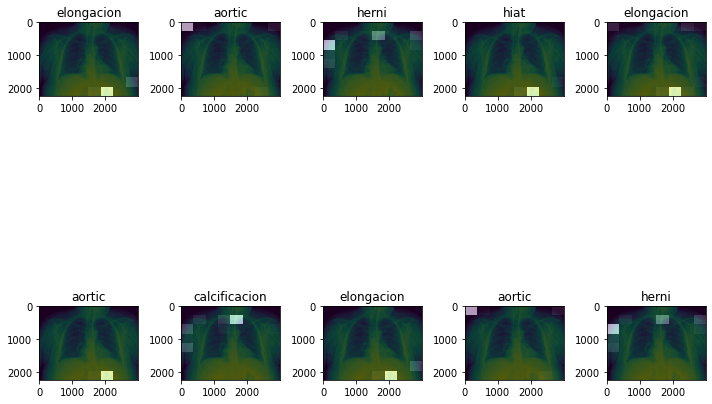

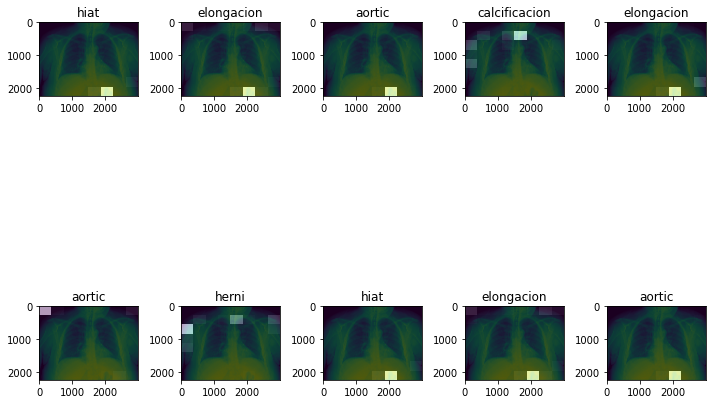

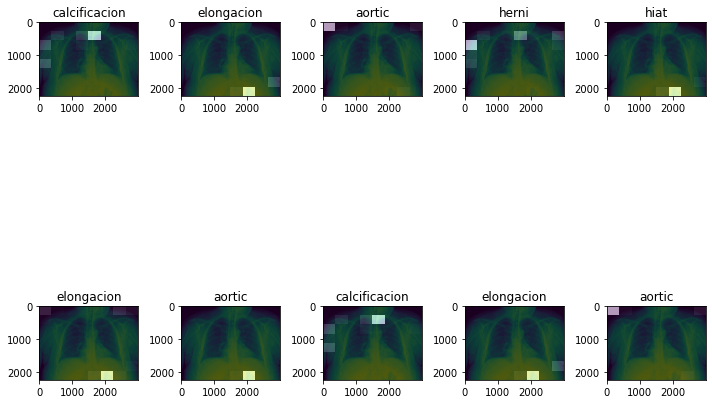

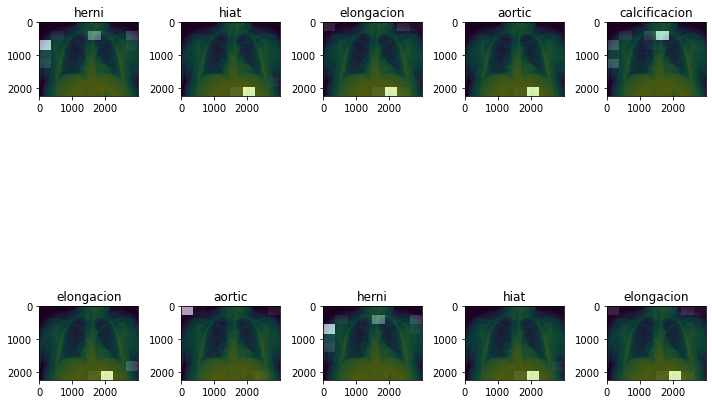

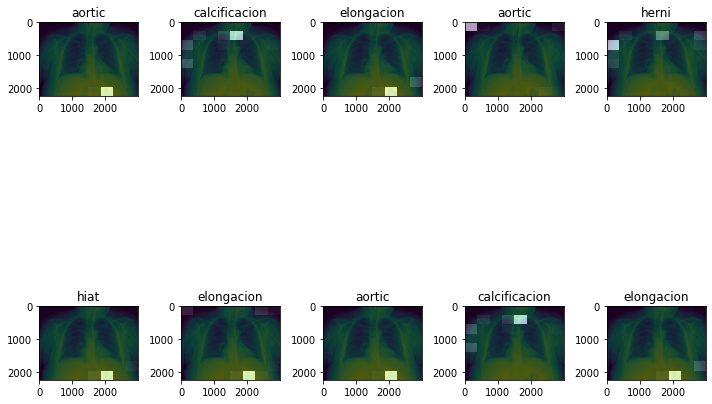

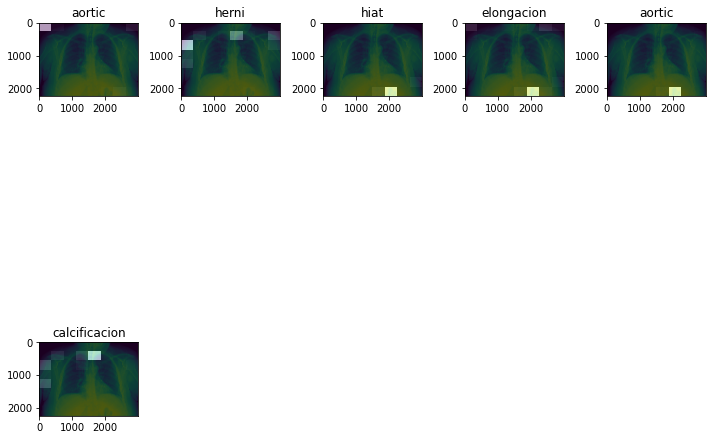

Real Caption: Translated(src=ca, dest=en, text=<Start> kyphoscoliosis not objective or infiltrated CONDENS <end>, pronunciation=<Start> kyphoscoliosis not objective or infiltrated CONDENS <end>, extra_data="{'translat...")
Prediction Caption: Liger Acuña previous cuerpo con dorsal catch aere <end>


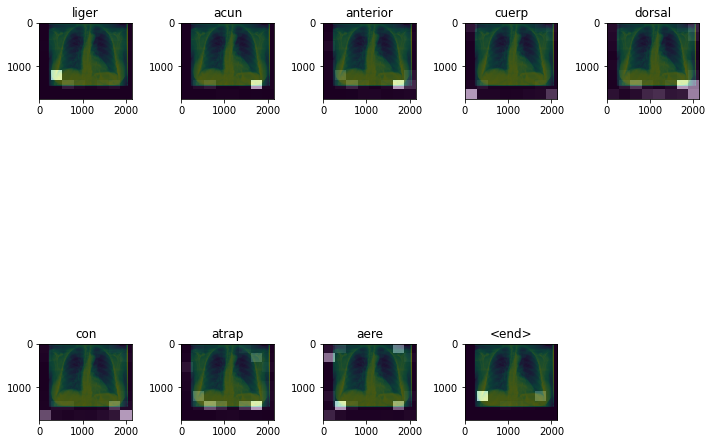

Real Caption: Translated(src=ca, dest=en, text=<Start> hallazgos radiology sin means <end>, pronunciation=<Start> hallazgos radiology sin means <end>, extra_data="{'translat...")
Prediction Caption: Relevant sin hallazg <end>


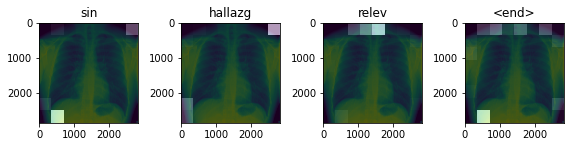

Real Caption: Translated(src=ca, dest=en, text=<Start> imag nodules are suprahili Derech could correspond with lymph discreet effects with interstitial lung vecind ls ipsilateral upper lobe volume ASOC Liger lost Derech said hallazg antecedent patient cre Habra discard alternating diagnost tubercular infection Derech calcified paratracheal lymph sin <end>, pronunciation=<Start> imag nodules are suprahili Derech could correspond with lymph discreet effects with interstitial lung vecind ls ipsilateral upper lobe volume ASOC Liger lost Derech said hallazg antecedent patient cre Habra discard alternating diagnost tubercular infection Derech calcified paratracheal lymph sin <end>, extra_data="{'translat...")
Prediction Caption: comp <end>


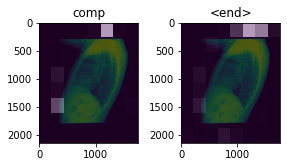

Real Caption: Translated(src=ca, dest=en, text=<Start> Taman large hiatal hernia sign radiology COPD <end>, pronunciation=<Start> Taman large hiatal hernia sign radiology COPD <end>, extra_data="{'translat...")
Prediction Caption: bilateral interstitial pattern <end>


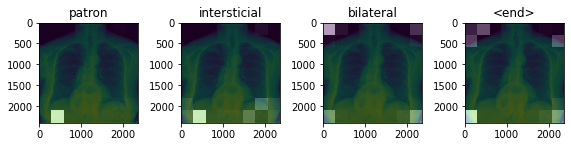

Real Caption: Translated(src=ca, dest=en, text=<Start> elevation hemidiafragm left with contralateral desplaz Silhouette cardiac present preliminary study Cambi no relevant previous study with respect comp <end>, pronunciation=<Start> elevation hemidiafragm left with contralateral desplaz Silhouette cardiac present preliminary study Cambi no relevant previous study with respect comp <end>, extra_data="{'translat...")
Prediction Caption: hallazg sin <end>


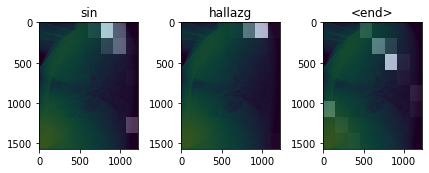

Real Caption: Translated(src=ca, dest=en, text=<Start> knee prosthesis alineacion Conserv sin pray alter <end>, pronunciation=<Start> knee prosthesis alineacion Conserv sin pray alter <end>, extra_data="{'translat...")
Prediction Caption: lumbar scoliosis <end>


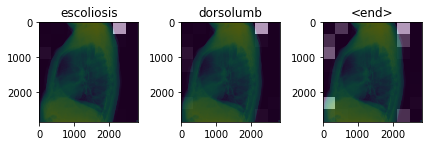

Real Caption: Translated(src=ca, dest=en, text=<Start> sternotomy partner cerclage suture metal proyect Silhouette superior cardiac antecedent relationship with calcified aortic atheromatous coronary Revascularization sin hallazg relevant <end>, pronunciation=<Start> sternotomy partner cerclage suture metal proyect Silhouette superior cardiac antecedent relationship with calcified aortic atheromatous coronary Revascularization sin hallazg relevant <end>, extra_data="{'translat...")
Prediction Caption: Derech hemidiaphragm elevation with COPD sign radiology Liger hemidiaphragm elevation <end>


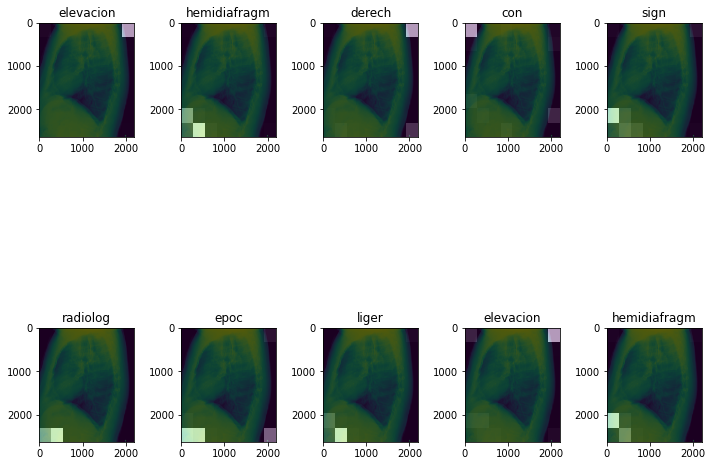

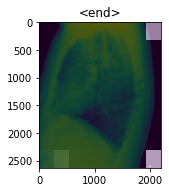

In [ ]:
from googletrans import Translator
translator = Translator()
for i in range(100):
  # captions on the validation set
  rid = np.random.randint(0, len(img_name_val))
  image = img_name_val[rid]
  real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
  result, attention_plot = evaluate(image)
  result_str = " ".join(result)
  translated_resut=translator.translate(result_str,src='ca')
  translated_real_caption=translator.translate(real_caption,src='ca')
  print ('Real Caption:', translated_real_caption)
  print ('Prediction Caption:', ''.join(translated_resut.text))
  plot_attention(image, result, attention_plot)
  # opening the image
  Image.open(img_name_val[rid])

## Try it on your own images
For fun, below we've provided a method you can use to caption your own images with the model we've just trained. Keep in mind, it was trained on a relatively small amount of data, and your images may be different from the training data (so be prepared for weird results!)


In [ ]:
image_url = ''
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension,
                                     origin=image_url)

result, attention_plot = evaluate(image_path)
print ('Prediction Caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)
# opening the image
Image.open(image_path)